In [2]:
import sys
# sys.path.append('/home/cmu/github/LPBFDiffusionSR/datasets')
import numpy as np
from pylab import gca
import numpy as np
import math
from tqdm import tqdm
import torch
import torchvision
import torch.nn as nn
from torch.utils import data
import torch.nn.functional as F
from torchvision import transforms
from torchvision.utils import save_image
from torchvision.datasets import MNIST
import torchvision.transforms.functional as TF
from torch.optim import lr_scheduler
import time
import os
from skimage.metrics import structural_similarity as ssim_id

import cv2
import os
from torchvision import transforms
from torch.utils.data import DataLoader
from pathlib import Path
from torch.utils.data import Dataset
import pdb
from PIL import Image
import matplotlib.pyplot as plt 
# print(os.listdir('.'))
# from datasets.dataset import TemperatureXZDataset
from runners.train_diffusion import forwardpass
from analysis_functions import predict_lrenc, predict_mobilenet, predict_ddim_diffusion,predict_modified_diffusion, predict_diffusion, plot_images, get_profile, load_mobilenet, load_encoder, load_diffusion, PSNR, SSIM, multifield_plot_images

In [3]:
def frame_tick(frame_width = 2, tick_width = 1.5):
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(frame_width)
    plt.tick_params(direction = 'in', 
                    width = tick_width)
def legend(location = 'best', fontsize = 8):
        plt.legend(loc = location, fontsize = fontsize, frameon = False)

### Define results directory

In [4]:
diffusion_results_dir = '/home/oogoke/DiffusionSR/runs/direct/diffusionimplicitencoded/2023_03_20_16_11_43/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/diffusionimplicitencoded/2023_03_19_22_56_20/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/diffusionimplicitencoded/2023_03_17_03_43_34/rescaling/n_steps_1'
encoder_results_dir = '/home/oogoke/DiffusionSR/runs/direct/encoder/2023_03_20_16_11_43/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/encoder/2023_03_19_22_56_20/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/encoder/2023_03_17_03_43_34/rescaling/n_steps_1'
mobilenet_results_dir = '/home/oogoke/DiffusionSR/runs/clean/direct/mobilenet/2022_12_05_03_17_09'


### Plot Train, Test Loss for diffusion

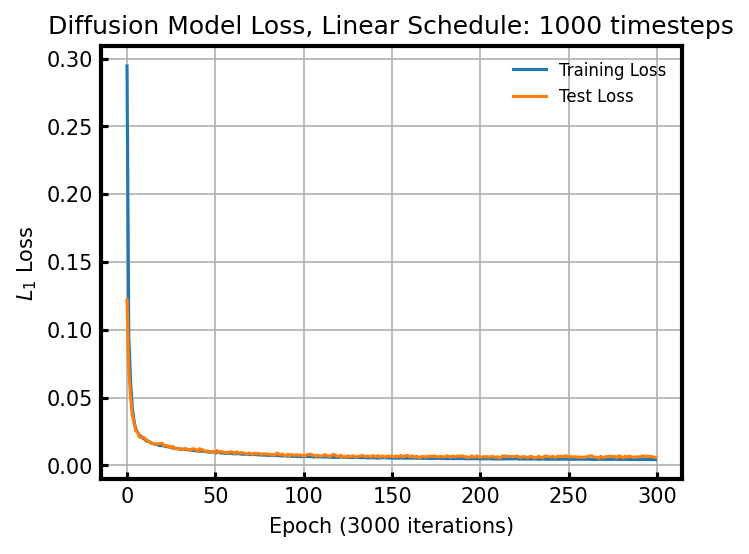

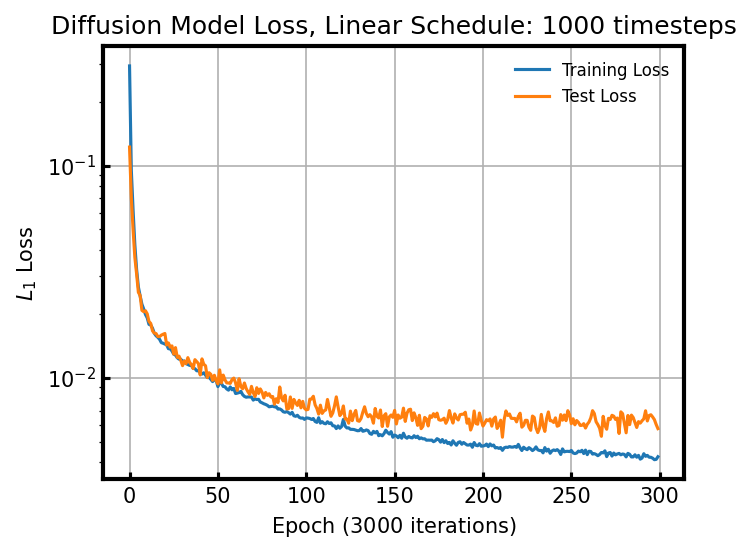

In [5]:
import numpy as np
test_loss = np.loadtxt(os.path.join(diffusion_results_dir, 'validation_loss_epoch.txt'))
train_loss = np.loadtxt(os.path.join(diffusion_results_dir, 'loss_epoch.txt'))

plt.figure(figsize = np.array([4,3])*1.25, dpi = 150)

plt.plot(train_loss[:], label = 'Training Loss')
plt.plot(test_loss[:], label = 'Test Loss')

# plt.plot(np.mean(test_loss[:24*70].reshape(-1, 24), axis=1), label = "Validation Loss")

plt.xlabel(r'Epoch ($3000$ iterations)')
plt.ylabel(r'$L_1$ Loss')
legend()

plt.title('Diffusion Model Loss, Linear Schedule: 1000 timesteps')
plt.grid(which = 'major')
frame_tick()

plt.figure(figsize = np.array([4,3])*1.25, dpi = 150)

plt.plot(train_loss[:], label = 'Training Loss')
plt.plot(test_loss[:], label = 'Test Loss')

# plt.plot(np.mean(test_loss[:24*70].reshape(-1, 24), axis=1), label = "Validation Loss")

plt.xlabel(r'Epoch ($3000$ iterations)')
plt.ylabel(r'$L_1$ Loss')
legend()

plt.title('Diffusion Model Loss, Linear Schedule: 1000 timesteps')
plt.grid(which = 'major')
frame_tick()
plt.yscale('log')

In [6]:
p_dir = '/home/oogoke/DiffusionSR/runs/clean/direct/diffusionno_residual'
sub_p_dirs = ['2022_12_19_02_51_24/standardize/n_steps_1', '2022_12_19_02_51_11/standardize/n_steps_1']
timesteps = [1000, 1500]

In [7]:
class Simulation():
    def __init__(self, folder, diff_steps, schedule):
        self.folder = folder
        self.diff_steps = diff_steps
        self.schedule = schedule
        self.kp = None
        self.profile = None
        self.max_depth = None
        self.kp_depth = None
    def get_loss_curve(self):
        test_loss = np.loadtxt(os.path.join(self.folder, 'test_loss_epoch.txt'))
        train_loss = np.loadtxt(os.path.join(self.folder, 'loss_epoch.txt'))
        return train_loss, test_loss
simlinear1000 = Simulation(os.path.join(p_dir, '2022_12_19_02_51_24/standardize/n_steps_1'), 1000, 'linear')


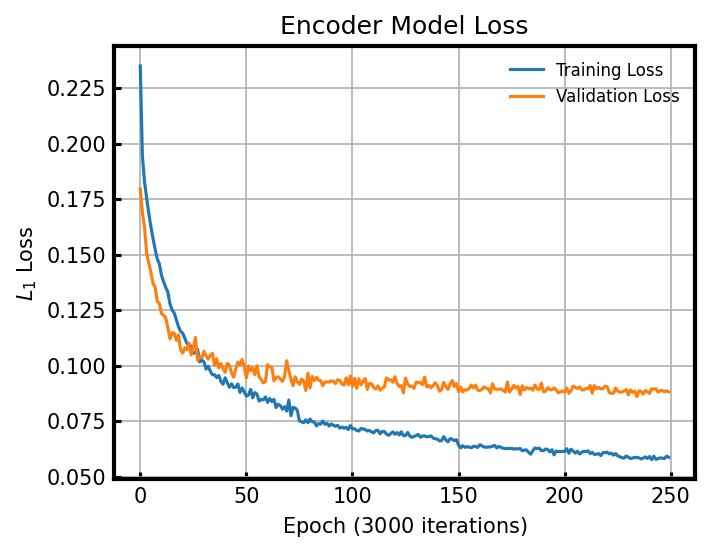

In [8]:
import numpy as np
test_loss = np.loadtxt(os.path.join(encoder_results_dir, 'test_loss.txt'))
train_loss = np.loadtxt(os.path.join(encoder_results_dir, 'train_loss.txt'))

plt.figure(figsize = np.array([4,3])*1.25, dpi = 150)

plt.plot(train_loss[:], label = 'Training Loss')
plt.plot(test_loss, label = "Validation Loss")

plt.xlabel(r'Epoch ($3000$ iterations)')
plt.ylabel(r'$L_1$ Loss')
legend()

plt.title('Encoder Model Loss')
plt.grid(which = 'major')
frame_tick()

In [9]:
from datasets.dataset import SimulationXZDataset
image_size = 80
channels = 1
batch_size =16
field_names = ['temperature']
train_dataset = SimulationXZDataset(downscale_method = 'direct', split = 'train', root_folder = '/home/oogoke/DiffusionSR/datasets/expanded_ss316l_all_laser_velocity_xz_cross_section_data', return_info = True, field_names =  field_names, normalize = 'standardize')
test_dataset = SimulationXZDataset(downscale_method ='direct', split = 'test', root_folder = '/home/oogoke/DiffusionSR/datasets/expanded_ss316l_all_laser_velocity_xz_cross_section_data', return_info = True, field_names =  field_names, normalize = 'standardize')
dev_dataset = SimulationXZDataset(downscale_method = 'direct', split = 'dev', root_folder = '/home/oogoke/DiffusionSR/datasets/expanded_ss316l_all_laser_velocity_xz_cross_section_data', return_info = True, field_names =  field_names, normalize = 'standardize')

dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
dev_dataloader = DataLoader(dev_dataset, batch_size=1, shuffle=False, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=True)


Using normalize method: ... standardize
Using specific fields,  ['temperature']
Processing dataset with 1 fields
Using normalize method: ... standardize
Using specific fields,  ['temperature']
Processing dataset with 1 fields
Using normalize method: ... standardize
Using specific fields,  ['temperature']
Processing dataset with 1 fields


In [10]:
from models.diffusion_model import Unet
from models.lr_encoder_model import rrdbnet_encoder as rrdbnet_x4
os.environ['CUDA_VISIBLE_DEVICES']  = "5"
device = 'cuda'
criterion = torch.nn.L1Loss()
multi_field_results_dir = 'expanded_results'
lr_enc = load_encoder(encoder_results_dir, dataset = train_dataset)
model = load_diffusion(diffusion_results_dir, dataset = train_dataset)
batch_size = 2
dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, drop_last=True)



In [11]:


def compute_alpha(beta, t):
    beta = torch.cat([torch.zeros(1).to(beta.device), beta], dim=0).to(device)
    # print(beta.device, t.device)
    a = (1 - beta).cumprod(dim=0).index_select(0, t + 1).view(-1, 1, 1, 1)
    return a

def predict_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, dataset, seq, factor = 2, timesteps = 200, skip = 1, schedule = 'linear', **kwargs):
    
    # skip =timesteps // self.args.timesteps
    seq = range(0, timesteps, skip)
    
    def cosine_beta_schedule(timesteps, s=0.008):

        steps = timesteps + 1
        x = torch.linspace(0, timesteps, steps)
        alphas_cumprod = torch.cos(
            ((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return torch.clip(betas, 0.0001, 0.9999)

    def linear_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start, beta_end, timesteps)


    def quadratic_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

    def sigmoid_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        betas = torch.linspace(-6, 6, timesteps)
        return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start
    if schedule == 'linear':
        betas = linear_beta_schedule(timesteps=timesteps)
    elif schedule == 'quadratic':
        betas = quadratic_beta_schedule(timesteps=timesteps)
    elif schedule == 'cosine':
        betas = cosine_beta_schedule(timesteps=timesteps)
    elif schedule == 'sigmoid':
        betas = sigmoid_beta_schedule(timesteps=timesteps)
    b = betas

    if len(lr.shape) < 4:
        img = (lr.view(lr.shape[0], 1, lr.shape[1], lr.shape[2]).to(device))
        target = (hr.view(hr.shape[0], 1, hr.shape[1], hr.shape[2]).to(device))
    else:
        img = lr.to(device)
        target = hr.to(device)
    if len(lr.shape)< 4:

        x_e = forwardpass(lr_enc, lr.view(lr.shape[0],1, lr.shape[1], lr.shape[2]).to(device).float(), factor = factor)
    else:
        x_e = forwardpass(lr_enc, lr.to(device).float(), factor = factor)
    # batches = num_to_groups(1, lr.shape[0])
    shape=hr.shape
    # print(timesteps, batches, img.shape[0])
    # print(x_e.shape)
    # with torch.no_grad():
    #     n = img.size(0)
    #     seq_next = [-1] + list(seq[:-1])
    #     x0_preds = []
        
    #     x = torch.randn(shape, device=device)
    #     xs = [x]
    #     for i, j in zip(reversed(seq), reversed(seq_next)):
    #         t = (torch.ones(n) * i).to(x.device)
    #         next_t = (torch.ones(n) * j).to(x.device)
    #         at = compute_alpha(b, t.long())
    #         at_next = compute_alpha(b, next_t.long())
    #         xt = xs[-1].to('cuda')
    #         et = model(x, t, x_e)#model(xt, t)
    #         x0_t = (xt - et * (1 - at).sqrt()) / at.sqrt()
    #         x0_preds.append(x0_t.to('cpu'))
    #         c1 = (
    #             kwargs.get("eta", 0) * ((1 - at / at_next) * (1 - at_next) / (1 - at)).sqrt()
    #         )
    #         c2 = ((1 - at_next) - c1 ** 2).sqrt()
    #         xt_next = at_next.sqrt() * x0_t + c1 * torch.randn_like(x) + c2 * et
    #         xs.append(xt_next.to('cpu'))
    with torch.no_grad():
        x = torch.randn(shape, device=device)
        n = x.size(0)
        seq_next = [-1] + list(seq[:-1])
        x0_preds = []
        xs = [x]
        for i, j in zip(reversed(seq), reversed(seq_next)):
            t = (torch.ones(n) * i).to(x.device)
            next_t = (torch.ones(n) * j).to(x.device)
            at = compute_alpha(b, t.long())
            at_next = compute_alpha(b, next_t.long())
            xt = xs[-1].to('cuda')
            et = model(xt, t, x_e)
            x0_t = (xt - et * (1 - at).sqrt()) / at.sqrt()
            x0_preds.append(x0_t.to('cpu'))
            c1 = (
                kwargs.get("eta", 0) * ((1 - at / at_next) * (1 - at_next) / (1 - at)).sqrt()
            )
            c2 = ((1 - at_next) - c1 ** 2).sqrt()
            xt_next = at_next.sqrt() * x0_t + c1 * torch.randn_like(x) + c2 * et
            xs.append(xt_next.to('cpu'))
    # print(len(x0_preds),x0_preds[0].shape, len(xs))
    # return xs, x0_preds
    result = dataset.unscale_data(xs[-1], input_type = 'hr') 
    return dataset.unscale_data(lr, input_type='lr'), result, dataset.unscale_data(target.cpu(), input_type = 'hr'), xs, b


def compute_alpha(beta, t):
    beta = torch.cat([torch.zeros(1).to(beta.device), beta], dim=0).to(device)
    # print(beta.device, t.device)
    a = (1 - beta).cumprod(dim=0).index_select(0, t + 1).view(-1, 1, 1, 1)
    return a

def predict_ddpm_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, dataset, seq, timesteps = 200, skip = 1, schedule = 'linear', **kwargs):
    
    # skip =timesteps // self.args.timesteps
    seq = range(0, timesteps, skip)
    
    def cosine_beta_schedule(timesteps, s=0.008):

        steps = timesteps + 1
        x = torch.linspace(0, timesteps, steps)
        alphas_cumprod = torch.cos(
            ((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return torch.clip(betas, 0.0001, 0.9999)

    def linear_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start, beta_end, timesteps)


    def quadratic_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

    def sigmoid_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        betas = torch.linspace(-6, 6, timesteps)
        return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start
    if schedule == 'linear':
        betas = linear_beta_schedule(timesteps=timesteps)
    elif schedule == 'quadratic':
        betas = quadratic_beta_schedule(timesteps=timesteps)
    elif schedule == 'cosine':
        betas = cosine_beta_schedule(timesteps=timesteps)
    elif schedule == 'sigmoid':
        betas = sigmoid_beta_schedule(timesteps=timesteps)
    b = betas

    if len(lr.shape) < 4:
        img = (lr.view(lr.shape[0], 1, lr.shape[1], lr.shape[2]).to(device))
        target = (hr.view(hr.shape[0], 1, hr.shape[1], hr.shape[2]).to(device))
    else:
        img = lr.to(device)
        target = hr.to(device)
    if len(lr.shape)< 4:

        x_e = forwardpass(lr_enc, lr.view(lr.shape[0],1, lr.shape[1], lr.shape[2]).to(device).float(), factor = dataset.factor)
    else:
        x_e = forwardpass(lr_enc, lr.to(device).float(), factor = dataset.factor)
    # batches = num_to_groups(1, lr.shape[0])
    shape=hr.shape
    # print(timesteps, batches, img.shape[0])
    # print(x_e.shape)
    with torch.no_grad():
        x = torch.randn(shape, device=device)
        n = x.size(0)
        seq_next = [-1] + list(seq[:-1])
        xs = [x]
        x0_preds = []
        betas = b
        for i, j in zip(reversed(seq), reversed(seq_next)):

            noise = torch.randn_like(x)


            t = (torch.ones(n) * i).to(x.device)
            next_t = (torch.ones(n) * j).to(x.device)
            at = compute_alpha(betas, t.long())
            atm1 = compute_alpha(betas, next_t.long())
            beta_t = 1 - at / atm1
            x = xs[-1].to('cuda')

            et =model(x, t, x_e)
            # e = output

            x0_from_e = (1.0 / at).sqrt() * x - (1.0 / at - 1).sqrt() * et
            # x0_from_e = torch.clamp(x0_from_e, -1, 1)
            x0_preds.append(x0_from_e.to('cpu'))
            mean_eps = (
                (atm1.sqrt() * beta_t) * x0_from_e + ((1 - beta_t).sqrt() * (1 - atm1)) * x
            ) / (1.0 - at)

            mean = mean_eps
            # noise = torch.randn_like(x)
            mask = 1 - (t == 0).float()
            mask = mask.view(-1, 1, 1, 1)
            logvar = beta_t.log()
            sample = mean + mask * torch.exp(0.5 * logvar) * noise
            # sample = mean + mask * c1 * noise

            # print(torch.sum(sample-xt_next))
            xs.append(sample.to('cpu'))
    # print(len(x0_preds),x0_preds[0].shape, len(xs))
    # return xs, x0_preds
    result = dataset.unscale_data(xs[-1], input_type = 'hr') 
    return dataset.unscale_data(lr, input_type='lr'), result, dataset.unscale_data(target.cpu(), input_type = 'hr'), xs, b



In [12]:

device = 'cuda'


def compute_alpha(beta, t):
    beta = torch.cat([torch.zeros(1).to(beta.device), beta], dim=0).to(device)
    # print(beta.device, t.device)
    a = (1 - beta).cumprod(dim=0).index_select(0, t + 1).view(-1, 1, 1, 1)
    return a



def predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, encoding, dataset, seq, timesteps = 200, skip = 1, schedule = 'linear', **kwargs):
    
    # skip =timesteps // self.args.timesteps
    seq = range(0, timesteps, skip)
    
    def cosine_beta_schedule(timesteps, s=0.008):

        steps = timesteps + 1
        x = torch.linspace(0, timesteps, steps)
        alphas_cumprod = torch.cos(
            ((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return torch.clip(betas, 0.0001, 0.9999)

    def linear_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start, beta_end, timesteps)


    def quadratic_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

    def sigmoid_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        betas = torch.linspace(-6, 6, timesteps)
        return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start
    if schedule == 'linear':
        betas = linear_beta_schedule(timesteps=timesteps)
    elif schedule == 'quadratic':
        betas = quadratic_beta_schedule(timesteps=timesteps)
    elif schedule == 'cosine':
        betas = cosine_beta_schedule(timesteps=timesteps)
    elif schedule == 'sigmoid':
        betas = sigmoid_beta_schedule(timesteps=timesteps)
    b = betas

    if len(lr.shape) < 4:
        img = (lr.view(lr.shape[0], 1, lr.shape[1], lr.shape[2]).to(device))
        target = (hr.view(hr.shape[0], 1, hr.shape[1], hr.shape[2]).to(device))
    else:
        img = lr.to(device)
        target = hr.to(device)
    if encoding:
            # x_e = forwardpass(lr_enc, lr.to(device).float(), factor = train_dataset.factor)
        if len(lr.shape)< 4:
            x_e = forwardpass(lr_enc, lr.view(lr.shape[0],1, lr.shape[1], lr.shape[2]).to(device).float(), factor = 2)
        else:
            x_e = forwardpass(lr_enc, lr.to(device).float(), factor = 2)
    else:
        x_e = upscaled_lr.to(device).float().repeat(1,1,1, 1)
    
    # batches = num_to_groups(1, lr.shape[0])
    shape=hr.shape
    # print(timesteps, batches, img.shape[0])
    # print(x_e.shape)
    # with torch.no_grad():
    #     n = img.size(0)
    #     seq_next = [-1] + list(seq[:-1])
    #     x0_preds = []
        
    #     x = torch.randn(shape, device=device)
    #     xs = [x]
    #     for i, j in zip(reversed(seq), reversed(seq_next)):
    #         t = (torch.ones(n) * i).to(x.device)
    #         next_t = (torch.ones(n) * j).to(x.device)
    #         at = compute_alpha(b, t.long())
    #         at_next = compute_alpha(b, next_t.long())
    #         xt = xs[-1].to('cuda')
    #         et = model(x, t, x_e)#model(xt, t)
    #         x0_t = (xt - et * (1 - at).sqrt()) / at.sqrt()
    #         x0_preds.append(x0_t.to('cpu'))
    #         c1 = (
    #             kwargs.get("eta", 0) * ((1 - at / at_next) * (1 - at_next) / (1 - at)).sqrt()
    #         )
    #         c2 = ((1 - at_next) - c1 ** 2).sqrt()
    #         xt_next = at_next.sqrt() * x0_t + c1 * torch.randn_like(x) + c2 * et
    #         xs.append(xt_next.to('cpu'))
    with torch.no_grad():
        x = torch.randn(shape, device=device)
        n = x.size(0)
        seq_next = [-1] + list(seq[:-1])
        x0_preds = []
        xs = [x]
        for i, j in zip(reversed(seq), reversed(seq_next)):
            t = (torch.ones(n) * i).to(x.device)
            next_t = (torch.ones(n) * j).to(x.device)
            at = compute_alpha(b, t.long())
            at_next = compute_alpha(b, next_t.long())
            xt = xs[-1].to('cuda')
            et = model(xt, t, x_e)
            x0_t = (xt - et * (1 - at).sqrt()) / at.sqrt()
            x0_preds.append(x0_t.to('cpu'))
            c1 = (
                kwargs.get("eta", 0) * ((1 - at / at_next) * (1 - at_next) / (1 - at)).sqrt()
            )
            c2 = ((1 - at_next) - c1 ** 2).sqrt()
            xt_next = at_next.sqrt() * x0_t + c1 * torch.randn_like(x) + c2 * et
            xs.append(xt_next.to('cpu'))
    # print(len(x0_preds),x0_preds[0].shape, len(xs))
    # return xs, x0_preds
    result = dataset.unscale_data(xs[-1], input_type = 'hr') 
    return dataset.unscale_data(lr, input_type='lr'), result, dataset.unscale_data(target.cpu(), input_type = 'hr'), xs, b





  8%|▊         | 309/4094 [00:00<00:05, 658.73it/s]

1000 [1] 1
torch.Size([1, 64, 40, 40])
TIMESTEPS == 1000, Schedule = linear


 62%|██████▏   | 2556/4094 [00:02<00:01, 972.48it/s]

1000 [1] 1
torch.Size([1, 64, 40, 40])
TIMESTEPS == 1000, Schedule = linear


 41%|████      | 1675/4094 [00:02<00:03, 619.82it/s]

1000 [1] 1
torch.Size([1, 64, 40, 40])
TIMESTEPS == 1000, Schedule = linear


 42%|████▏     | 1709/4094 [00:13<00:18, 129.07it/s]


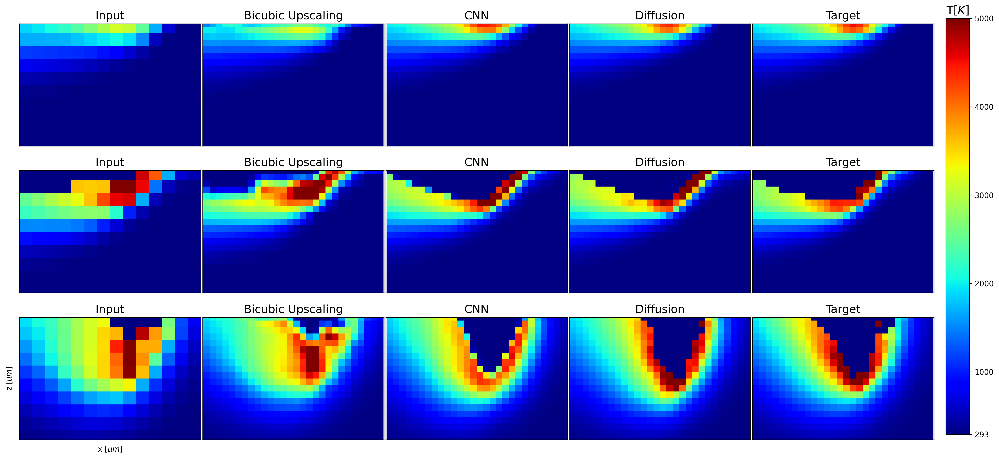

  9%|▉         | 378/4094 [00:00<00:03, 930.28it/s]

1000 [1] 1
torch.Size([1, 64, 40, 40])
TIMESTEPS == 1000, Schedule = linear


 62%|██████▏   | 2543/4094 [00:02<00:01, 915.02it/s]

1000 [1] 1
torch.Size([1, 64, 40, 40])
TIMESTEPS == 1000, Schedule = linear


 64%|██████▍   | 2617/4094 [00:03<00:02, 701.22it/s]


KeyboardInterrupt: 

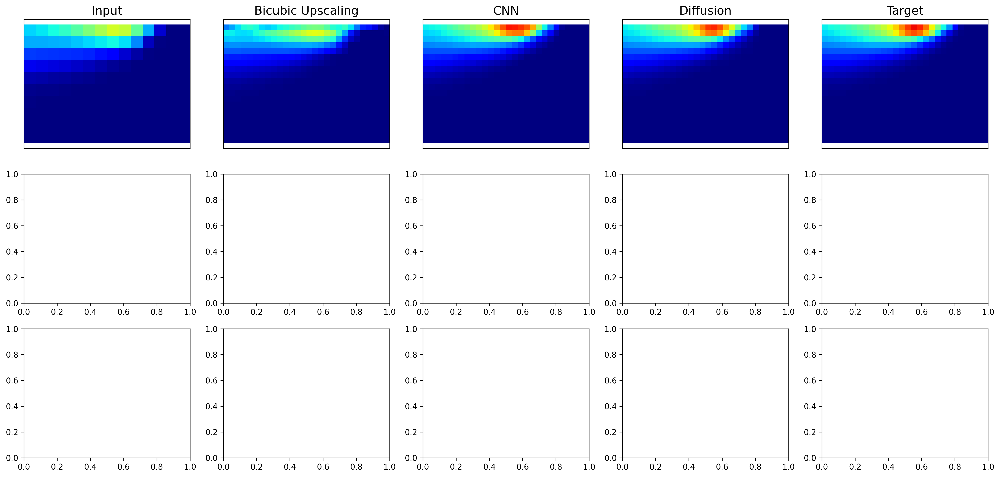

In [16]:
# for array in [input, upscaled_lr_data, result_diffusion, target]:

scaling_factor = 1

labels = ['Input', 'Bicubic Upscaling', 'CNN', 'Diffusion', 'Target']
batch_idxs = [399,2617,1708] # 130v1300 190v250 400v650
# batch_idxs = [0,1,2]
timesteps = 1000
field_idx = 0
skip = 1
for k in range(15):
    fig, axs = plt.subplots(nrows=3, ncols=5, figsize=(2.8*7.8*scaling_factor, 10*scaling_factor), dpi=300)
    fig.patch.set_alpha(0)
    for j,(row, batch_index) in enumerate(zip(axs, batch_idxs)):
        for batch_idx, (res, hr, lr, upscaled_lr, info_full) in tqdm(enumerate(test_dataloader), total = len(test_dataloader) ):
            if batch_idx == batch_index:
                input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
                input, result_diffusion, target = predict_modified_diffusion(model, lr_enc, res, hr,lr, upscaled_lr, dataset = train_dataset, timesteps = 1000, schedule = 'linear')
                # input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,encoding = True,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
                upscaled_lr_data = test_dataloader.dataset.unscale_data(upscaled_lr, input_type = 'upscaled_lr')
                for i, (ax, array, label) in enumerate(zip(row,[input, upscaled_lr_data, result, result_diffusion, target], labels )):
                    if i == 0:
                        division_factor = 2
                    else:
                        division_factor  = 1
                    xx, yy = np.meshgrid(np.arange(28//division_factor)*10*division_factor, np.arange(20//division_factor)*10*division_factor)
                    
                    im = ax.pcolormesh(xx, yy, array[field_idx][0,2//division_factor:30//division_factor,array.shape[-1]//4:3*array.shape[-1]//4].T, vmin=293, vmax=5000, cmap='jet')
                    ax.axis('equal')
                    ax.set_ylim([yy.min(), yy.max()])
                    # if i ==  0 and j == 0:
                        
                        
                        # frame_tick()
                    # else:
                    # ax.axis('off')
                    ax.set_title(label, fontsize = 15)
                    ax.xaxis.set_tick_params(labelbottom=False)
                    ax.yaxis.set_tick_params(labelleft =False)
                    ax.set_xticks([])
                    ax.set_yticks([])
                    if j == len(axs) - 1  and i == 0:
                        ax.set_ylabel(r'z $[\mu m]$')
                        ax.set_xlabel(r'x $[\mu m]$')
            elif batch_idx > batch_index:
                break
            
    fig.subplots_adjust(wspace = 0.01)#, hspace = 0.1)
    # fig.subplots_adjust()


    # Add colorbar
    cax = fig.add_axes([0.91, 0.12, 0.02, 0.77])
    clb = fig.colorbar(im, cax=cax)
    clb.set_ticks([293, 1000, 2000, 3000, 4000, 5000])
    clb.ax.set_title(r'T$[K]$', fontsize=15)
    plt.show()

In [13]:

def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

    
def predict_modified_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, dataset, timesteps = 200, schedule = 'linear', transform_rescale = False):
    # take in all 4
    # return rescaled input, result, target
    if len(lr.shape) < 4:
        img = (lr.view(lr.shape[0], 1, lr.shape[1], lr.shape[2]).to(device))
        target = (hr.view(hr.shape[0], 1, hr.shape[1], hr.shape[2]).to(device))
    else:
        img = lr.to(device)
        target = hr.to(device)
    if len(lr.shape)< 4:

        x_e = forwardpass(lr_enc, lr.view(lr.shape[0],1, lr.shape[1], lr.shape[2]).to(device).float(), factor = dataset.factor, transform_rescale =transform_rescale, dataset = dataset)
    else:
        x_e = forwardpass(lr_enc, lr.to(device).float(), factor = dataset.factor, transform_rescale =transform_rescale, dataset =dataset)
    batches = num_to_groups(1, lr.shape[0])
    print(timesteps, batches, img.shape[0])
    print(x_e.shape)


    def extract(a, t, x_shape):
        batch_size = t.shape[0]
        out = a.gather(-1, t.cpu())
        return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)


    torch.manual_seed(0)

    @torch.no_grad()
    def p_sample(model, x, x_e,  t, t_index):
        betas_t = extract(betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = extract(
            sqrt_one_minus_alphas_cumprod, t, x.shape
        )
        sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

        # Equation 11 in the paper
        # Use our model (noise predictor) to predict the mean
        model_mean = sqrt_recip_alphas_t * (
            x - betas_t * model(x, t, x_e) / sqrt_one_minus_alphas_cumprod_t
        )

        if t_index == 0:
            return model_mean
        else:
            posterior_variance_t = extract(posterior_variance, t, x.shape)
            noise = torch.randn_like(x)
            # Algorithm 2 line 4:
            return model_mean + torch.sqrt(posterior_variance_t) * noise

    def savefig(filename):
        plt.savefig(filename, bbox_inches='tight')

    def cosine_beta_schedule(timesteps, s=0.008):
        """
        cosine schedule as proposed in https://arxiv.org/abs/2102.09672
        """
        steps = timesteps + 1
        x = torch.linspace(0, timesteps, steps)
        alphas_cumprod = torch.cos(
            ((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return torch.clip(betas, 0.0001, 0.9999)

    def linear_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start, beta_end, timesteps)


    def quadratic_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

    @torch.no_grad()
    def p_sample_loop(model, x_e, shape, timesteps):
        device = next(model.parameters()).device

        b = shape[0]
        # start from pure noise (for each example in the batch)
        img = torch.randn(shape, device=device)
        imgs = []

        for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
            img = p_sample(model, img, x_e,  torch.full(
                (b,), i, device=device, dtype=torch.long), i)
            imgs.append(img.cpu())
        return imgs

    def sigmoid_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        betas = torch.linspace(-6, 6, timesteps)
        return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

    # def num_to_groups(num, divisor):
    #     groups = num // divisor
    #     remainder = num % divisor
    #     arr = [divisor] * groups
    #     if remainder > 0:
    #         arr.append(remainder)
    #     return arr

    @torch.no_grad()
    def sample(model, x_e, image_size, timesteps, batch_size=16, channels=3):
        return p_sample_loop(model, x_e, timesteps=timesteps, shape=(batch_size, channels, image_size, image_size))

    if schedule == 'linear':
        betas = linear_beta_schedule(timesteps=timesteps)
    elif schedule == 'quadratic':
        betas = quadratic_beta_schedule(timesteps=timesteps)
    elif schedule == 'cosine':
        betas = cosine_beta_schedule(timesteps=timesteps)
    elif schedule == 'sigmoid':
        betas = sigmoid_beta_schedule(timesteps=timesteps)
    print("TIMESTEPS == {}, Schedule = {}".format(timesteps, schedule))

    # define alphas
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = nn.functional.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)

    # calculations for diffusion q(x_t | x_{t-1}) and others
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

    # calculations for posterior q(x_{t-1} | x_t, x_0)
    posterior_variance = betas * \
        (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)


    # forward diffusion
    def q_sample(x_start, t, noise=None):
        if noise is None:
            noise = torch.randn_like(x_start)

        sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
        sqrt_one_minus_alphas_cumprod_t = extract(
            sqrt_one_minus_alphas_cumprod, t, x_start.shape
        )
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise


    all_images_list = list(map(lambda n: sample(model, x_e = x_e, timesteps = timesteps, image_size = x_e.shape[-1],  batch_size=img.shape[0], channels=1), batches))[0]
    all_images = torch.stack(all_images_list, dim=0)
    result = dataset.unscale_data(all_images.numpy()[-1], input_type = 'hr') 
    
    return dataset.unscale_data(lr, input_type='lr'), result, dataset.unscale_data(target.cpu(), input_type = 'hr')


In [58]:
from skimage import measure
def get_profile(image, mesh = 5, max_idx = None):
    # print(image.shape)
    image = image[0].T
    thresh = image > 1900
    
    labeled = measure.label(thresh)
    props = measure.regionprops(labeled)
    # print(props)
    binarized = np.copy(thresh)
    max_area = np.argmax([p.area for p in props])
    mp_label = props[max_area].label
    binarized[labeled != mp_label] = 0
    profile = []
    keyholeprofile = []
    
    for i in range(binarized.shape[1]):
        coords = np.where(binarized[:,i])[0]
        if len(coords) > 0:
            profile.append(np.min(coords))
            keyholeprofile.append(np.max(coords))
        else:
            if max_idx == None:

                profile.append(binarized.shape[1])
                keyholeprofile.append(binarized.shape[1])
            else:
                profile.append(max_idx)
                # keyholeprofile.append(binarized.shape[1])
                keyholeprofile.append(max_idx)
    profile = np.array(profile)
    keyholeprofile = np.array(keyholeprofile)
    return(profile, keyholeprofile)

 62%|██████▏   | 2545/4094 [00:03<00:01, 919.39it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


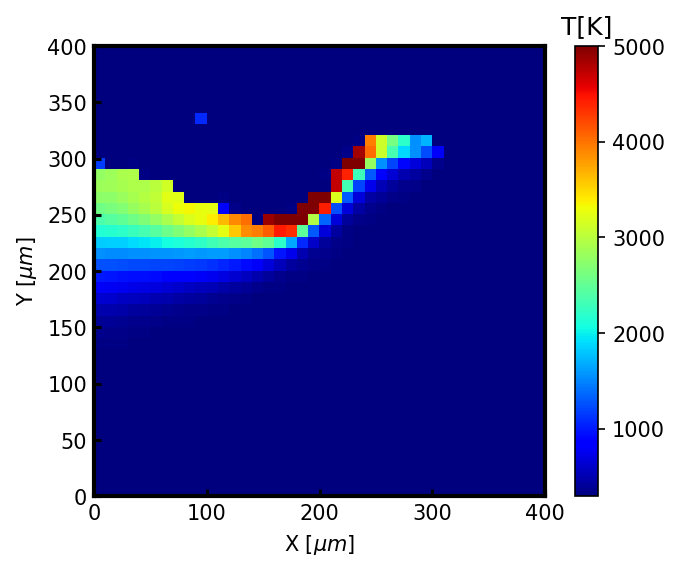

 63%|██████▎   | 2598/4094 [00:02<00:01, 946.41it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


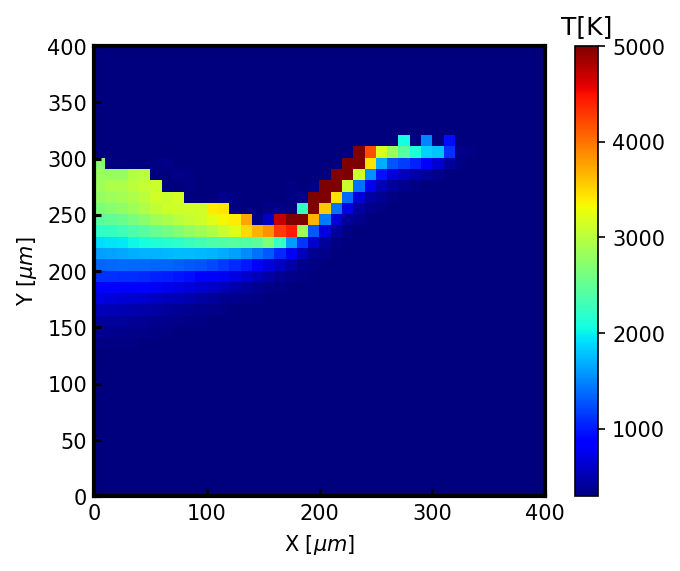

 63%|██████▎   | 2593/4094 [00:02<00:01, 949.08it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


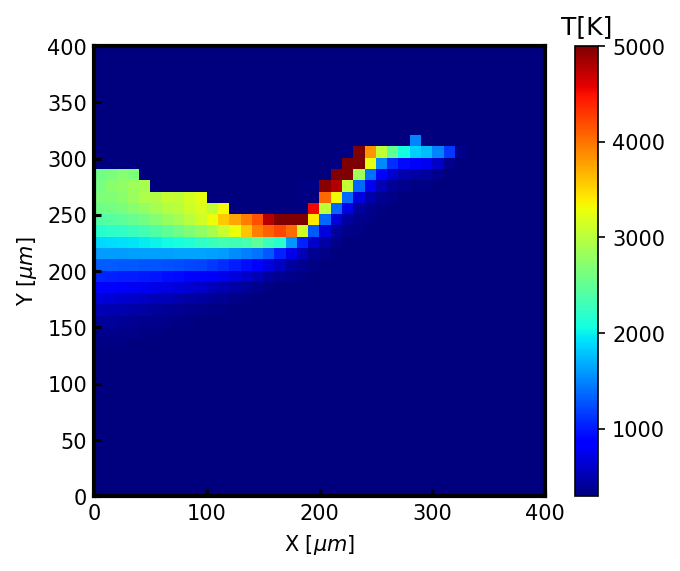

 62%|██████▏   | 2539/4094 [00:03<00:01, 827.86it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


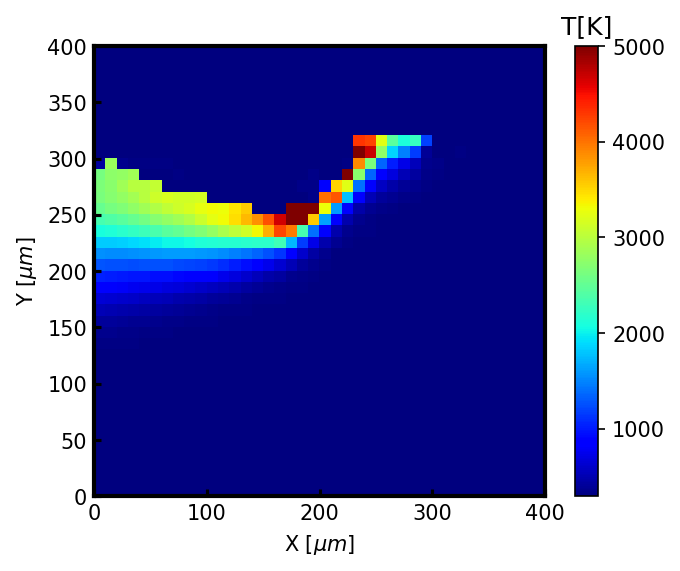

 62%|██████▏   | 2553/4094 [00:02<00:01, 907.66it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


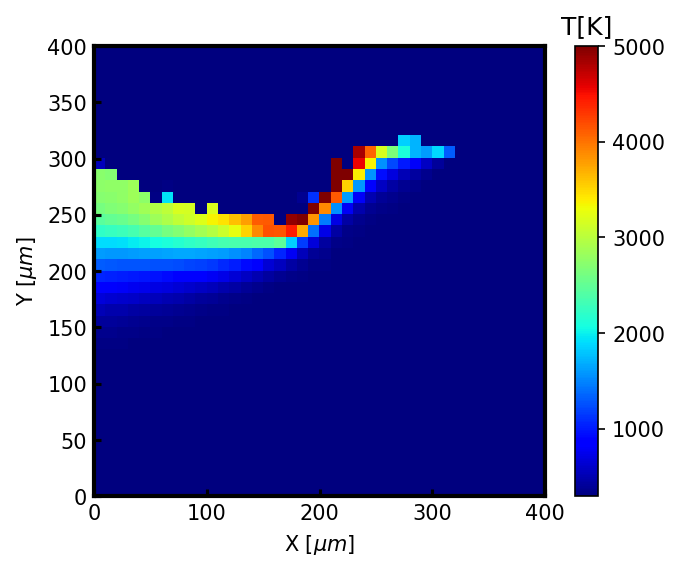

 62%|██████▏   | 2556/4094 [00:02<00:01, 911.02it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


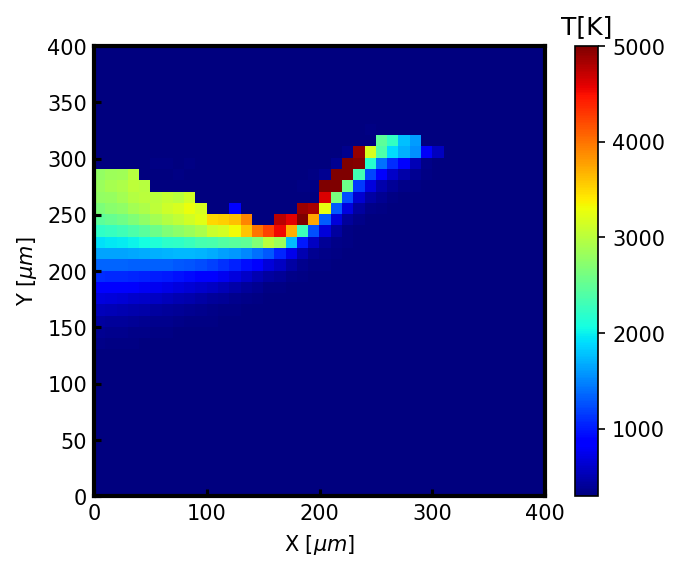

 63%|██████▎   | 2578/4094 [00:02<00:01, 919.34it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


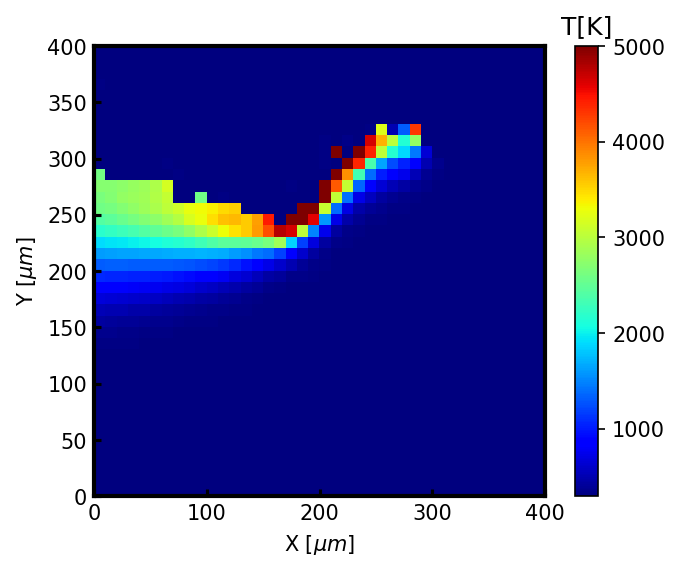

 62%|██████▏   | 2533/4094 [00:03<00:01, 871.19it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


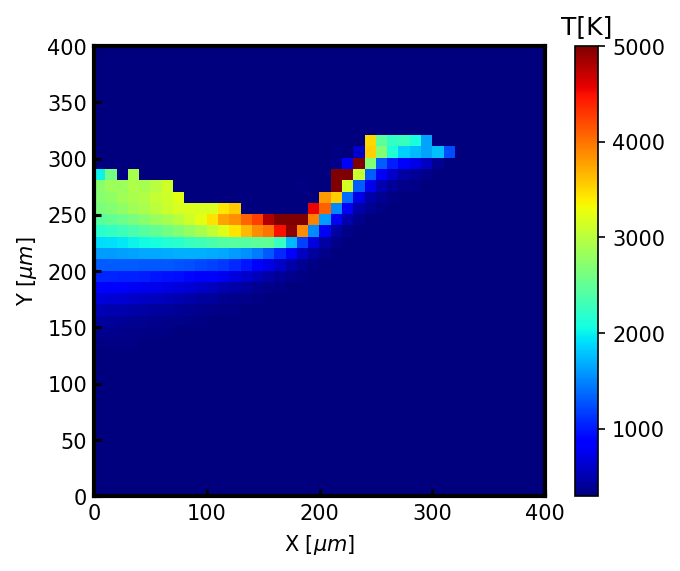

 62%|██████▏   | 2527/4094 [00:02<00:01, 901.92it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


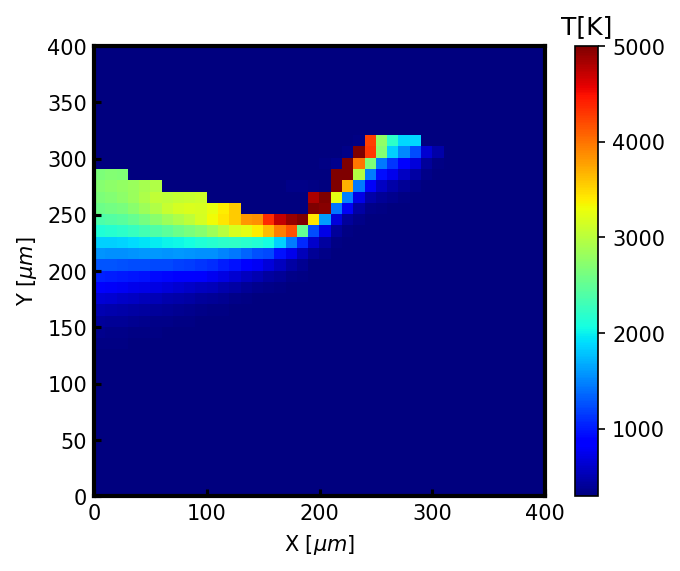

 64%|██████▍   | 2617/4094 [00:02<00:01, 891.76it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


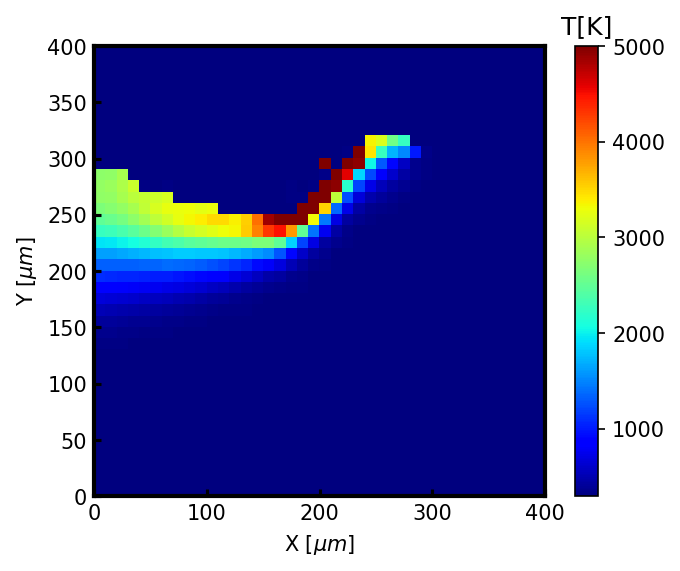

 63%|██████▎   | 2562/4094 [00:02<00:01, 898.19it/s]

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 20, 20)


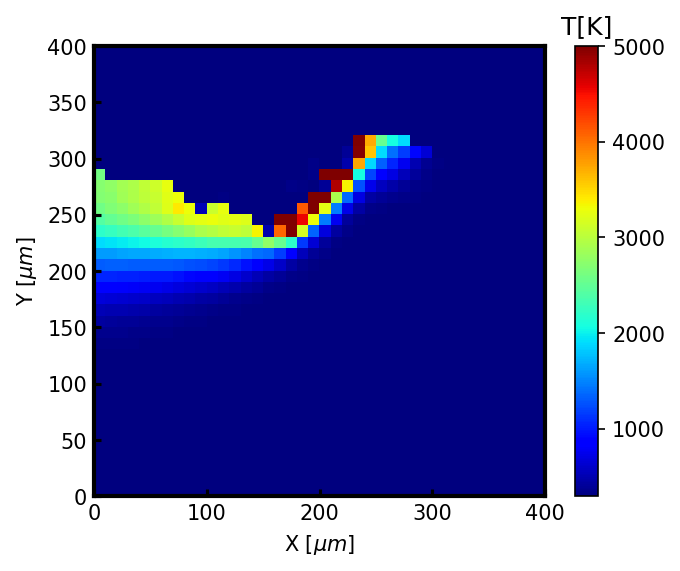

 94%|█████████▍| 3848/4094 [00:04<00:00, 779.15it/s]


KeyboardInterrupt: 

In [95]:
results = []
for i in range(15):
    for batch_idx, (res, hr, lr, upscaled_lr, info_full) in tqdm(enumerate(test_dataloader), total = len(test_dataloader) ):
        if batch_idx == 2617:
            # input, result_diffusion, target,_,_ = predict_ddpm_diffusion(model, lr_enc, res, hr,lr, upscaled_lr, dataset = train_dataset, timesteps = 1000, schedule = 'linear',seq = np.arange(1000))
            # plt.imshow(result_diffusion[0][0].T, origin = 'lower', cmap = 'jet', vmin  = 293, vmax = 5000)
            # input, result, target =predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
            # plt.show()
            
            # results.append(result_diffusion[0][0])
            input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,encoding = True,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = 20, schedule = 'linear')
            # plt.imshow(result_diffusion[0][0].T, origin = 'lower', cmap = 'jet', vmin  = 293, vmax = 5000)
            # plt.show()
            profile_result, kp_result = get_profile(result_diffusion, mesh = 10, max_idx = 30)

            profile_gt, kp_gt = get_profile(target, mesh = 10, max_idx = 30)
            profile_input, kp_input = get_profile(input, mesh = 10, max_idx = 15)
            # plt.imshow(result[0][0].T, origin = 'lower', cmap = 'jet', vmin  = 293, vmax = 5000)
            # plt.show()
            # plt.plot(kp_result)
            plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
            plt.imshow(result_diffusion[0][0].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000, extent = [0, 400, 0, 400])
            clb = plt.colorbar()
            clb.ax.set_title('T[K]')
            plt.xlabel(r'X [$\mu m$]')
            plt.ylabel(r'Y [$\mu m$]')

            frame_tick()
            plt.show()
            
    results.append(result_diffusion)
plt.show()


(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)


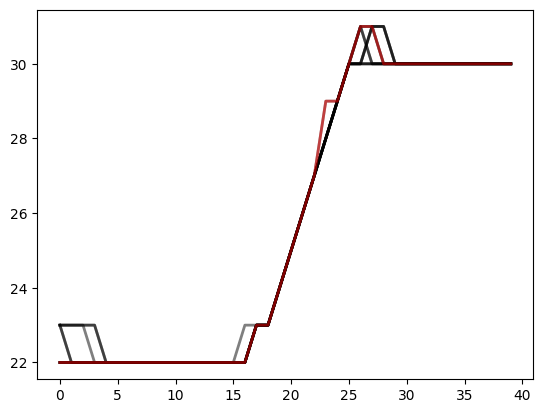

In [100]:
for result in results:
    profile_result, kp_result = get_profile(result, mesh = 10, max_idx = 30)
    profile_gt, kp_gt = get_profile(result, mesh = 10, max_idx = 30)

    plt.plot(profile_result, 'k', linewidth = 2, alpha = 0.5)
plt.plot(profile_gt, 'r', linewidth = 2, alpha = 0.5)

plt.show()

(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)
(1, 1, 40, 40)


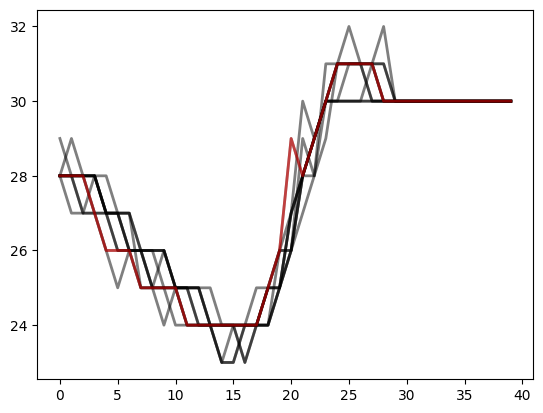

In [101]:
for result in results:
    profile_result, kp_result = get_profile(result, mesh = 10, max_idx = 30)
    profile_gt, kp_gt = get_profile(result, mesh = 10, max_idx = 30)

    plt.plot(kp_result, 'k', linewidth = 2, alpha = 0.5)
plt.plot(kp_gt, 'r', linewidth = 2, alpha = 0.5)

plt.show()

In [ ]:
plt.plot()

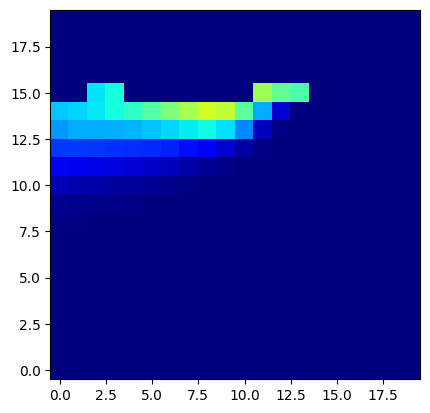

In [78]:
plt.imshow(input[0][0].T, origin = 'lower', cmap = 'jet', vmin  = 293, vmax = 5000)

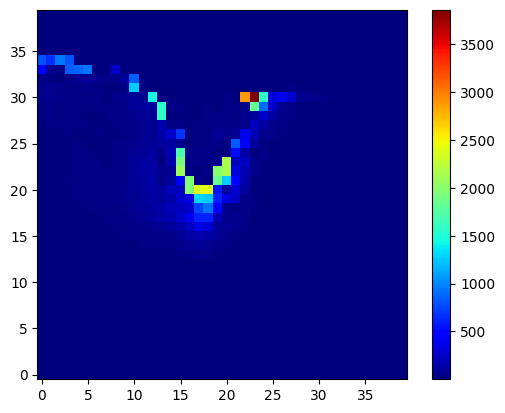

In [39]:
plt.imshow(np.std(np.array(results), axis = 0).T, origin = 'lower', cmap = 'jet')
plt.colorbar()

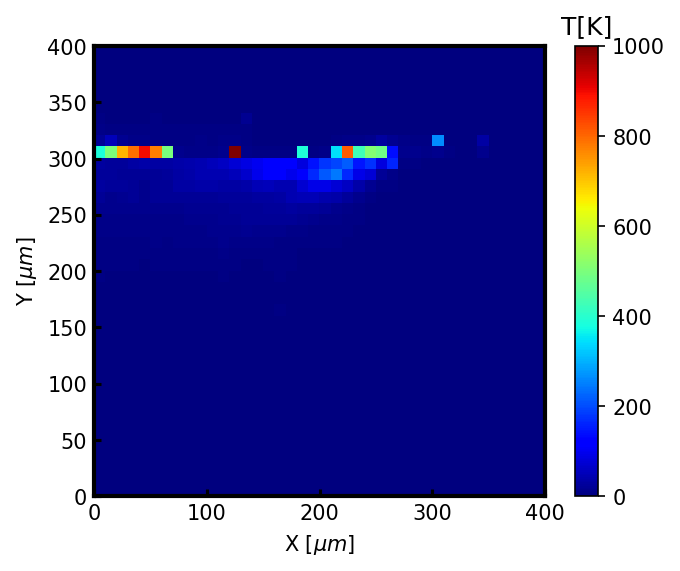

In [74]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.imshow(np.std(np.array(results), axis = 0).T, origin = 'lower', cmap = 'jet', vmin = 0, vmax = 1000, extent = [0, 400, 0, 400])
clb = plt.colorbar()
clb.ax.set_title('T[K]')
plt.xlabel(r'X [$\mu m$]')
plt.ylabel(r'Y [$\mu m$]')

frame_tick()

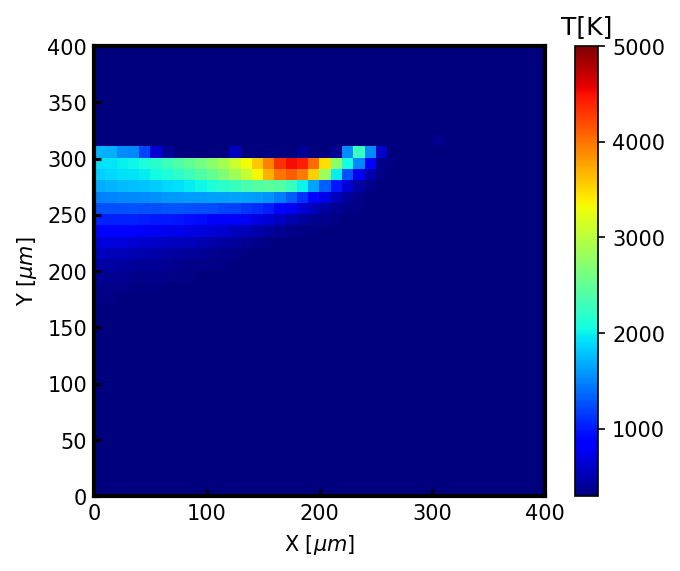

In [75]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.imshow(np.mean(np.array(results), axis = 0).T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000, extent = [0, 400, 0, 400])
clb = plt.colorbar()
clb.ax.set_title('T[K]')
plt.xlabel(r'X [$\mu m$]')
plt.ylabel(r'Y [$\mu m$]')

frame_tick()

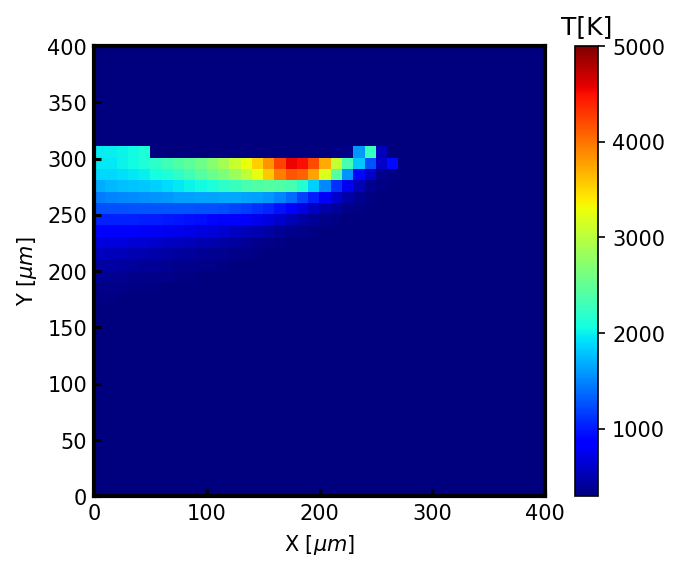

In [76]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.imshow(result_diffusion[0][0].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000, extent = [0, 400, 0, 400])
clb = plt.colorbar()
clb.ax.set_title('T[K]')
plt.xlabel(r'X [$\mu m$]')
plt.ylabel(r'Y [$\mu m$]')

frame_tick()

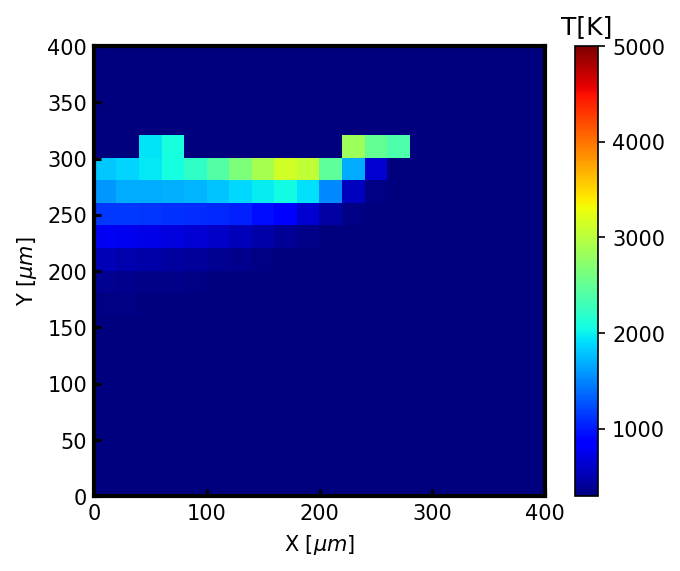

In [79]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.imshow(input[0][0].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000, extent = [0, 400, 0, 400])
clb = plt.colorbar()
clb.ax.set_title('T[K]')
plt.xlabel(r'X [$\mu m$]')
plt.ylabel(r'Y [$\mu m$]')

frame_tick()

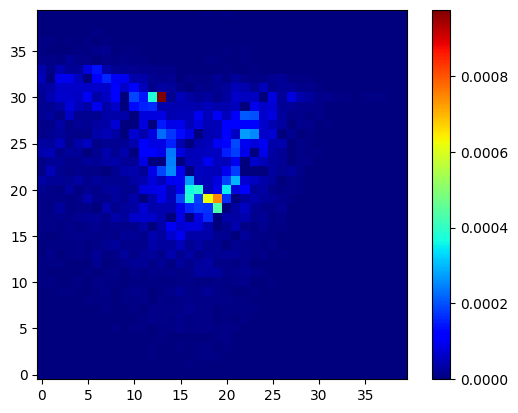

In [57]:
plt.imshow(np.std(np.array(results), axis = 0).T, origin = 'lower', cmap = 'jet')
plt.colorbar()

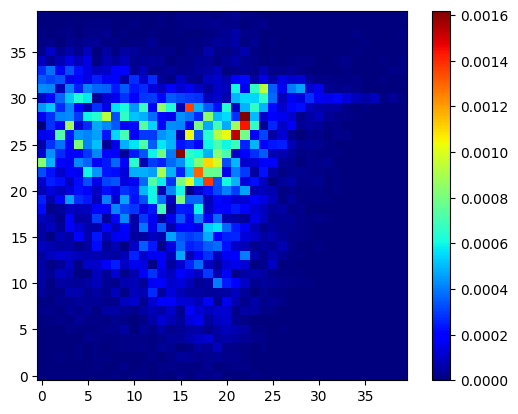

In [50]:
plt.imshow(np.std(np.array(results), axis = 0).T, origin = 'lower', cmap = 'jet')
plt.colorbar()

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def multifield_plot_images(input, result, target, modeltype, field_idx, field_key, split = 'train', timesteps = 200, title = '', timestep = None):
    
    result  = result
    scaling_factor = 1.5
    dpi = 90
    min_temp = 293
    max_temp = 5000
    method = 'Direct'

    # if timestep is None:
    #     plt.title('[{} Data] Low Resolution, {}'.format(split, method), fontsize = 10)
    # else:
    #     plt.title(r'[{} Data] Low Resolution, {}, $i$ = {}'.format(split, method, timestep), fontsize = 10)
        
    axis_lim_min= {'vx': -30, 'vy':-30, 'vz':-30, 'temperature':293, 'pressure': 900000, 'liqlabel':0}
    axis_lim_max= {'vx': 30, 'vy':30, 'vz':30, 'temperature':5000, 'pressure': 4*1000000, 'liqlabel':1}
    titles= {'vx': r"$v_x$ [cm/s]", 'vy':r"$v_y$ [cm/s]", 'vz':r"$v_z$ [cm/s]", 'temperature':"T [K]", 'pressure': "P [Pa]", 'liqlabel':"Liquid Volume Fraction"}

    # os.makedirs('lrenc_saved_figures', exist_ok = True)
    # plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)
    # plt.imshow(input[field_idx].T, cmap = 'jet',vmin = axis_lim_min[field_key], vmax = axis_lim_max[field_key], origin = 'lower',  extent=[0*5,80*5,0*5,80*5])

    # plt.xlabel(r'x $[\mu m]$')
    # plt.ylabel(r'z $[\mu m]$')
    # clb = plt.colorbar()
    # clb.ax.set_title(r'T$[K]$',fontsize=10)


    plt.figure(dpi = dpi)
    ax = plt.gca()
    plt.xlabel(r'x $[\mu m]$')
    plt.ylabel(r'z $[\mu m]$')
    im = ax.imshow(input[field_idx][:,input.shape[-1]//4:3*input.shape[-1]//4].T, cmap = 'jet',vmin = axis_lim_min[field_key], vmax = axis_lim_max[field_key], origin = 'lower',  extent=[0*5,80*5,0*5,40*5])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    clb=plt.colorbar(im, cax=cax)
    clb.ax.set_title(r'T$[K]$',fontsize=10)

    
    frame_tick()

    # plt.title('t = {} s, P = {} W, V = {} mm/s'.format(0.5*i/100, power, velocity))

    plt.savefig( title + 'input.png')

    # plt.show()
    plt.clf()
    # plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)

    # plt.imshow((target[field_idx]).T, cmap = 'jet', vmin = axis_lim_min[field_key], vmax = axis_lim_max[field_key], origin = 'lower',  extent=[0*5,80*5,0*5,80*5])

    # plt.xlabel(r'x $[\mu m]$')
    # plt.ylabel(r'z $[\mu m]$')
    # # clb = plt.colorbar()
    # clb = plt.colorbar()
    # clb.ax.set_title(titles[field_key])


    plt.figure(dpi = dpi)
    ax = plt.gca()
    plt.xlabel(r'x $[\mu m]$')
    plt.ylabel(r'z $[\mu m]$')
    im = ax.imshow(target[field_idx][:,target.shape[-1]//4:3*target.shape[-1]//4].T, cmap = 'jet',vmin = axis_lim_min[field_key], vmax = axis_lim_max[field_key], origin = 'lower',  extent=[0*5,80*5,0*5,40*5])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    clb=plt.colorbar(im, cax=cax)
    clb.ax.set_title(r'T$[K]$',fontsize=10)
    # clb.ax.set_title(r'T$[K]$',fontsize=10)
    frame_tick()
    # plt.title('[{} Data] High Resolution'.format(split), fontsize = 10)
    # plt.title(r'[{} Data] High Resolution, {}, $i$ = {}'.format(split, method, timestep), fontsize = 10)
    # plt.savefig()
    # plt.savefig('lrenc_saved_figures/target' + title + '.png')
    plt.savefig( title + 'target.png')


    # plt.show()
    plt.clf()

    # plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)

    # plt.imshow((result[field_idx]).T, cmap = 'jet', vmin = axis_lim_min[field_key], vmax = axis_lim_max[field_key], origin = 'lower',  extent=[0*5,80*5,0*5,80*5])

    # plt.xlabel(r'x $[\mu m]$')
    # plt.ylabel(r'z $[\mu m]$')
    # clb = plt.colorbar()
    # clb.ax.set_title(titles[field_key])
    plt.figure(dpi = dpi)
    ax = plt.gca()
    plt.xlabel(r'x $[\mu m]$')
    plt.ylabel(r'z $[\mu m]$')
    im = ax.imshow(result[field_idx][:,result.shape[-1]//4:3*result.shape[-1]//4].T, cmap = 'jet',vmin = axis_lim_min[field_key], vmax = axis_lim_max[field_key], origin = 'lower',  extent=[0*5,80*5,0*5,40*5])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    clb=plt.colorbar(im, cax=cax)
    clb.ax.set_title(r'T$[K]$',fontsize=10)
    frame_tick()
    # plt.title('[{} Data], {} Timesteps, {} Output'.format(split,str(timesteps), modeltype), fontsize = 10)
    # plt.title(r'[{} Data], {} Timesteps, {} Output, $i$ = {}'.format(split,str(timesteps), modeltype, str(timestep)), fontsize = 10)
    # plt.savefig()
    # plt.savefig('lrenc_saved_figures/result'+ title + '.png')
    plt.savefig( title + 'result.png')


    # plt.show()
    plt.clf()
    plt.close('all')

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_images(input, result, target, modeltype, split = 'train', timesteps = 200, title = '', timestep = None, save =False):
    
    result  = result
    scaling_factor = 1.5
    dpi = 150
    min_temp = 293
    max_temp = 5000
    method = 'Direct'
    # os.makedirs('lrenc_saved_figures', exist_ok = True)
    # plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)
    # plt.imshow(input.T, cmap = 'jet', vmin = min_temp, vmax=max_temp, origin = 'lower',  extent=[0*5,80*5,0*5,80*5])

    # clb = plt.colorbar()

    plt.figure(dpi = dpi)
    ax = plt.gca()
    if timestep is None:
        plt.title('[{} Data] Low Resolution, {}'.format(split, method), fontsize = 10)
    else:
        plt.title(r'[{} Data] Low Resolution, {}, $i$ = {}'.format(split, method, timestep), fontsize = 10)
    plt.xlabel(r'x $[\mu m]$')
    plt.ylabel(r'z $[\mu m]$')

    im = ax.imshow(input[:,input.shape[-1]//2:].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000,  extent=[0*5,80*5,0*5,40*5])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    clb=plt.colorbar(im, cax=cax)
    clb.ax.set_title(r'T$[K]$',fontsize=10)
    frame_tick()
    if save:
        plt.savefig( title + 'input.png')
    else:
        plt.show()
    # plt.show()
    plt.clf()
    # plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)

    # plt.imshow((target).T, cmap = 'jet', vmin = min_temp, vmax=max_temp, origin = 'lower',  extent=[0*5,80*5,0*5,80*5])

    # plt.xlabel(r'x $[\mu m]$')
    # plt.ylabel(r'z $[\mu m]$')
    # clb = plt.colorbar()
    # clb.ax.set_title(r'T$[K]$',fontsize=10)
    # frame_tick()
    # # plt.title('[{} Data] High Resolution'.format(split), fontsize = 10)
    # plt.title(r'[{} Data] High Resolution, {}, $i$ = {}'.format(split, method, timestep), fontsize = 10)
    # plt.savefig()
    # plt.savefig('lrenc_saved_figures/target' + title + '.png')


    plt.figure(dpi = dpi)
    ax = plt.gca()
    if timestep is None:
        plt.title('[{} Data] High Resolution'.format(split), fontsize = 10)
    else:
        plt.title(r'[{} Data] High Resolution, {}, $i$ = {}'.format(split, method, timestep), fontsize = 10)
    plt.xlabel(r'x $[\mu m]$')
    plt.ylabel(r'z $[\mu m]$')

    im = ax.imshow(target[:,target.shape[-1]//2:].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000,  extent=[0*5,80*5,0*5,40*5])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    clb=plt.colorbar(im, cax=cax)
    clb.ax.set_title(r'T$[K]$',fontsize=10)
    frame_tick()



    if save:
        plt.savefig( title + 'target.png')
    else:
        plt.show()

    # plt.show()
    plt.clf()

    # plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)

    # plt.imshow((result).T, cmap = 'jet', vmin = min_temp, vmax=max_temp, origin = 'lower',  extent=[0*5,80*5,0*5,80*5])

    # plt.xlabel(r'x $[\mu m]$')
    # plt.ylabel(r'z $[\mu m]$')
    # clb = plt.colorbar()
    # clb.ax.set_title(r'T$[K]$',fontsize=10)
    # frame_tick()
    # # plt.title('[{} Data], {} Timesteps, {} Output'.format(split,str(timesteps), modeltype), fontsize = 10)
    # plt.title(r'[{} Data], {} Timesteps, {} Output, $i$ = {}'.format(split,str(timesteps), modeltype, str(timestep)), fontsize = 8)


    plt.figure(dpi = dpi)
    ax = plt.gca()
    if timestep is None:
        plt.title('[{} Data], {} Timesteps, {} Output'.format(split,str(timesteps), modeltype), fontsize = 10)
    else:
        plt.title(r'[{} Data], {} Timesteps, {} Output, $i$ = {}'.format(split,str(timesteps), modeltype, str(timestep)), fontsize = 8)
    plt.xlabel(r'x $[\mu m]$')
    plt.ylabel(r'z $[\mu m]$')

    im = ax.imshow(result[:,result.shape[-1]//2:].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000,  extent=[0*5,80*5,0*5,40*5])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    clb=plt.colorbar(im, cax=cax)
    clb.ax.set_title(r'T$[K]$',fontsize=10)
    frame_tick()
    # plt.savefig()
    # plt.savefig('lrenc_saved_figures/result'+ title + '.png')
    if save:
        plt.savefig( title + 'result.png')
    else:
        plt.show()

    # plt.show()
    plt.clf()
    plt.close('all')

### Plot test set melt pools

In [13]:
# model = load_diffusion(simlinear2000.folder)
# mobilenet = load_mobilenet(mobilenet_results_dir)
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
last_power = ''
skip = 50
import time 
field_names = field_names#['vx', 'temperature', 'vy', 'vz', 'liqlabel']
verbose = False
for batch_idx, (res, hr, lr, upscaled_lr, info_full) in tqdm(enumerate(test_dataloader), total = len(test_dataloader), ):  
      
        for timesteps in [1000]:
        # timesteps = 2000
            for skips in [50]:
                oldtime = time.time()
                modeltype = 'RRDNss316l_standardize_test_temp_3_21'
                # print(hr.shape, lr.shape, upscaled_lr.shape, res.shape)
                info = info_full[0]
                input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
                # print(time.time()-oldtime)
                if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
                    timestep = 0
                else:
                    # print('timestep updated')
                    timestep += 1
                
                for field_idx, field_key in enumerate(field_names):
                    time_elapsed = time.time()-oldtime
                    print(time_elapsed)
                    # print(info.shape, "info")
                    # print('power' + str(info[0].item()))# + 'vel' + str(info[1].item()))
                    folder = modeltype + 'saved_figures/{}/'.format(field_key)  + 'power' + str(info[0].item()) + 'vel' + str(info[1].item())
                    
                    os.makedirs(folder,exist_ok = True)

                    title  = os.path.join(folder,  'batch_{:06}_'.format(batch_idx)+ 'time' + '{:07}'.format(int(np.round(info[2].item()*1e6))))
                    if verbose:
                        print(title, timestep)
                        print(input.shape, result.shape, target.shape)
                        print(time_elapsed, "elapsed time")
                    multifield_plot_images(input[0,:,:, :], result[0], target[0][:, :], field_idx = field_idx, field_key = field_key, timestep = timestep, split = 'Validation', modeltype =modeltype, timesteps = timesteps//skips, title =  title)
                    last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item()) 
                modeltype = 'Diffusionss316l_3_21' 
                # input, result_diffusion, target, xs, b = predict_ddim_diffusion(model, lr_enc, res[0:1], hr[0:1], lr[0:1], upscaled_lr[0:1],train_dataset,seq= None, timesteps = timesteps,skip = skips, schedule = 'linear')
                input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,encoding = True,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
                for field_idx, field_key in enumerate(field_names):
                    info = info_full[0]
                    time_elapsed = time.time()-oldtime
                    print(time_elapsed)
                    # print(info.shape, "info")
                    # print('power' + str(info[0].item()))# + 'vel' + str(info[1].item()))
                    # if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
                    #     timestep = 0
                    # else:
                    #     timestep += 1
                    
                    folder = modeltype +'saved_figures/{}/'.format(field_key)  + 'power' + str(info[0].item()) + 'vel' + str(info[1].item()) 

                    os.makedirs(folder,exist_ok = True)
                    title  = os.path.join(folder,  'batch_{:06}_'.format(batch_idx)+ 'time' + '{:07}'.format(int(np.round(info[2].item()*1e6))))
                    if verbose:
                        print(title, timestep)
                        print(input.shape, result.shape, target.shape)
                        print(time_elapsed, "elapsed time")
            # break
                    multifield_plot_images(input[0,:,:, :], result_diffusion[0], target[0][:, :], field_idx = field_idx, field_key = field_key, timestep = timestep, split = 'Validation', modeltype =modeltype, timesteps = timesteps//skips, title =  title)
                last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  


  0%|          | 0/4094 [00:00<?, ?it/s]

0.08431577682495117


  0%|          | 0/4094 [00:00<?, ?it/s]


NameError: name 'predict_modified_ddim_diffusion' is not defined

In [24]:
def plot_srdiff_contours(input, result, target, modeltype, split = 'train', max_temp = 5000, min_temp = 293, dpi = 90, scaling_factor = 1.5, method = 'Direct', save = False, mpfname = '', kpfname = ''):
    profile_result, kp_result = get_profile(result, mesh = 10, max_idx = 30)

    profile_gt, kp_gt = get_profile(target, mesh = 10, max_idx = 30)
    profile_input, kp_input = get_profile(input, mesh = 10, max_idx = 15)

    plt.figure(dpi = 150, figsize = np.array([4,3])*1.25)
    plt.plot(20*np.arange(20),100 +  kp_input*20 - 400, '--', label = 'Bicubic Interpolation')
    plt.plot(10*np.arange(40), 100 + kp_result*10 - 400, label = 'Diffusion Output' )
    plt.plot(10*np.arange(40), 100 + kp_gt*10 - 400, 'k', linewidth = 2.0, label = 'High Resolution')
    frame_tick()

    legend()
    plt.ylim([-200, 0])
    plt.title('[{} Data] Keyhole Depth, {}'.format(split, modeltype), fontsize = 10)
    plt.xlabel(r'x [$\mu m$] ')
    plt.ylabel(r'z [$\mu m$] ')
    if save:
        # print('Saving')
        plt.savefig(kpfname, bbox_inches = 'tight')
    else:
        plt.show()

    plt.figure(dpi = 150, figsize = np.array([4,3])*1.25)
    plt.plot(20*np.arange(20),100 + profile_input*20 - 400, '--', label = 'Bicubic Interpolation')
    plt.plot(10*np.arange(40), 100 + profile_result*10 - 400, label = 'Diffusion Output' )
    plt.plot(10*np.arange(40),100 + profile_gt*10 - 400, 'k', linewidth = 2.0, label = 'High Resolution')
    plt.ylim([-200, 0])

    frame_tick()

    legend()
    plt.ylim([-200, 0])
    plt.title('[{} Data] Melt Pool Depth, {}'.format(split, modeltype), fontsize = 10)
    plt.xlabel(r'x [$\mu m$] ')
    plt.ylabel(r'z [$\mu m$] ')
    if save:
        
        plt.savefig(mpfname, bbox_inches = 'tight')
    else:
        plt.show()
    plt.close('all')
    # plt.show()

In [17]:
import skimage
def get_profile(image, mesh = 5, max_idx = None):
    image = image[0].T
    binarized = image > 1900
    profile = []
    keyholeprofile = []
    labeled_img = skimage.measure.label(binarized)
    region_props = skimage.measure.regionprops(labeled_img)
    
    for i in range(binarized.shape[1]):
        coords = np.where(binarized[:,i])[0]
        if len(coords) > 0:
            profile.append(np.min(coords))
            keyholeprofile.append(np.max(coords))
        else:
            if max_idx == None:

                profile.append(binarized.shape[1])
                keyholeprofile.append(binarized.shape[1])
            else:
                profile.append(max_idx)
                # keyholeprofile.append(binarized.shape[1])
                keyholeprofile.append(max_idx)
    profile = np.array(profile)
    keyholeprofile = np.array(keyholeprofile)
    return(profile, keyholeprofile)

  0%|          | 0/4094 [00:00<?, ?it/s]

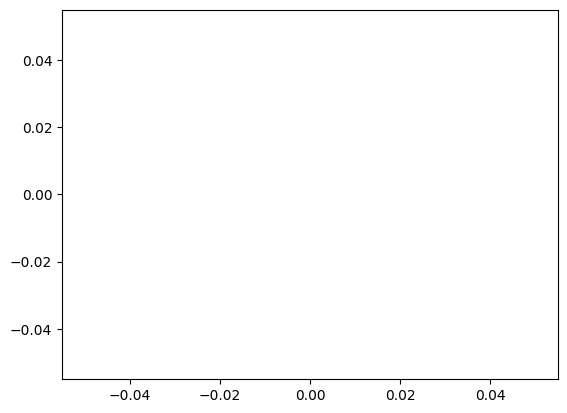

  2%|▏         | 100/4094 [00:24<15:41,  4.24it/s]

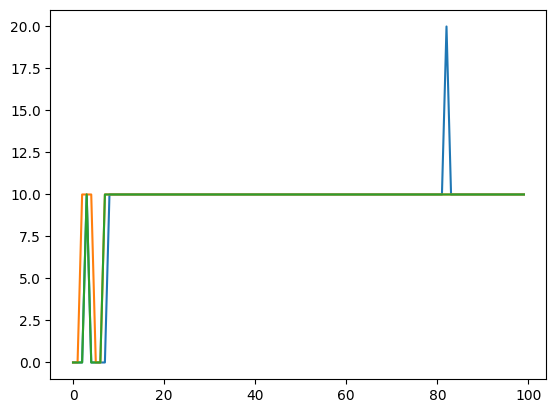

  5%|▍         | 200/4094 [00:48<14:51,  4.37it/s]

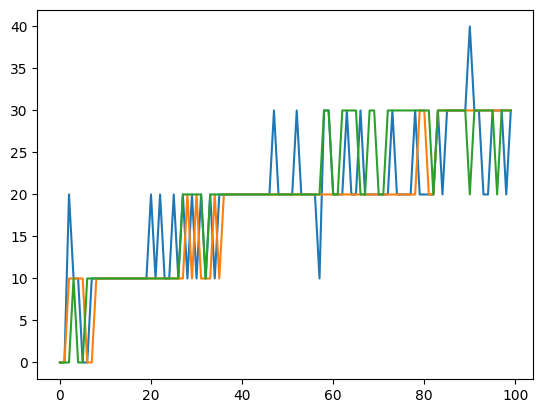

  7%|▋         | 300/4094 [01:11<14:36,  4.33it/s]

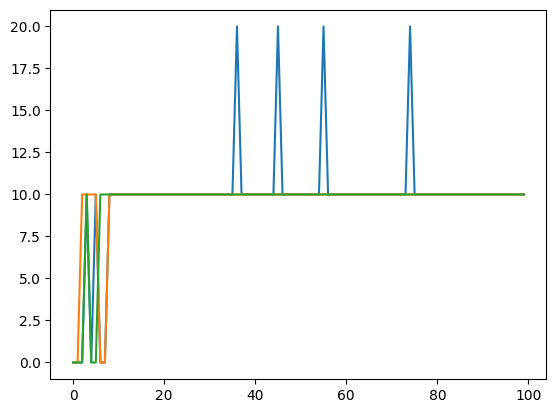

 10%|▉         | 400/4094 [01:35<14:33,  4.23it/s]

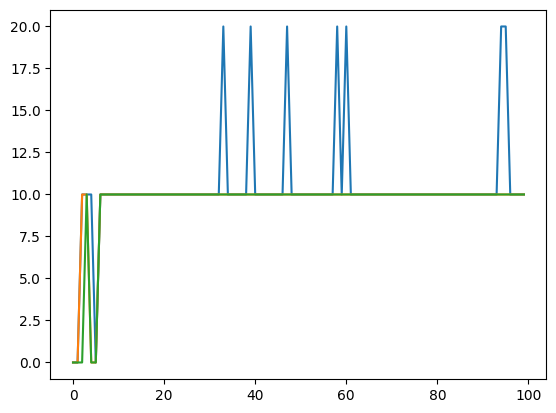

 12%|█▏        | 500/4094 [02:00<13:52,  4.32it/s]

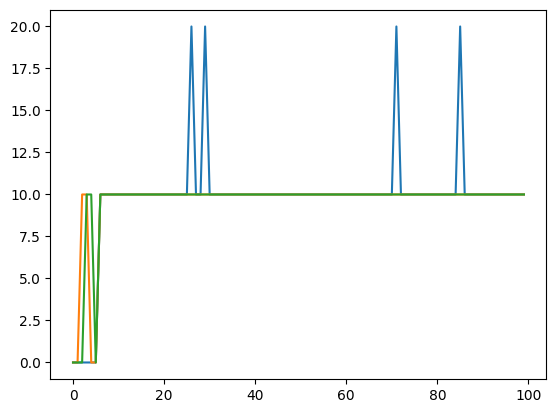

 15%|█▍        | 600/4094 [02:23<13:36,  4.28it/s]

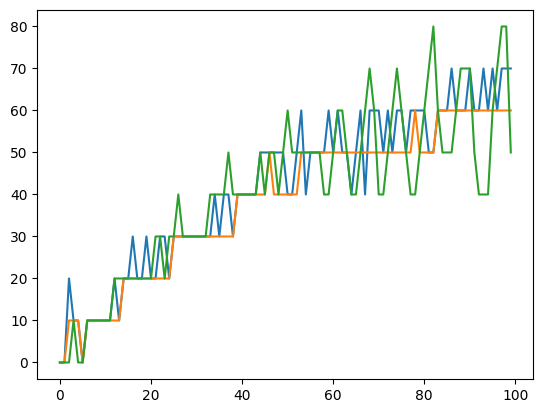

 17%|█▋        | 700/4094 [02:47<13:09,  4.30it/s]

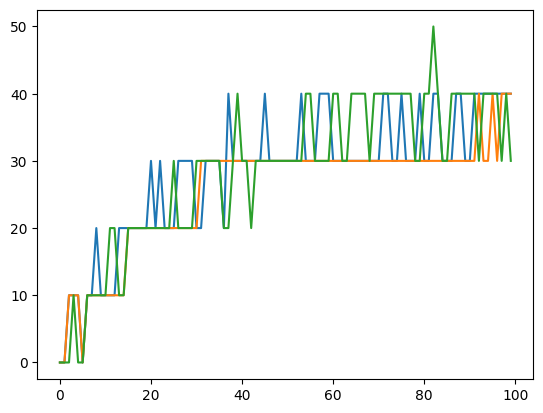

 20%|█▉        | 800/4094 [03:11<12:57,  4.24it/s]

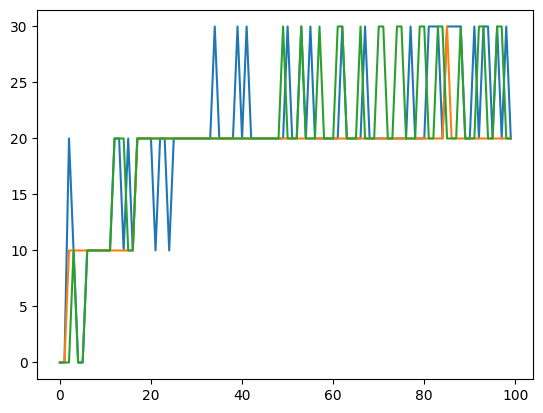

 22%|██▏       | 901/4094 [03:35<12:29,  4.26it/s]

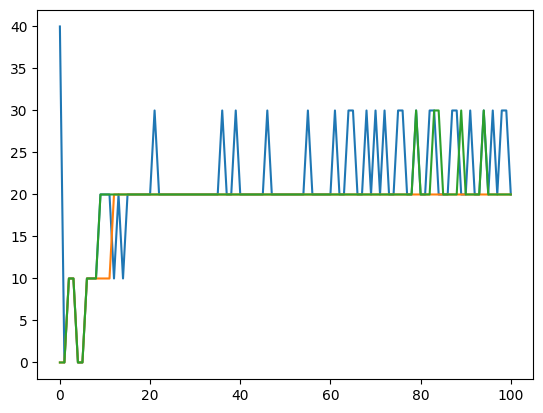

 24%|██▍       | 1002/4094 [03:59<12:12,  4.22it/s]

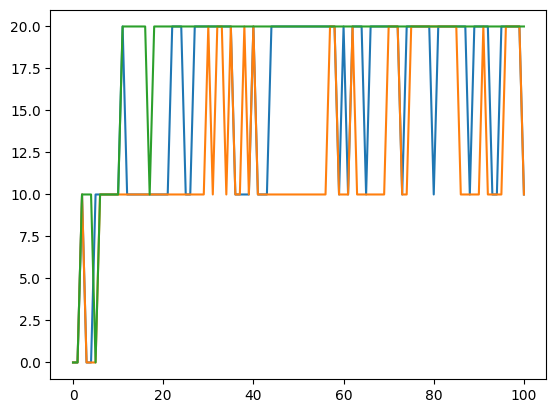

 27%|██▋       | 1103/4094 [04:23<11:43,  4.25it/s]

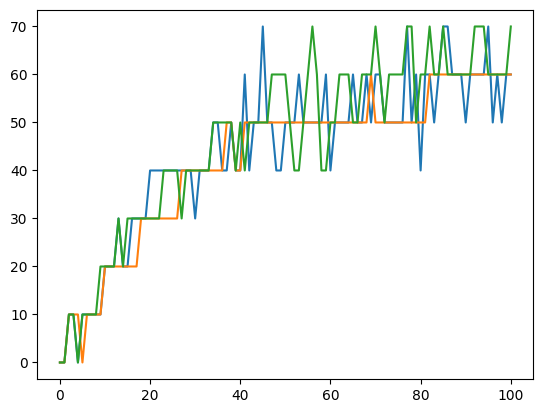

 29%|██▉       | 1204/4094 [04:47<11:11,  4.31it/s]

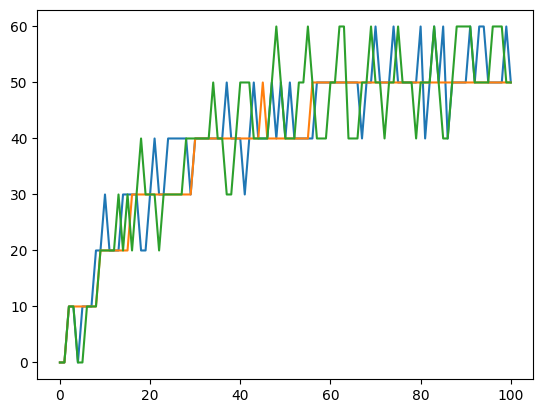

 32%|███▏      | 1305/4094 [05:10<10:41,  4.35it/s]

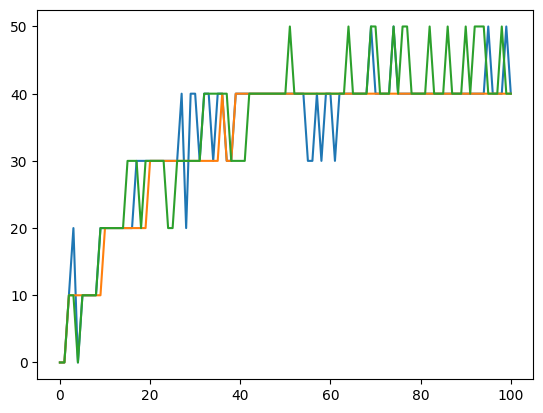

 34%|███▍      | 1406/4094 [05:34<10:19,  4.34it/s]

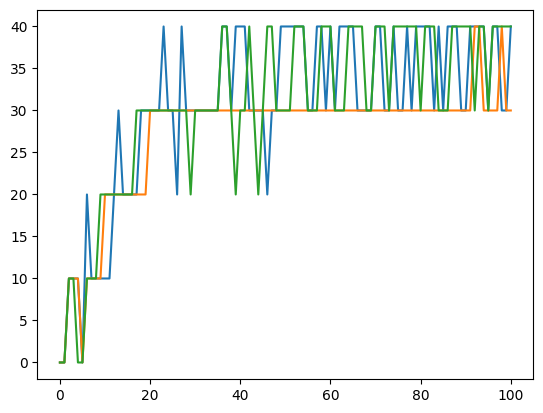

 37%|███▋      | 1507/4094 [05:57<10:01,  4.30it/s]

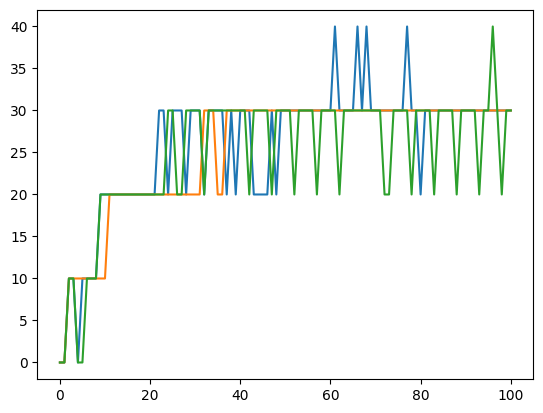

 39%|███▉      | 1608/4094 [06:21<09:44,  4.26it/s]

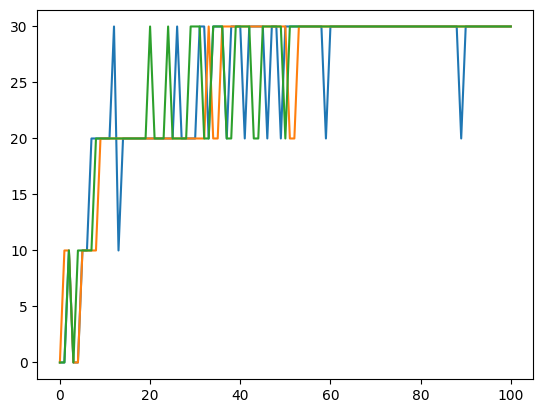

 42%|████▏     | 1709/4094 [06:46<09:21,  4.25it/s]

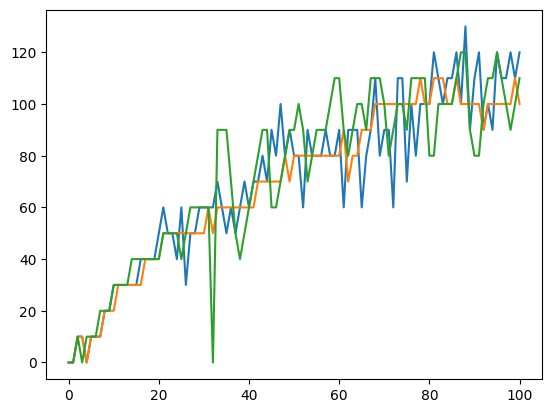

 44%|████▍     | 1810/4094 [07:10<11:12,  3.40it/s]

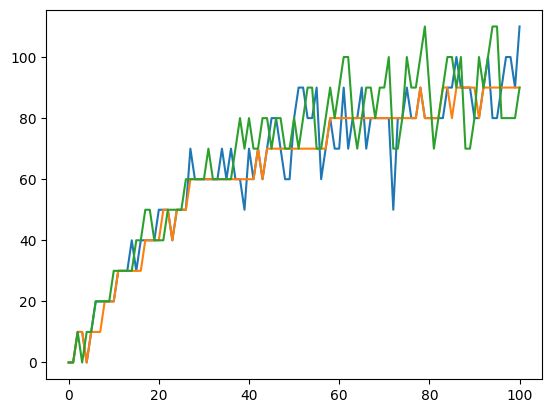

 47%|████▋     | 1911/4094 [07:34<08:26,  4.31it/s]

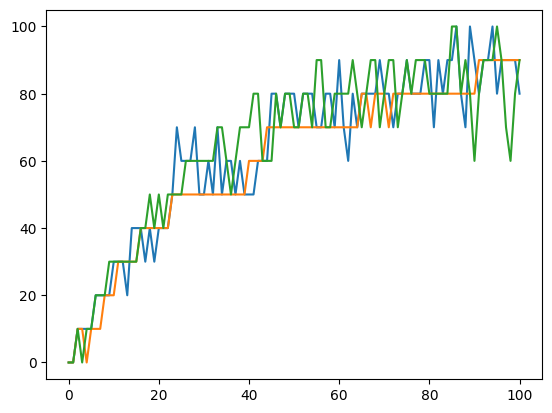

 49%|████▉     | 2012/4094 [07:57<08:03,  4.31it/s]

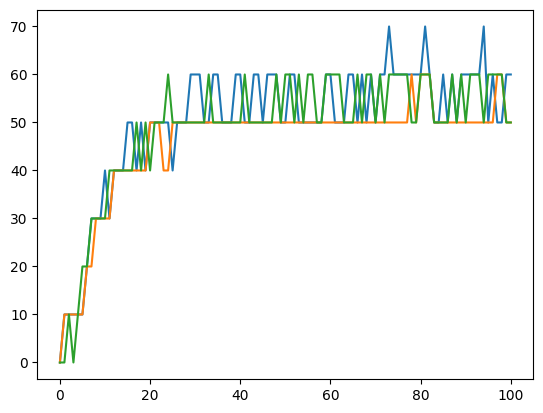

 52%|█████▏    | 2113/4094 [08:22<07:45,  4.26it/s]

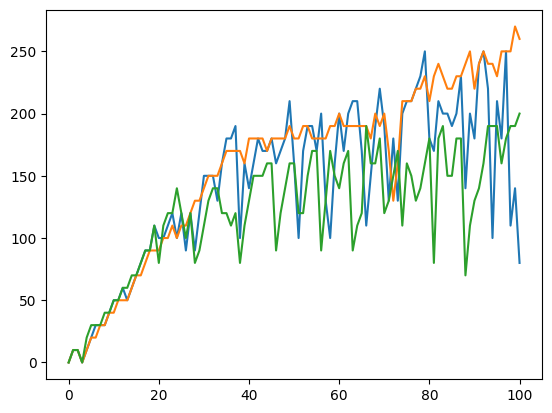

 54%|█████▍    | 2214/4094 [08:47<07:16,  4.31it/s]

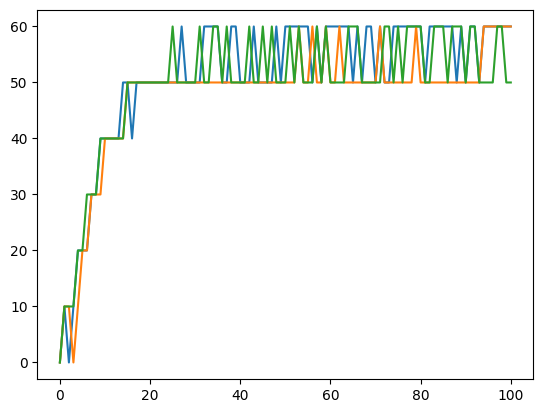

 57%|█████▋    | 2315/4094 [09:11<06:43,  4.41it/s]

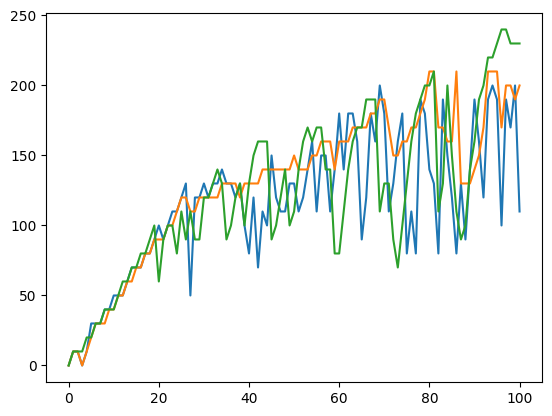

 59%|█████▉    | 2416/4094 [09:35<06:30,  4.30it/s]

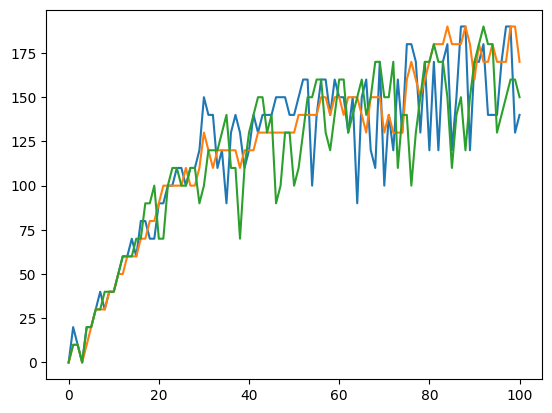

 61%|██████▏   | 2517/4094 [10:00<06:26,  4.08it/s]

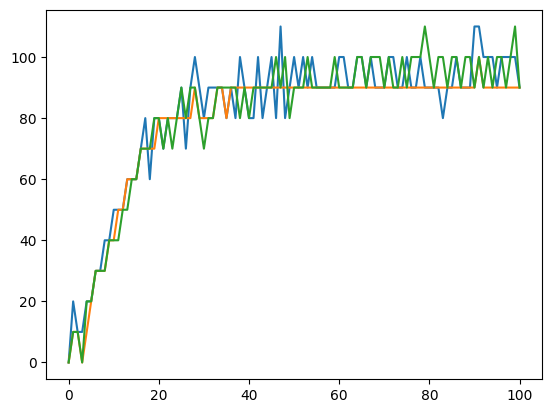

 64%|██████▍   | 2618/4094 [10:23<05:42,  4.31it/s]

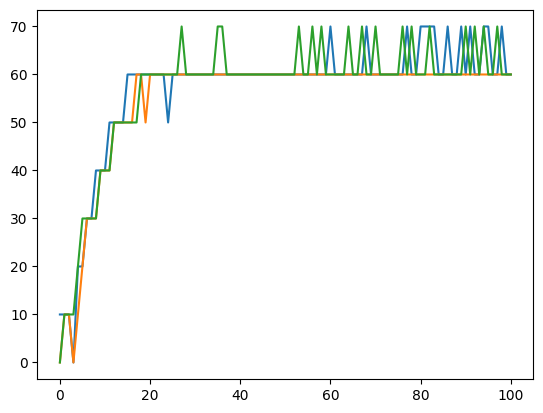

 64%|██████▍   | 2635/4094 [10:27<05:39,  4.30it/s]

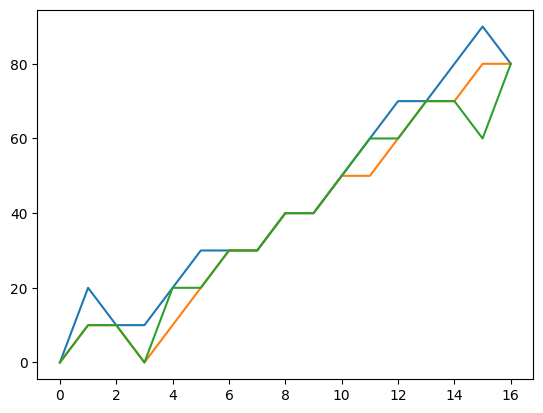

 67%|██████▋   | 2736/4094 [10:51<05:14,  4.31it/s]

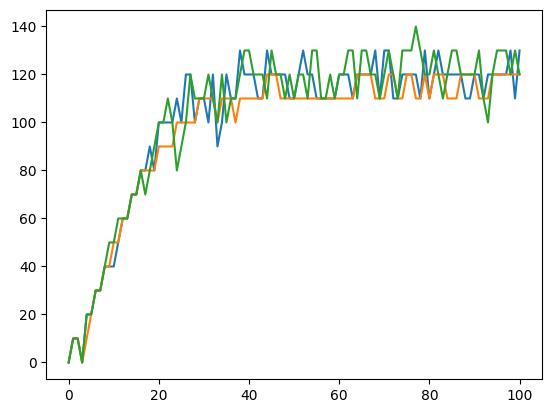

 69%|██████▉   | 2837/4094 [11:15<04:51,  4.32it/s]

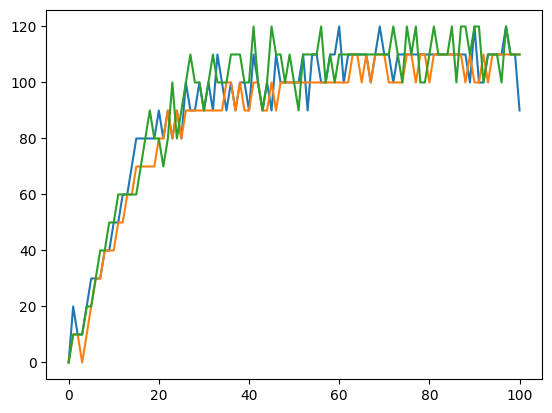

 72%|███████▏  | 2938/4094 [11:39<04:24,  4.37it/s]

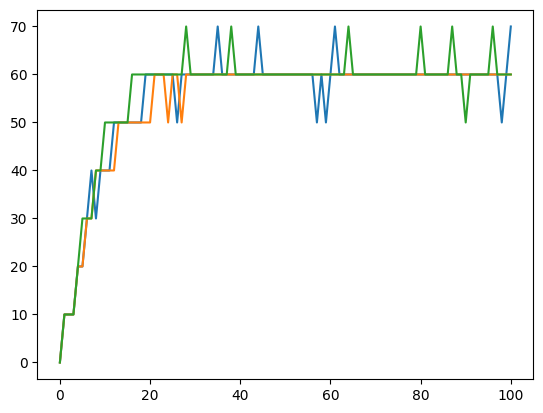

 74%|███████▍  | 3039/4094 [12:02<04:03,  4.32it/s]

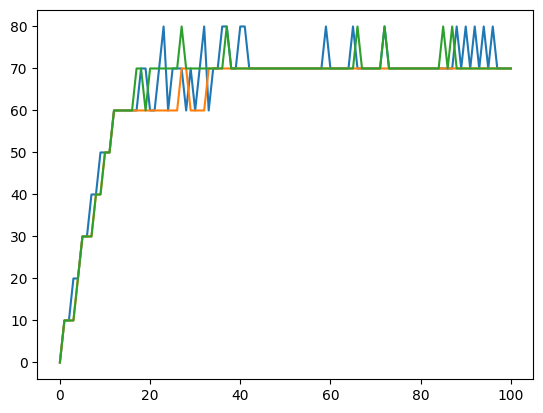

 77%|███████▋  | 3140/4094 [12:27<03:39,  4.35it/s]

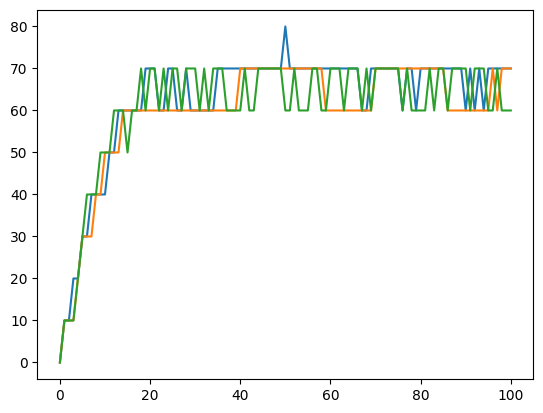

 79%|███████▉  | 3241/4094 [12:52<03:16,  4.34it/s]

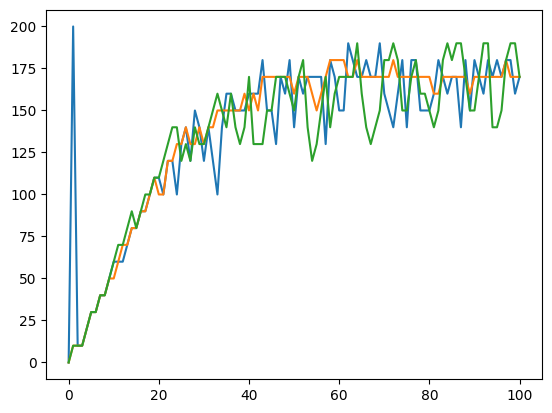

 82%|████████▏ | 3342/4094 [13:16<02:56,  4.27it/s]

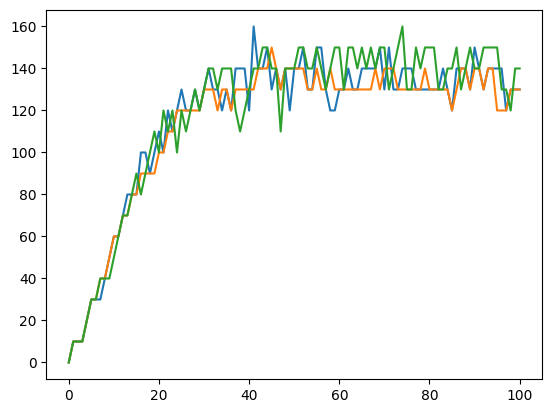

 84%|████████▍ | 3443/4094 [13:41<02:31,  4.29it/s]

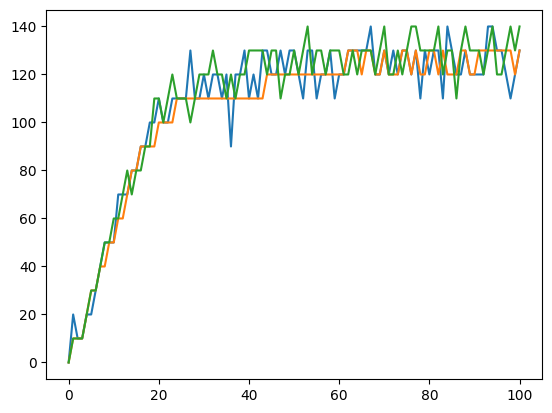

 84%|████████▍ | 3456/4094 [13:45<03:31,  3.01it/s]

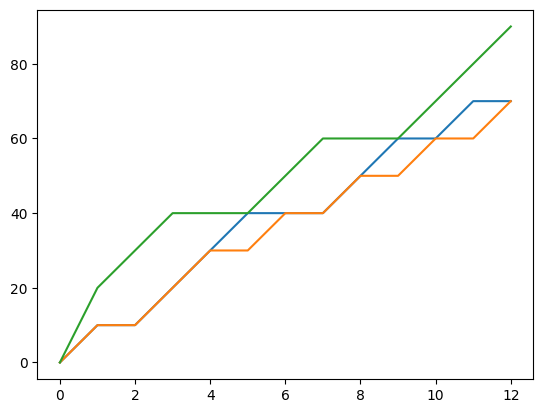

 85%|████████▍ | 3471/4094 [13:48<02:23,  4.34it/s]

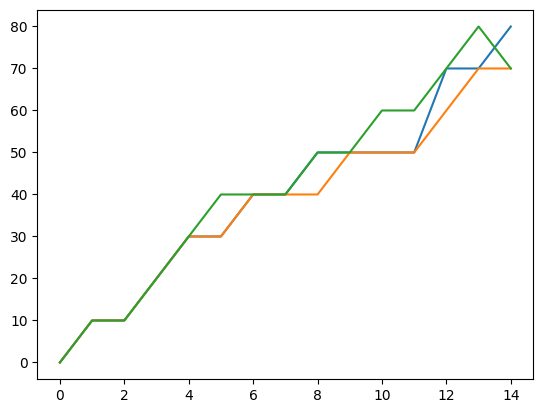

 85%|████████▌ | 3488/4094 [13:52<02:19,  4.34it/s]

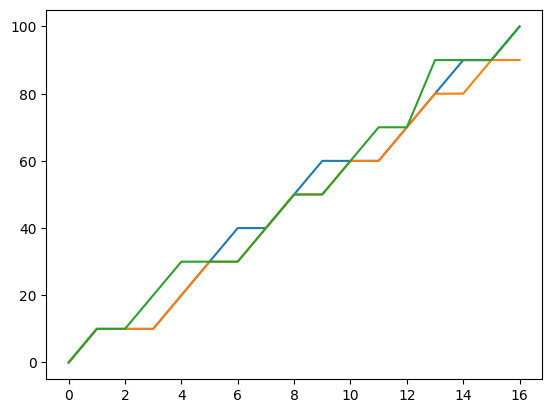

 88%|████████▊ | 3589/4094 [14:17<01:59,  4.23it/s]

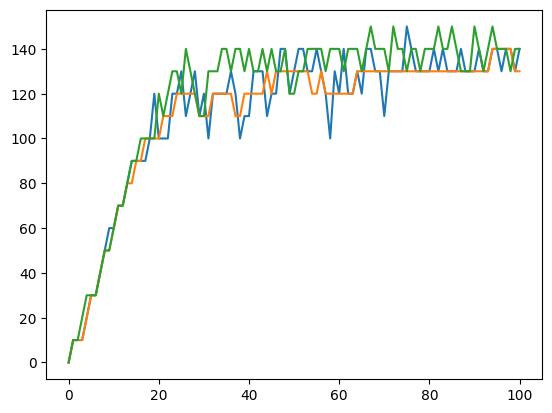

 90%|█████████ | 3690/4094 [14:42<01:35,  4.24it/s]

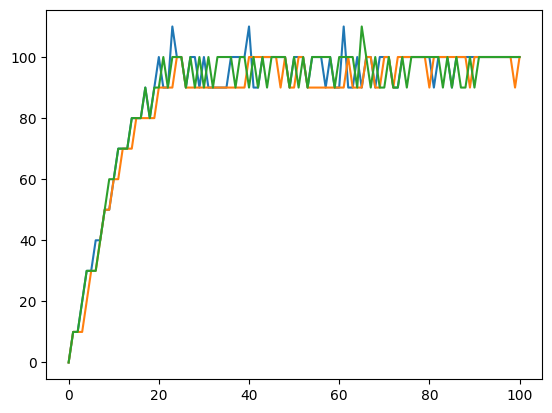

 93%|█████████▎| 3791/4094 [15:08<01:35,  3.19it/s]

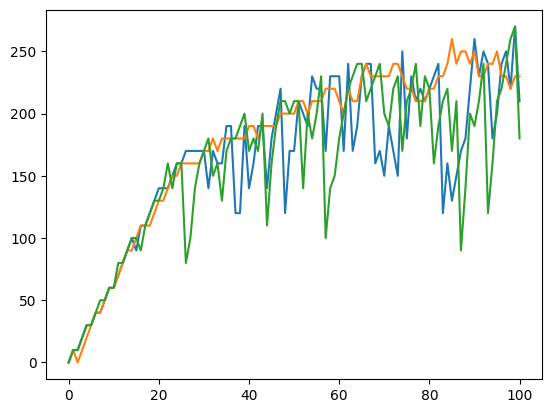

 95%|█████████▌| 3892/4094 [15:32<00:48,  4.20it/s]

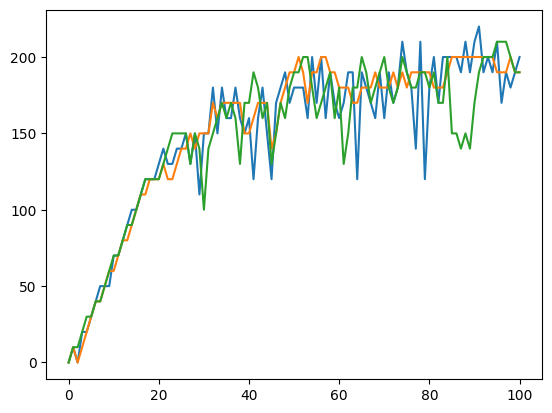

 98%|█████████▊| 3993/4094 [15:56<00:23,  4.32it/s]

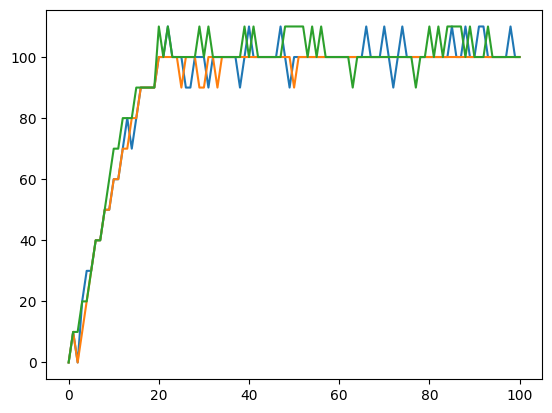

100%|██████████| 4094/4094 [16:21<00:00,  4.17it/s]


In [18]:
last_power = ''
modeltype = 'Encoder' # Defines part of the title of the image
enc_depths_sim = []
diff_depths_sim = []
gt_depths_sim = []

enc_kp_sim = []
diff_kp_sim = []
gt_kp_sim = []
gt_results = {}
enc_results = {}
diff_results = {}
mesh_hr = 10
factor = 2
skip = 50
timesteps  =1000
for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(test_dataloader), total = len(test_dataloader)):  
   

    oldtime = time.time()

    input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
    # print(timesteps, skip)
    input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,encoding = True,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
    # input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dev_dataloader.dataset)
    info = info[0] # info is technically returned with an extra dimension, this command removes it.
    time_elapsed = time.time()-oldtime
    # print(last_power)
    if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
        # 
        # plt.show()
        plt.plot(diff_kp_sim)
        plt.plot(enc_kp_sim)
        plt.plot(gt_kp_sim)
        plt.show()
        timestep = 0

        enc_depths_sim = []
        diff_depths_sim = []
        gt_depths_sim = []

        enc_kp_sim = []
        diff_kp_sim = []
        gt_kp_sim = []

    else:
        timestep += 1
    # print(target.shape)
    # plt.imshow(result_diffusion[0][0].T, origin = 'lower', cmap= 'jet', vmin = 293, vmax= 5000)
    # plt.show()
    profile_gt, kp_gt = get_profile(target[0], mesh = 10, max_idx = 30)
    profile_input, kp_input = get_profile(input[0], mesh = 20,max_idx = 15)
    profile_diff, kp_diff = get_profile(result_diffusion[0], mesh = 10, max_idx = 30)
    # profile_gt, kp_gt = get_profile(target[0])
    profile_enc, kp_enc = get_profile(result[0], mesh = 10, max_idx = 30)


    enc_kp_sim.append(mesh_hr*(20*factor-5*factor - np.min(kp_enc)))
    gt_kp_sim.append(mesh_hr*(20*factor-5*factor - np.min(kp_gt)))
    diff_kp_sim.append(mesh_hr*(20*factor-5*factor - np.min(kp_diff)))
    # diff_kp_sim.append(5*(80-np.min(kp_diff)))

    enc_depths_sim.append(mesh_hr*(20*factor-5*factor - np.min(profile_enc)))
    gt_depths_sim.append(mesh_hr*(20*factor-5*factor - np.min(profile_gt)))
    diff_depths_sim.append(mesh_hr*(20*factor-5*factor - np.min(profile_diff)))

    last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  
    gt_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = gt_kp_sim
    enc_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = enc_kp_sim
    diff_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = diff_kp_sim
    gt_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = gt_depths_sim
    enc_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = enc_depths_sim
    diff_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = diff_depths_sim
    
    plt.show()
    # if batch_idx > 3:

In [129]:
val_powers = []
val_vels = []
for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(dev_dataloader), total = len(dev_dataloader)):  
   

    oldtime = time.time()
    info = info[0] # info is technically returned with an extra dimension, this command removes it.
    time_elapsed = time.time()-oldtime
    # print(last_power)
    if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):

        timestep = 0

    else:
        timestep += 1
   
    last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item()) 
    val_powers.append(float(info[0].item()))
    val_vels.append(float(info[1].item()))


100%|██████████| 2750/2750 [00:03<00:00, 749.12it/s]


In [132]:
train_powers = []
train_vels = []
for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(dataloader), total = len(dataloader)):  
   

    oldtime = time.time()
    info = info[0] # info is technically returned with an extra dimension, this command removes it.
    time_elapsed = time.time()-oldtime
    # print(last_power)
    if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):

        timestep = 0

    else:
        timestep += 1
   
    last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item()) 
    train_powers.append(float(info[0].item()))
    train_vels.append(float(info[1].item()))

100%|██████████| 10617/10617 [00:22<00:00, 472.13it/s]


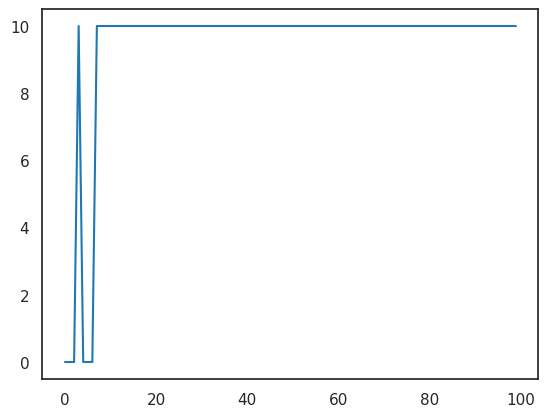

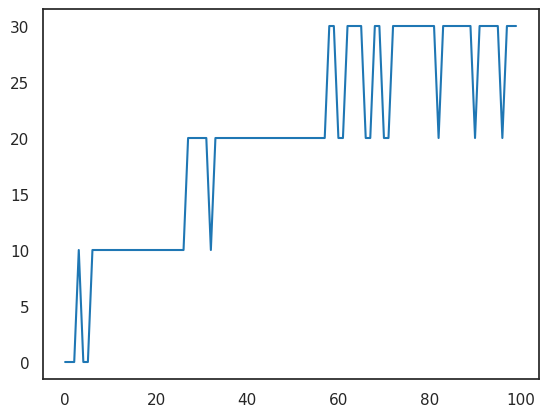

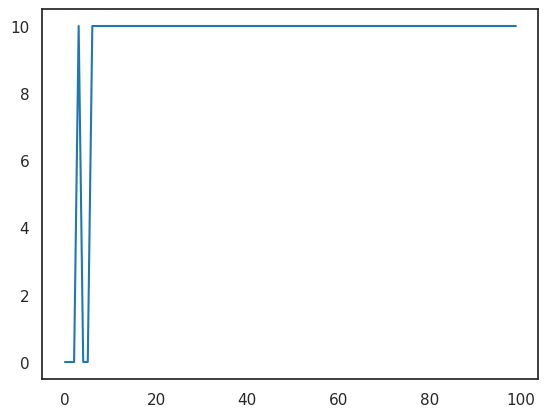

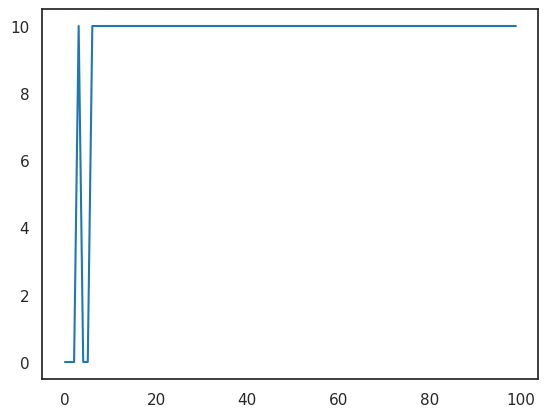

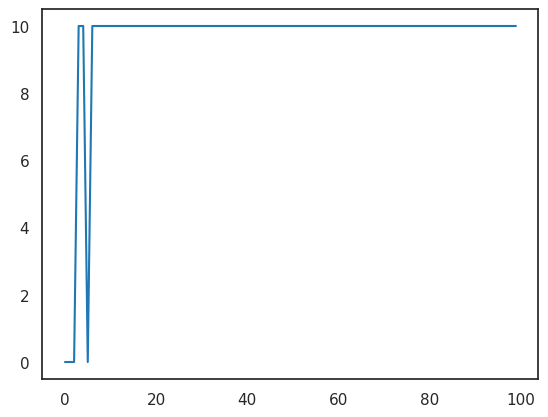

...

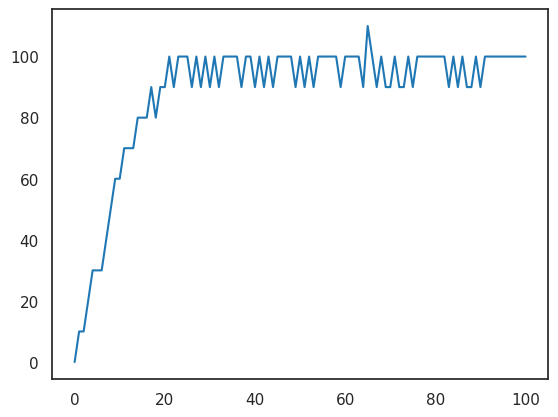

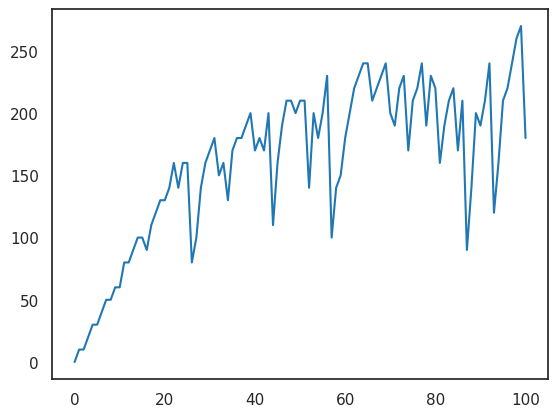

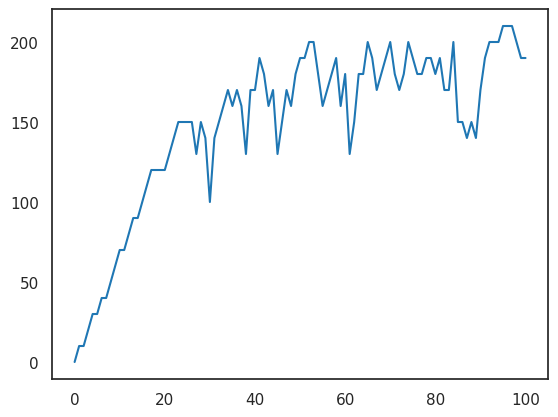

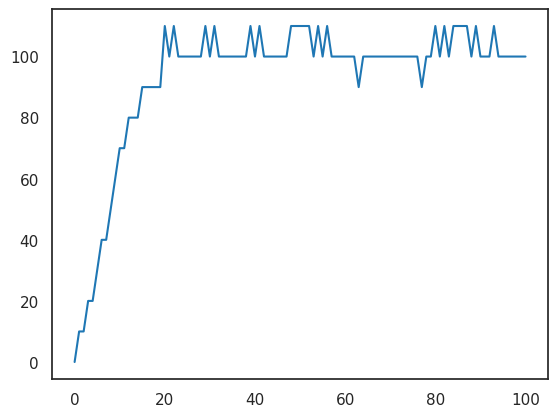

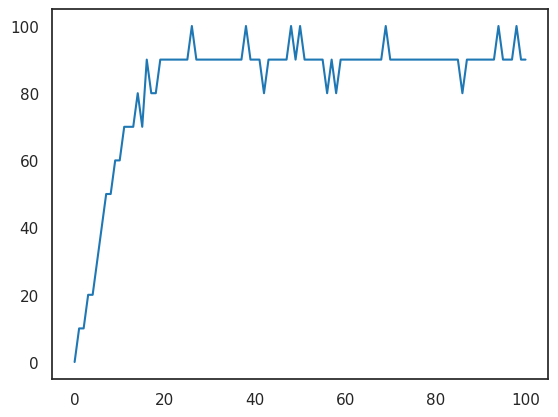

In [77]:
import matplotlib.pyplot as plt
for key in gt_results.keys():
    if 'key' in key:
        plt.plot(gt_results[key])
        plt.show()

In [34]:
# from symbol import power


keyhole_errors = []
keyhole_enc_errors = []
power_errors = []
velocity_errors = []
power_mp_errors = []
vel_mp_errors = []
mp_errors = []
for key in enc_results.keys():
    power_text = key.split('power')[1].split('vel')[0]
    vel_text = key.split('vel')[1]
    if 'key' in key:
        power_errors.append(float(power_text))
        velocity_errors.append(float(vel_text))

        keyhole_errors.append(np.mean(np.abs(np.array(diff_results[key]) - np.array(gt_results[key]))))
        # keyhole_errors.append(np.mean(np.abs(np.array(diff_results[key]) - np.array(gt_results[key]))))
    else:
        mp_errors.append(np.mean(np.abs(np.array(diff_results[key]) - np.array(gt_results[key]))))
        power_mp_errors.append(float(power_text))
        vel_mp_errors.append(float(vel_text))




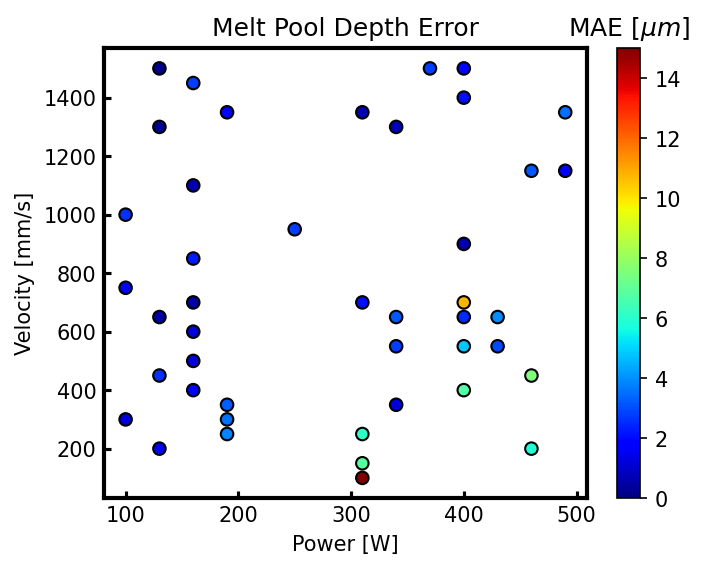

In [35]:
import importlib
import matplotlib as mpl
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
# importlib.reload(mpl); importlib.reload(plt); importlib.reload(sns)
plt.title("Melt Pool Depth Error")
plt.scatter(power_errors, velocity_errors, c= mp_errors, cmap =  'jet', vmin = 0, vmax = 15, edgecolor = 'k')
plt.xlabel('Power [W]')
plt.ylabel('Velocity [mm/s]')
frame_tick()
clb = plt.colorbar()
clb.ax.set_title('MAE [$\mu m$]')
plt.show()

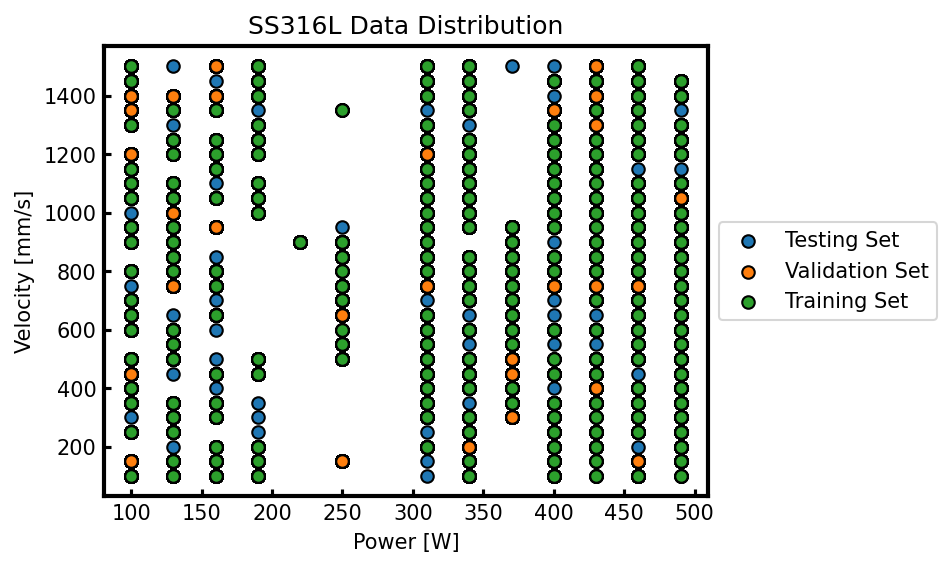

In [141]:
import importlib
import matplotlib as mpl
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
# importlib.reload(mpl); importlib.reload(plt); importlib.reload(sns)
plt.title("SS316L Data Distribution")
plt.scatter(power_errors, velocity_errors, cmap =  'jet', vmin = 0, vmax = 15, edgecolor = 'k', label = 'Testing Set')
plt.scatter(val_powers, val_vels, cmap =  'jet', vmin = 0, vmax = 15, edgecolor = 'k', label ='Validation Set')
plt.scatter(train_powers, train_vels, cmap =  'jet', vmin = 0, vmax = 15, edgecolor = 'k', label = "Training Set")
legend(location= 'best')
# plt.scatter(val_powers, val_vels, cmap =  'jet', vmin = 0, vmax = 15, edgecolor = 'k')


plt.xlabel('Power [W]')
plt.ylabel('Velocity [mm/s]')
ax = plt.gca()
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

frame_tick()
# clb = plt.colorbar()
# clb.ax.set_title('MAE [$\mu m$]')
plt.show()

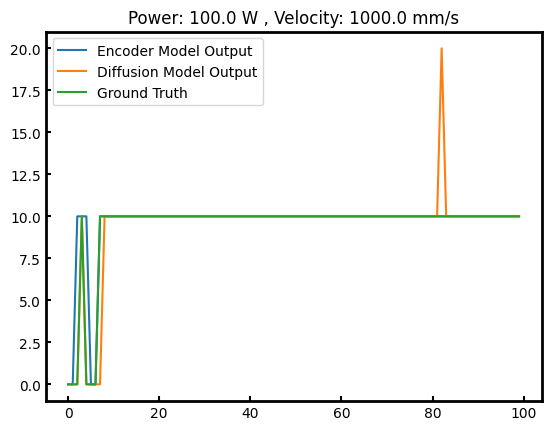

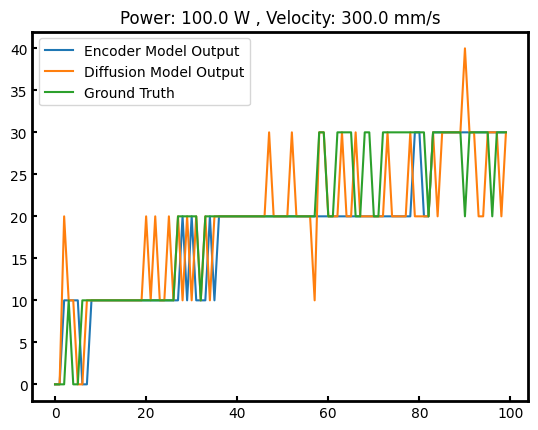

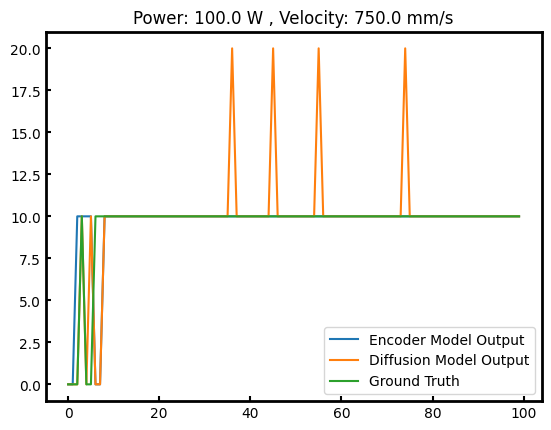

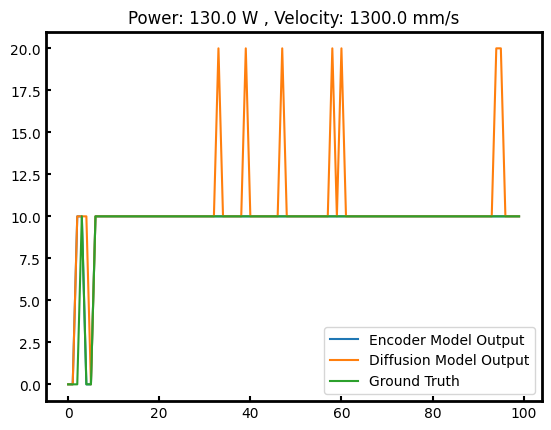

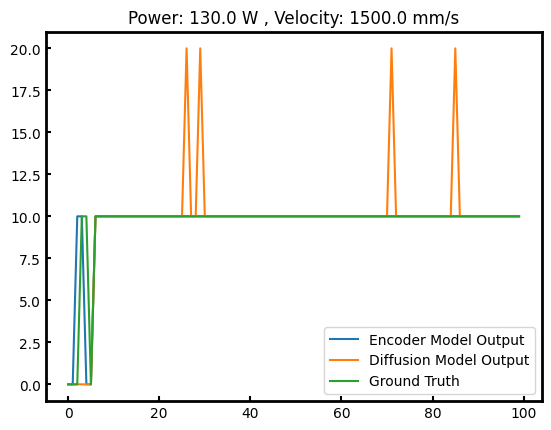

...

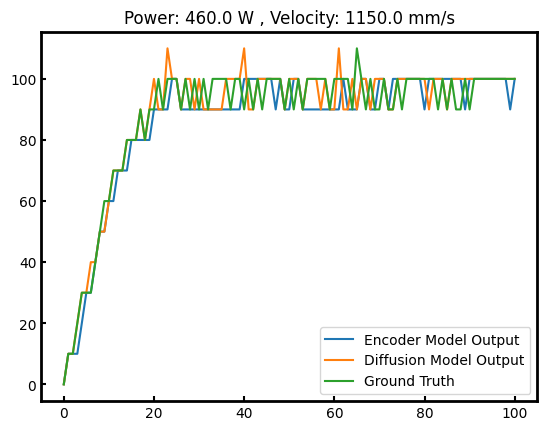

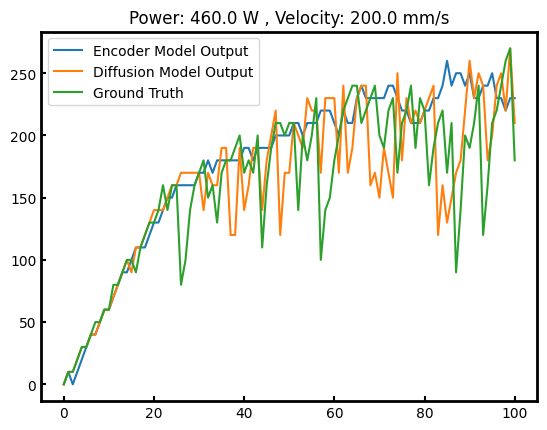

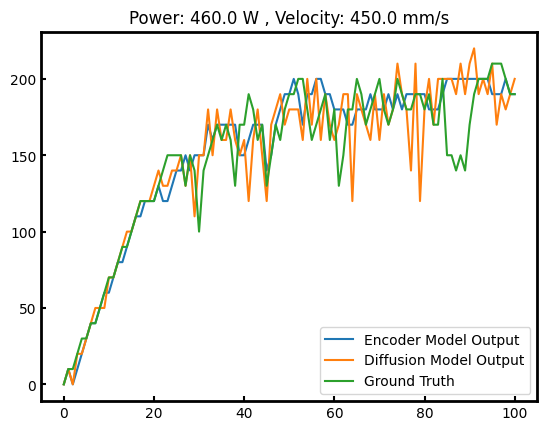

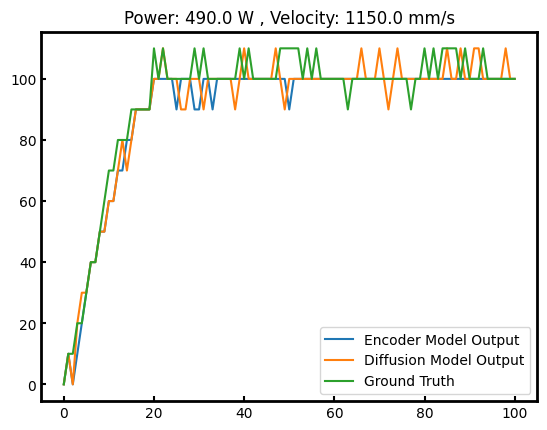

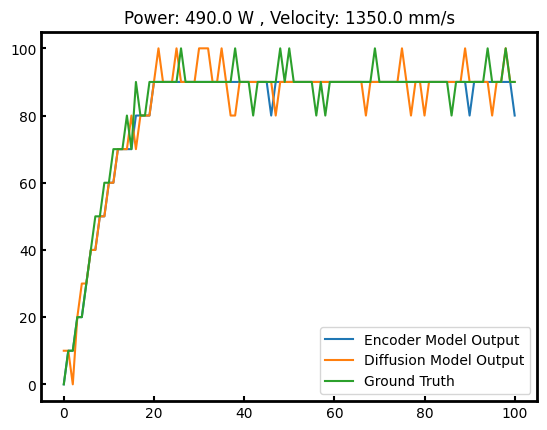

<Figure size 640x480 with 0 Axes>

In [25]:
# depth_folder = os.path.join(analysis_folder, 'depth_over_time')
from peakdetect import peakdetect
from scipy.signal import find_peaks
# os.makedirs(depth_folder, exist_ok = True)
for key in enc_results.keys():
    if 'key' in key:
        plt.plot(enc_results[key], label = 'Encoder Model Output')
        plt.plot(diff_results[key], label = 'Diffusion Model Output')
        plt.plot(gt_results[key], label = 'Ground Truth')
        power_text = key.split('power')[1].split('vel')[0]
        vel_text = key.split('vel')[1]


        
        peaks = find_peaks(gt_results[key])
        # plt.scatter(peaks[0], np.array(diff_results[key])[peaks[0]])
        # peaks = peakdetect(diff_results[key]) 
        # higherPeaks = np.array(peaks[0])
        # lowerPeaks = np.array(peaks[1])
        # plt.step(np.arange(99), diff_results[key])
        # plt.plot(higherPeaks[:,0], higherPeaks[:,1], 'ro', markersize = 4)
        # plt.plot(lowerPeaks[:,0], lowerPeaks[:,1], 'ko' , markersize = 4)


        plt.title(f'Power: {power_text} W , Velocity: {vel_text} mm/s')
        frame_tick()
        plt.legend()
        plt.show()
        # plt.savefig(os.path.join(depth_folder, f'{key}.png'))
        plt.clf()
        # plt.show()

In [26]:
def get_frequency(seq):
    peaks = peakdetect(seq, lookahead=1) 
    higherPeaks = np.array(peaks[0])
    lowerPeaks = np.array(peaks[1])
    print(higherPeaks)
    if len(higherPeaks) == 0:
        return 0, 0
    mask1 = higherPeaks[:,0] > 60 
    mask2 =  higherPeaks[:,0] < 90 
    indices = np.logical_and(mask1, mask2)
    frequency = 1/np.mean(np.diff(higherPeaks[indices][:,0])*10e-6)
    amp = np.std(10e-6*np.diff(higherPeaks[indices][:,0]))
    print(frequency, amp)
    return frequency, amp
def get_frequency_old(seq):
    peaks = find_peaks(seq)
    if len(peaks[0]) == 0:
        return 0, 0
    mask1 = peaks[0] > 60 
    mask2 =  peaks[0] < 90 
    indices = np.logical_and(mask1, mask2)
    frequency = 1/np.mean(np.diff(peaks[0][indices])*10e-6)
    amp = np.std(seq[60:90])#np.std(10e-6*np.diff(peaks[0][indices]))
    print(frequency, amp)
    return frequency, amp

In [27]:
gt_results[key]

[0,
 20,
 20,
 30,
 30,
 40,
 50,
 50,
 60,
 70,
 70,
 70,
 80,
 80,
 90,
 90,
 90,
 90,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 100,
 100,
 100,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 110,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 110,
 110,
 110,
 110,
 110,
 110]

key_power100.0vel1000.0
nan 0.0
nan 1.7950549357115015
nan 0.0


/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


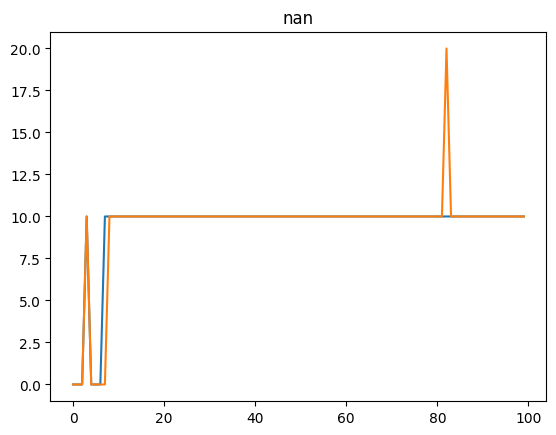

depth_power100.0vel1000.0
key_power100.0vel300.0
13043.478260869564 4.229525846816507
20000.0 4.714045207910317
nan 4.58257569495584


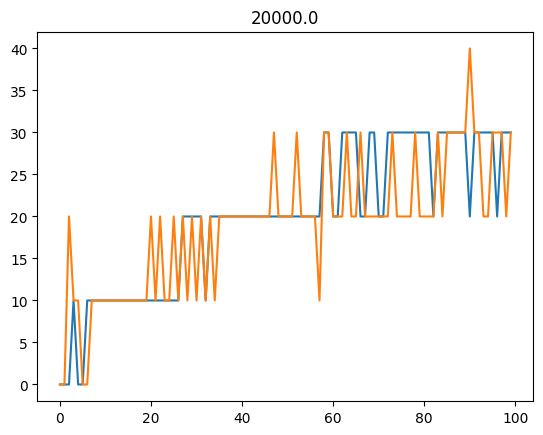

depth_power100.0vel300.0
key_power100.0vel750.0
nan 0.0
nan 1.7950549357115015
nan 0.0


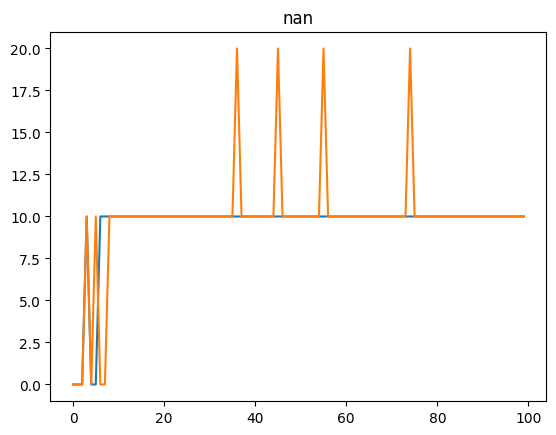

depth_power100.0vel750.0
key_power130.0vel1300.0
nan 0.0
nan 1.7950549357115015
nan 0.0


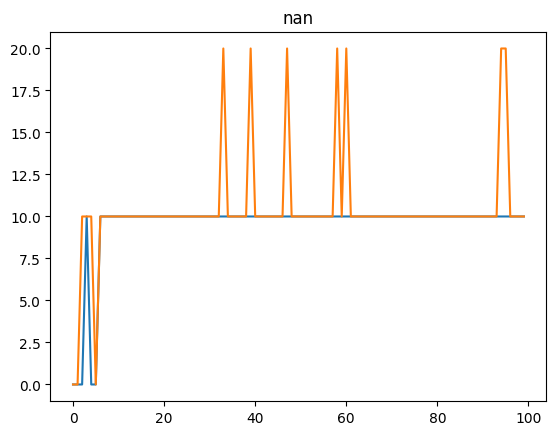

depth_power130.0vel1300.0
key_power130.0vel1500.0
nan 0.0
7142.857142857142 2.494438257849295
nan 0.0


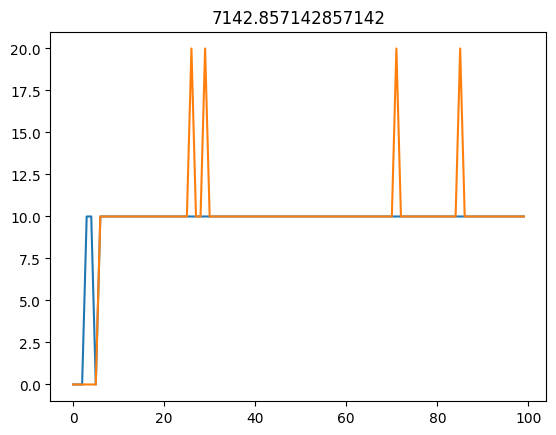

depth_power130.0vel1500.0
key_power130.0vel200.0
14285.714285714284 10.873004286866726
24000.0 6.6332495807108
nan 4.422166387140534


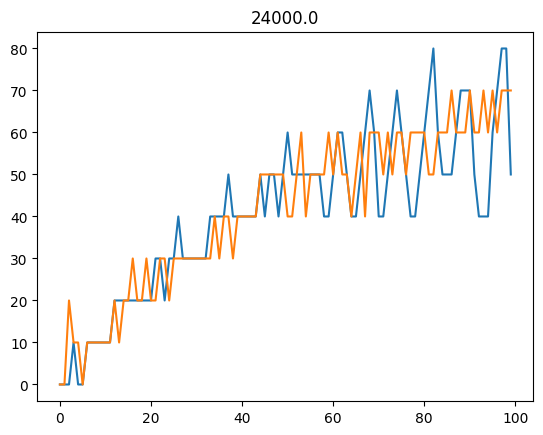

depth_power130.0vel200.0
key_power130.0vel450.0
13043.478260869564 4.760952285695233
24999.999999999996 4.422166387140533
nan 0.0


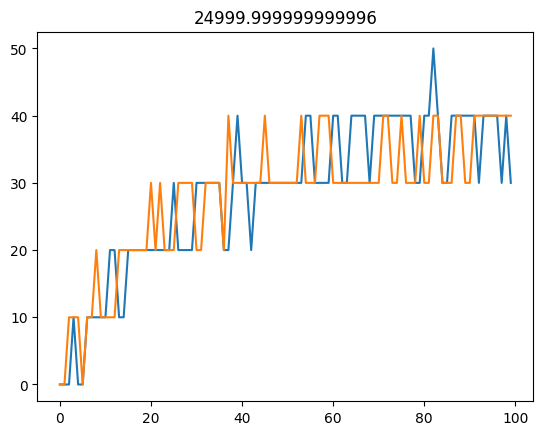

depth_power130.0vel450.0
key_power130.0vel650.0
22222.222222222223 4.898979485566356
16666.666666666668 4.714045207910317
nan 1.7950549357115015


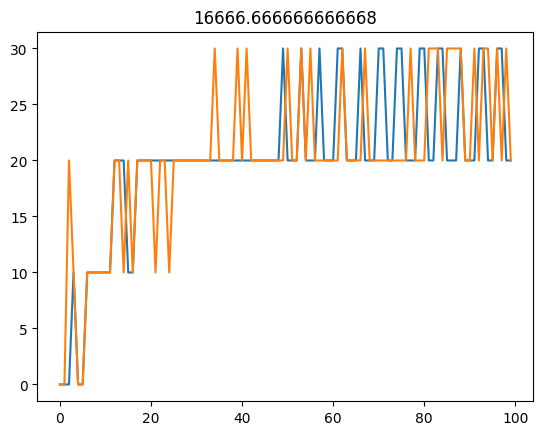

depth_power130.0vel650.0
key_power160.0vel1100.0
19999.999999999996 3.3993463423951895
30769.230769230766 4.955356249106168
nan 0.0


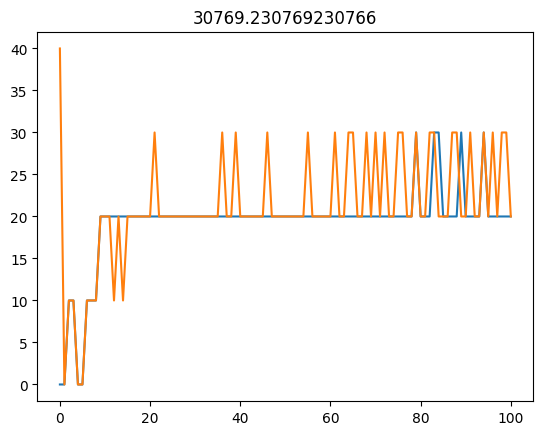

depth_power160.0vel1100.0
key_power160.0vel1450.0
nan 0.0
14285.714285714284 3.7267799624996494
11111.111111111111 5.0


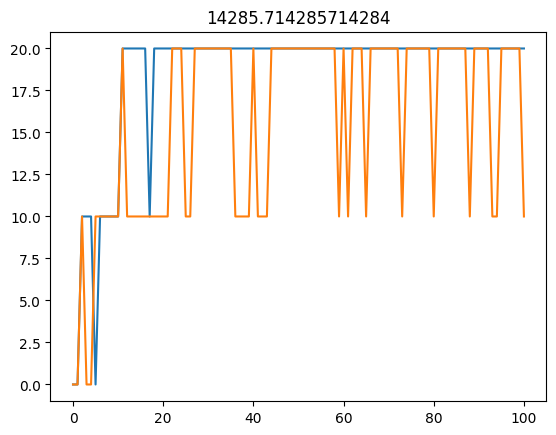

depth_power160.0vel1450.0
key_power160.0vel400.0
18181.81818181818 6.046119049072351
30000.0 7.637626158259733
nan 4.58257569495584


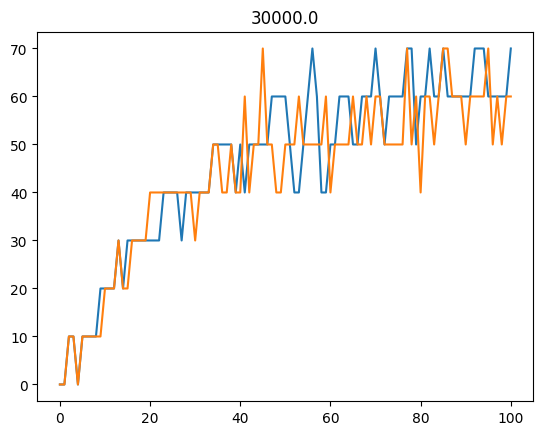

depth_power160.0vel400.0
key_power160.0vel500.0
14814.814814814814 6.831300510639732
20833.333333333332 5.120763831912406
nan 0.0


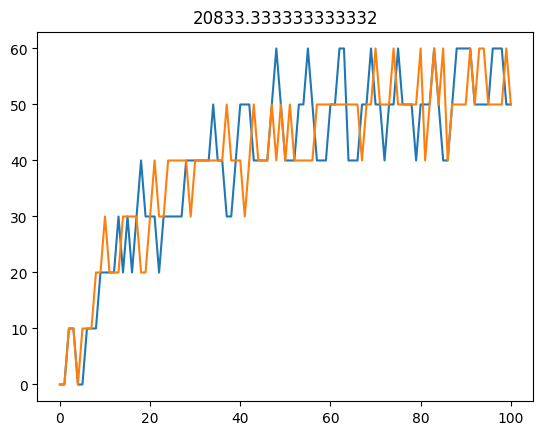

depth_power160.0vel500.0
key_power160.0vel600.0
22727.272727272728 4.422166387140533
20000.0 3.1446603773522006
nan 0.0


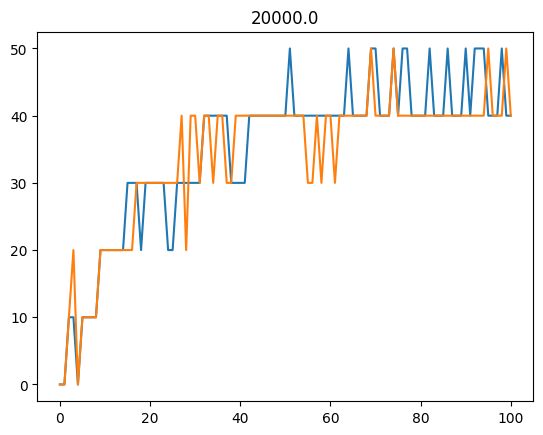

depth_power160.0vel600.0
key_power160.0vel700.0
16666.666666666664 4.714045207910317
24999.999999999996 4.955356249106169
nan 0.0


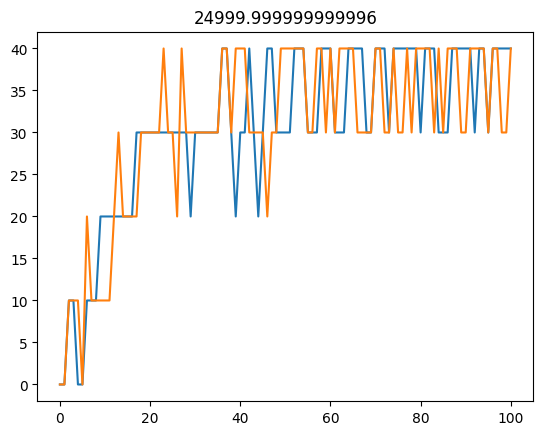

depth_power160.0vel700.0
key_power160.0vel850.0
16666.666666666668 4.0
18749.999999999996 3.958114029012639
nan 0.0


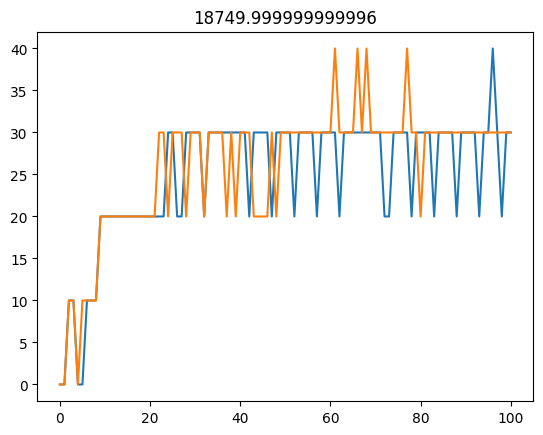

depth_power160.0vel850.0
key_power190.0vel1350.0
nan 0.0
nan 1.7950549357115013
nan 0.0


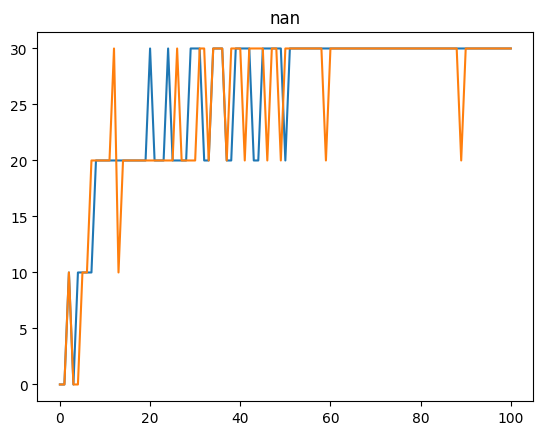

depth_power190.0vel1350.0
key_power190.0vel250.0
17391.304347826088 11.396880664852507
27999.999999999996 17.46106780494506
12000.0 9.637888196533975


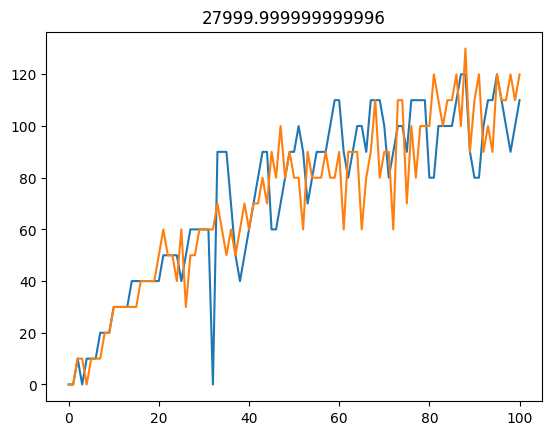

depth_power190.0vel250.0
key_power190.0vel300.0
23076.923076923074 11.455226851626389
20000.0 8.975274678557506
20000.0 4.2295258468165065


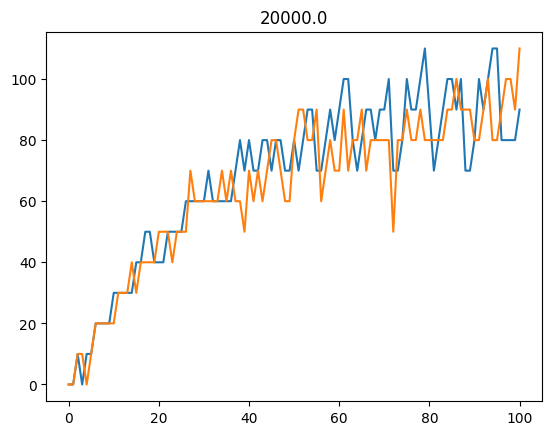

depth_power190.0vel300.0
key_power190.0vel350.0
23999.999999999993 7.5203427817856525
23076.923076923074 8.975274678557506
24999.999999999996 4.229525846816507


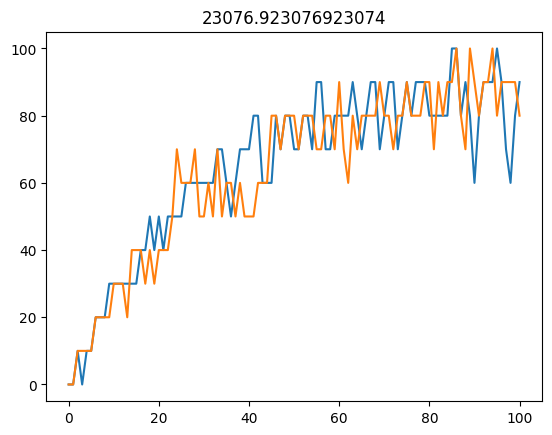

depth_power190.0vel350.0
key_power250.0vel950.0
26086.95652173913 4.955356249106169
26086.95652173913 5.734883511361751
33333.33333333333 3.3993463423951895


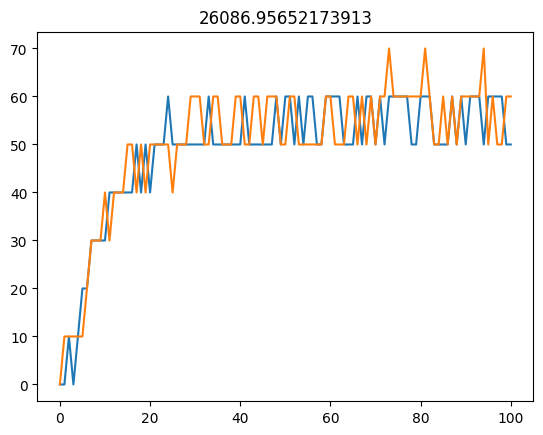

depth_power250.0vel950.0
key_power310.0vel100.0
29166.666666666668 32.112648944336904
23076.923076923074 31.83289703016886
19047.619047619046 25.649344804280847


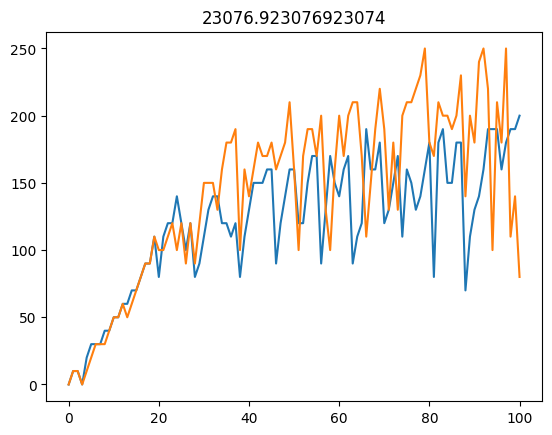

depth_power310.0vel100.0
key_power310.0vel1350.0
21739.130434782608 4.988876515698588
21428.571428571424 4.2295258468165065
11764.70588235294 3.0


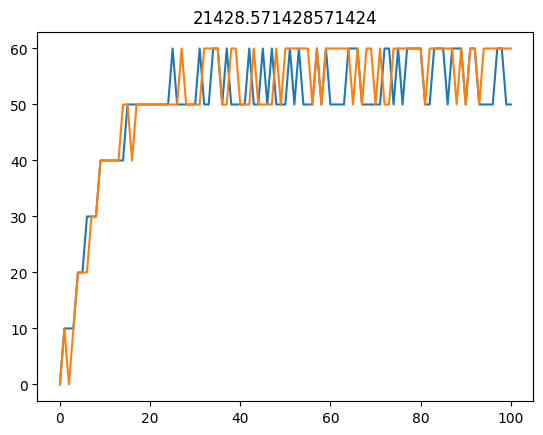

depth_power310.0vel1350.0
key_power310.0vel150.0
17647.05882352941 40.880584905578615
27999.999999999996 38.01169410706249
11764.70588235294 20.48305532764962


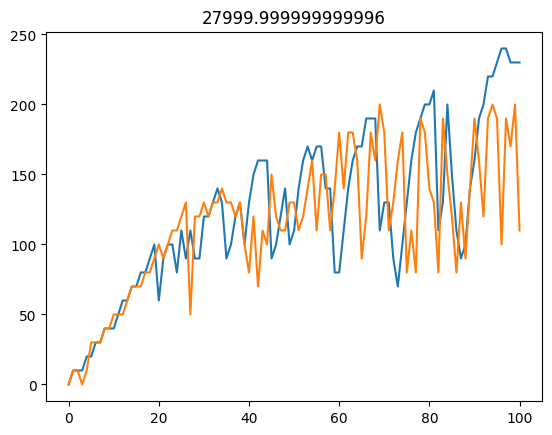

depth_power310.0vel150.0
key_power310.0vel250.0
22727.272727272724 19.84663419547226
37499.99999999999 27.139557025779837
20000.0 19.267128022157898


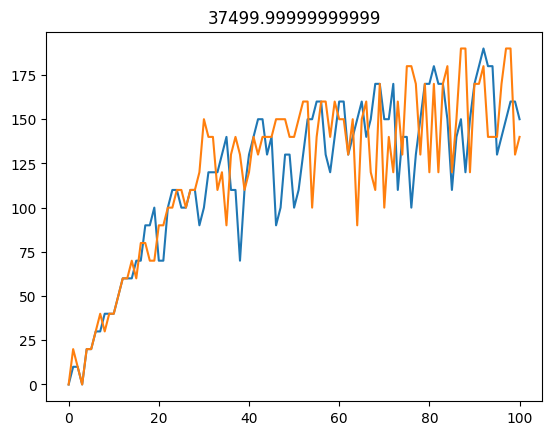

depth_power310.0vel250.0
key_power310.0vel700.0
29166.666666666668 5.467073155618908
22727.272727272724 5.259911279353167
nan 0.0


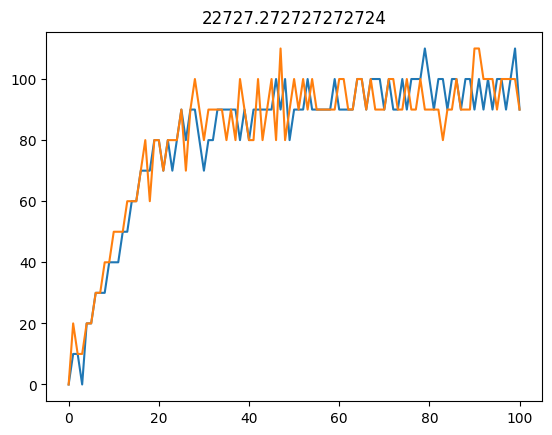

depth_power310.0vel700.0
key_power340.0vel1300.0
27777.777777777777 4.0
19047.619047619046 4.58257569495584
nan 0.0


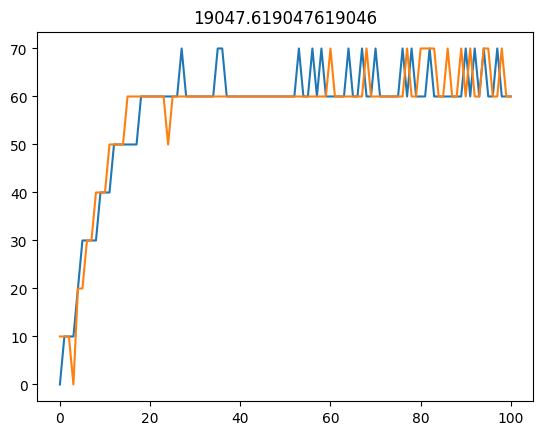

depth_power340.0vel1300.0
key_power340.0vel350.0
nan nan
nan nan
nan nan


/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


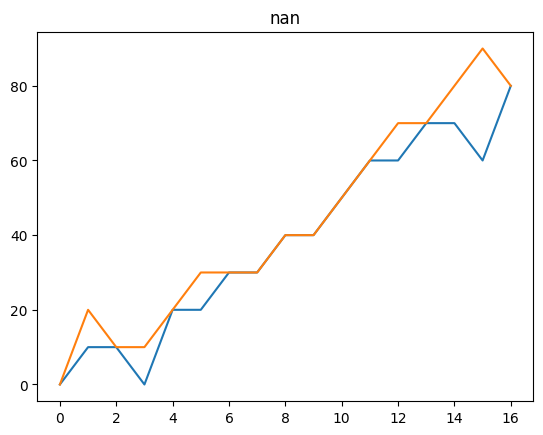

depth_power340.0vel350.0
key_power340.0vel550.0
21739.130434782608 7.4535599249993
23809.523809523806 6.506407098647712
21739.130434782608 5.0


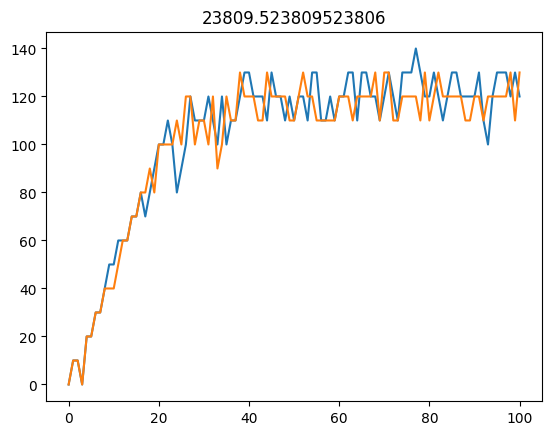

depth_power340.0vel550.0
key_power340.0vel650.0
33333.33333333333 5.972157622389639
12499.999999999998 4.422166387140534
23076.923076923074 4.898979485566356


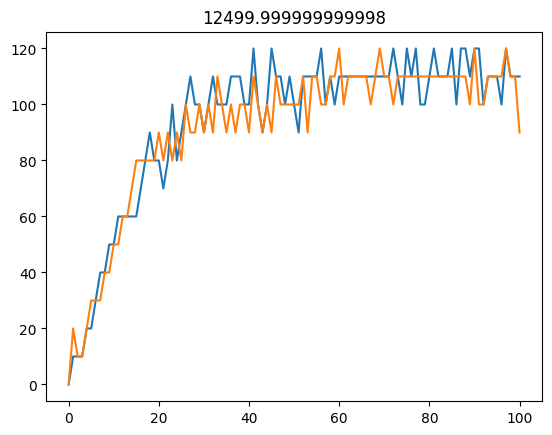

depth_power340.0vel650.0
key_power370.0vel1500.0
8695.652173913044 3.0
nan 1.7950549357115015
nan 0.0


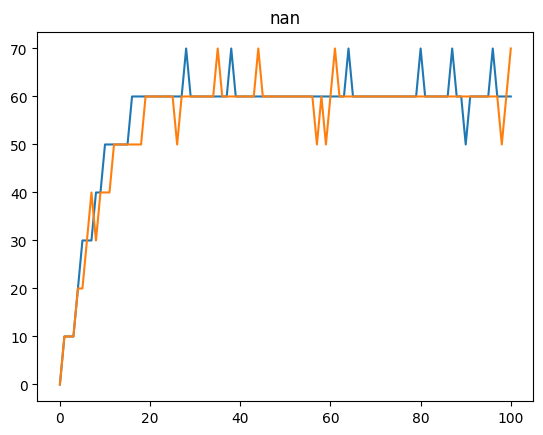

depth_power370.0vel1500.0
key_power400.0vel1400.0
14285.714285714284 3.3993463423951904
8695.652173913044 3.0
nan 0.0


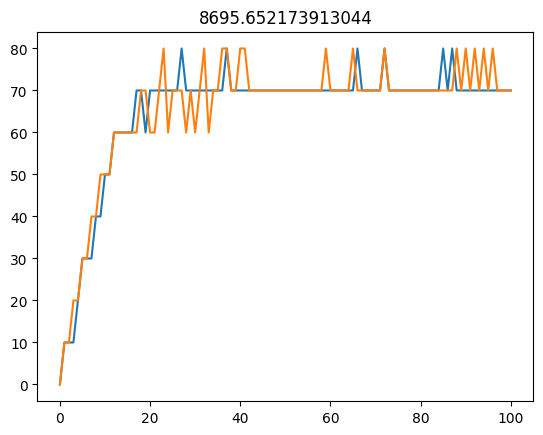

depth_power400.0vel1400.0
key_power400.0vel1500.0
25925.925925925927 4.714045207910317
16666.666666666664 3.3993463423951904
nan 4.988876515698587


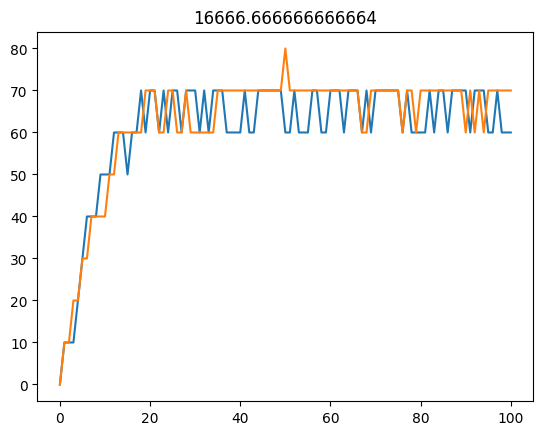

depth_power400.0vel1500.0
key_power400.0vel400.0
18181.81818181818 17.435595774162696
26923.07692307692 14.772346537440225
9523.809523809523 4.818944098266986


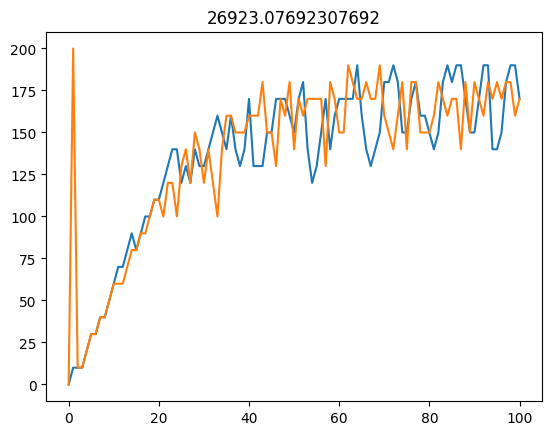

depth_power400.0vel400.0
key_power400.0vel550.0
29629.629629629624 8.621678104251709
20000.0 6.708203932499369
15789.473684210527 4.760952285695233


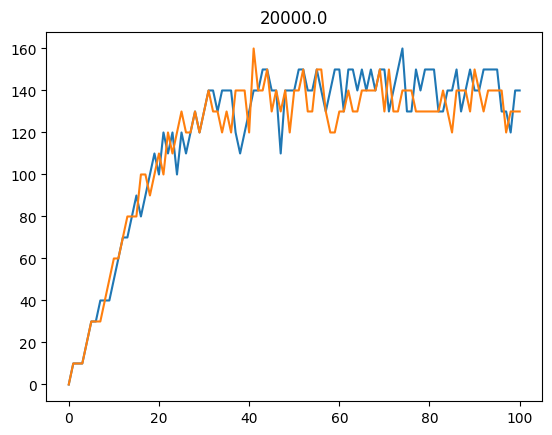

depth_power400.0vel550.0
key_power400.0vel650.0
27999.999999999996 7.340905181848414
38095.23809523809 7.156970184527963
29166.666666666668 4.988876515698588


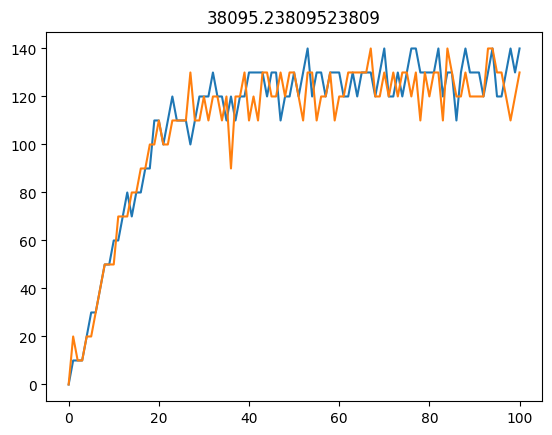

depth_power400.0vel650.0
key_power400.0vel700.0


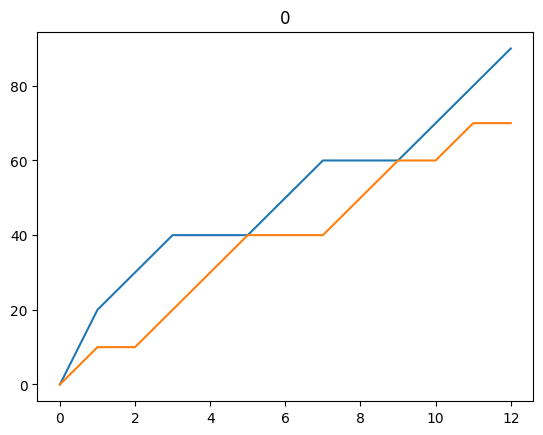

depth_power400.0vel700.0
key_power400.0vel900.0
nan nan


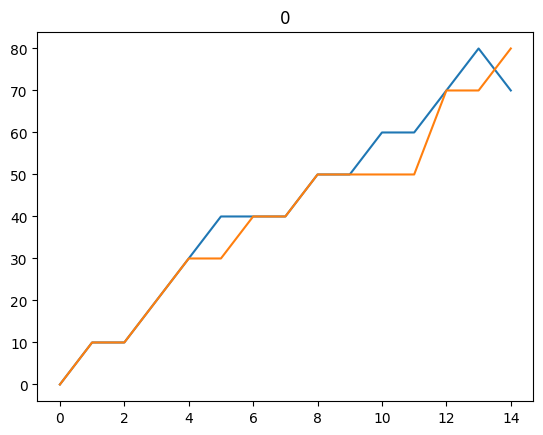

depth_power400.0vel900.0
key_power430.0vel550.0


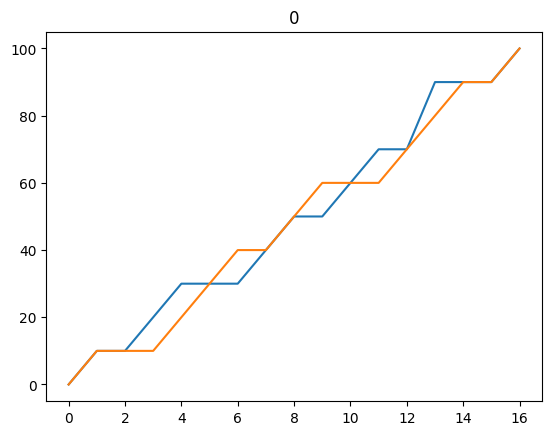

depth_power430.0vel550.0
key_power430.0vel650.0
22727.272727272728 6.182412330330468
23076.923076923074 7.895146188218008
nan 3.399346342395191


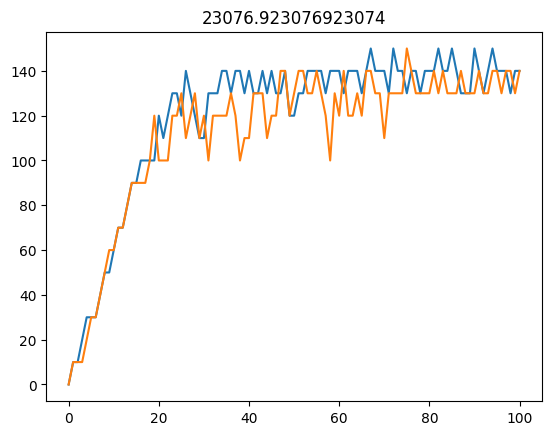

depth_power430.0vel650.0
key_power460.0vel1150.0
28571.42857142857 5.374838498865699
22727.272727272724 5.120763831912405
18181.81818181818 4.714045207910317


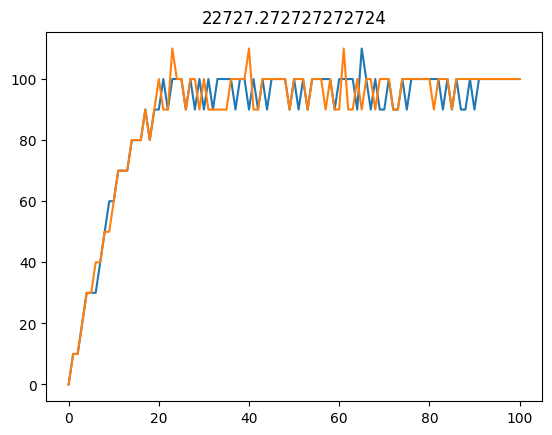

depth_power460.0vel1150.0
key_power460.0vel200.0
27999.999999999996 32.72104317815474
36363.63636363636 36.66060555964672
15999.999999999996 14.067298564006128


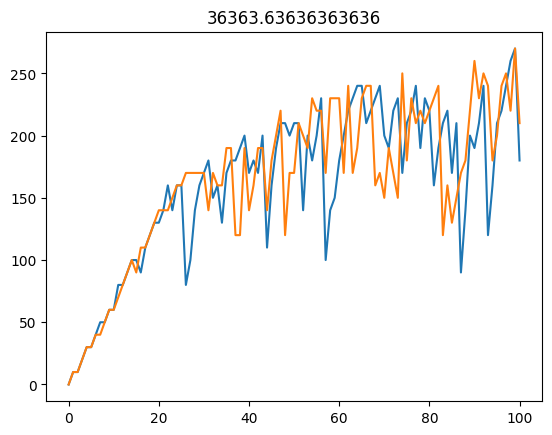

depth_power460.0vel200.0
key_power460.0vel450.0
26086.95652173913 19.27865832122834
30769.230769230766 23.019315560826062
19047.619047619046 8.439325934114775


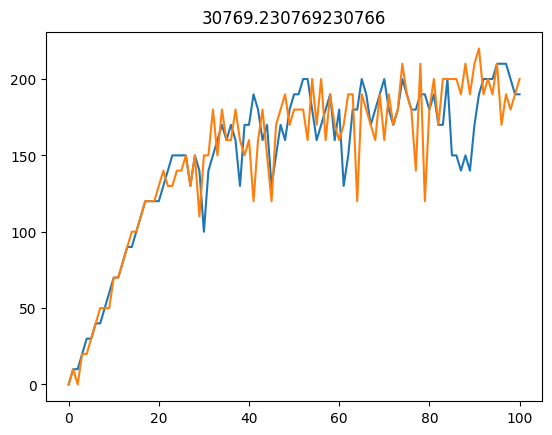

depth_power460.0vel450.0
key_power490.0vel1150.0
21052.631578947367 5.217491947499509
18181.81818181818 4.268749491621899
nan 0.0


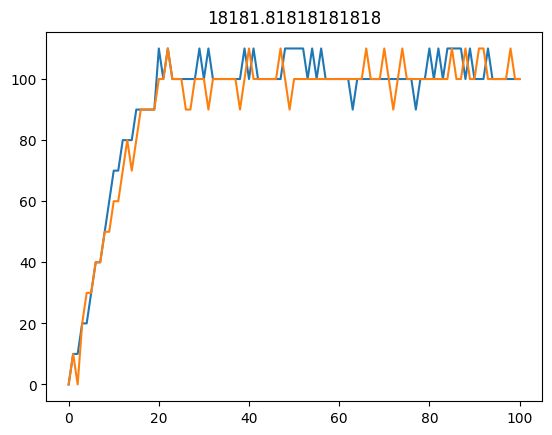

depth_power490.0vel1150.0
key_power490.0vel1350.0
nan 2.581988897471611
14285.714285714284 4.068851871911234
nan 0.0


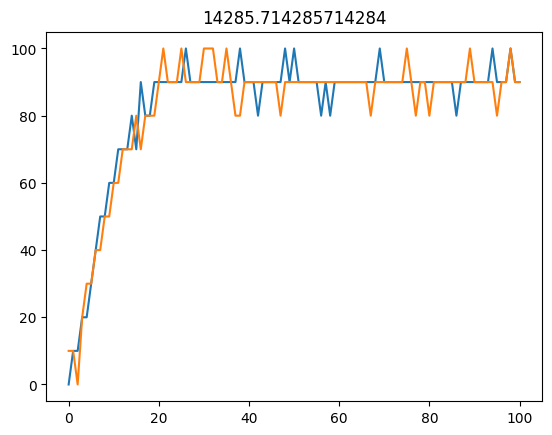

depth_power490.0vel1350.0


In [28]:
powers = []
vels = []
gtfreqs = []
diffreqs = []
encfreqs = []
encamps= []
gtamps = []
diffamps = []
for key in gt_results.keys():
    print(key)
    if 'key' in key:
        power = float(key.split('power')[1].split('vel')[0])
        vel = float(key.split('vel')[1])
        powers.append(power)
        vels.append(vel)
        plt.plot(gt_results[key])
        gtfreq, amp = get_frequency_old(gt_results[key])
        gtfreqs.append(gtfreq)
        gtamps.append(amp)
        diffreq, amp = get_frequency_old(diff_results[key])
        diffreqs.append(diffreq)
        diffamps.append(amp)
        encfreq, amp = get_frequency_old(enc_results[key])
        encfreqs.append(encfreq)
        encamps.append(amp)
        plt.plot(diff_results[key])
        plt.title(diffreq)
        plt.show()

In [22]:

# sns.reset_orig()
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.plot(5*np.arange(len(gt_results[key])), diff_results['key_power310.0vel250.0'], '--', label = 'Diffusion')
plt.plot(5*np.arange(len(gt_results[key])), enc_results['key_power310.0vel250.0'], '--', label = 'CNN')
plt.plot(5*np.arange(len(gt_results[key])), gt_results['key_power310.0vel250.0'],'k', linewidth = 2.0, label = 'Ground Truth')
legend(fontsize = 10)
plt.xlabel('Time $[\mu s]$', fontsize = 12)
plt.ylabel('Keyhole Depth $[\mu m]$', fontsize = 12)
plt.xlim([0, 500])
plt.ylim([0,200])
# plt.plot(diff_results['depth_power310.0vel250.0'])
# plt.plot(enc_results['depth_power310.0vel250.0'])
# plt.plot(gt_results['depth_power310.0vel250.0'])
frame_tick()

# 
# plt.fill_between(bins,gtmeans- gtstds, gtmeans+gtstds, alpha = 0.2)
# plt.fill_between(bins,  diffmeans- diffstds, diffmeans+diffstds, alpha = 0.2)
# plt.fill_between(bins, encmeans- encstds, encmeans+encstds, alpha = 0.2)
# sns.set_style('ticks')

# sns.set_palette('colorblind')



NameError: name 'gt_results' is not defined

<Figure size 780x585 with 0 Axes>

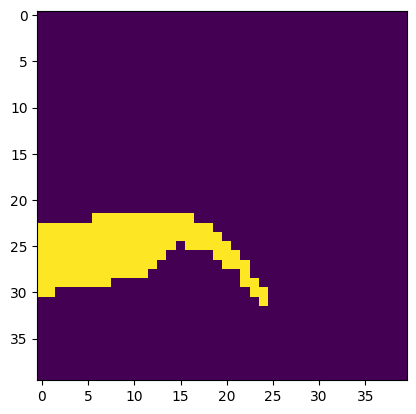

In [55]:
from skimage import measure
binarized = result_diffusion[0][0].T>1900
labeled = measure.label(binarized)
props = measure.regionprops(labeled)
print(props)
filtered = np.copy(binarized)
max_area = np.argmax([p.area for p in props])
mp_label = props[max_area].label
filtered[labeled != mp_label] = 0
plt.imshow(filtered)
# np.unique(labeled)
# filtered[labele]

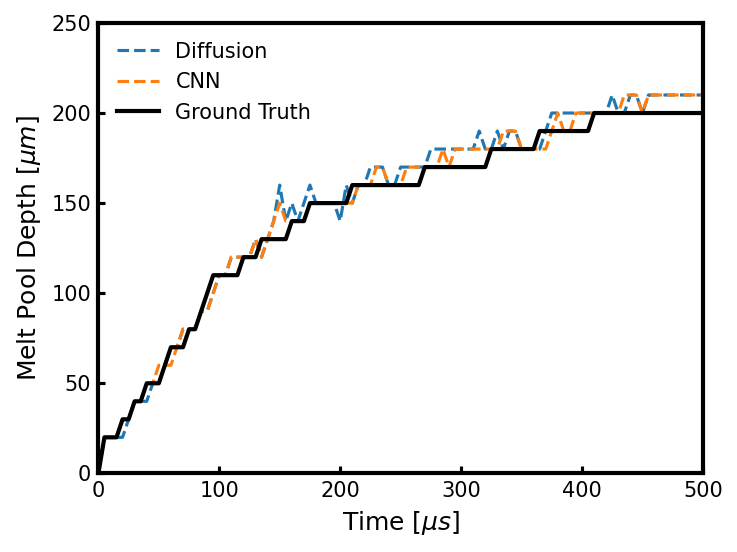

In [32]:

# sns.reset_orig()
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.plot(5*np.arange(len(gt_results[key])), diff_results['depth_power310.0vel250.0'], '--', label = 'Diffusion')
plt.plot(5*np.arange(len(gt_results[key])), enc_results['depth_power310.0vel250.0'], '--', label = 'CNN')
plt.plot(5*np.arange(len(gt_results[key])), gt_results['depth_power310.0vel250.0'],'k', linewidth = 2.0, label = 'Ground Truth')
legend(fontsize = 10)
plt.xlabel('Time $[\mu s]$', fontsize = 12)
plt.ylabel('Melt Pool Depth $[\mu m]$', fontsize = 12)
plt.xlim([0, 500])
plt.ylim([0,250])
# plt.plot(diff_results['depth_power310.0vel250.0'])
# plt.plot(enc_results['depth_power310.0vel250.0'])
# plt.plot(gt_results['depth_power310.0vel250.0'])
frame_tick()
# sns.set_style('ticks')

/tmp/ipykernel_127902/3852664449.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.lineplot(x='x', y='y', data=data, ci='sd')


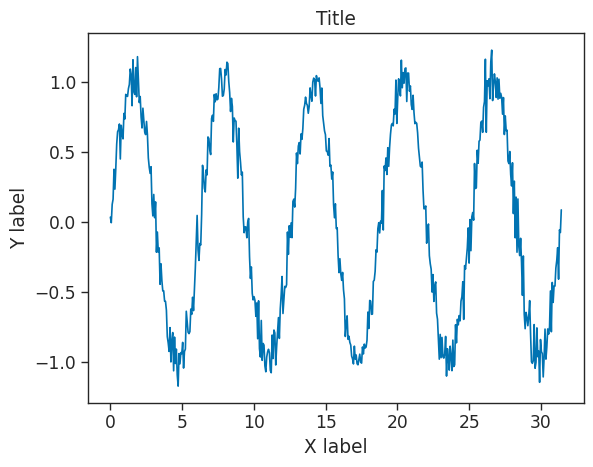

In [83]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the Seaborn style
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.4)

# Generate some data
x = np.linspace(0, 10*np.pi, 500)
y = np.sin(x) + np.random.normal(0, 0.1, size=x.shape)
data = pd.DataFrame({'x': x, 'y': y})

# Create the plot
sns.lineplot(x='x', y='y', data=data, ci='sd')

# Customize the plot
plt.xlabel('X label')
plt.ylabel('Y label')
plt.title('Title')

# Save the plot
# plt.savefig('figure.pdf', bbox_inches='tight')
plt.show()

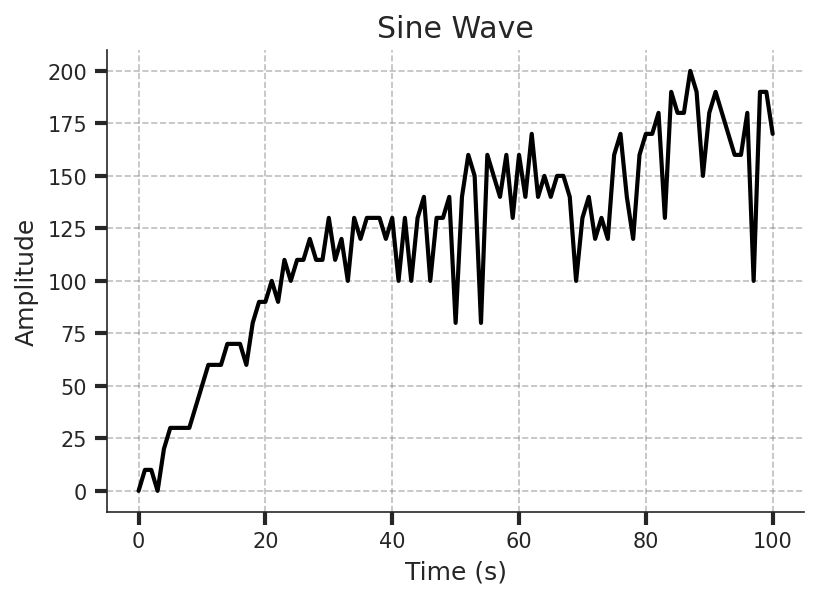

In [78]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Generate example data
x = np.arange(len(diff_results['key_power310.0vel250.0']))#np.linspace(0, 10*np.pi, 500)
# y = np.sin(x)
y = diff_results['key_power310.0vel250.0']

# Create a figure and axes object
fig, ax = plt.subplots()

# Set the figure size and resolution
fig.set_size_inches(6, 4)
fig.set_dpi(150)

# Set the font size for the title and axes labels
plt.rcParams.update({'font.size': 12})

# Plot the data with a line style and color
ax.plot(x, y, linestyle='-', linewidth=2, color='black')

# Add grid lines to the plot
ax.grid(True, linestyle='--', color='gray', alpha=0.5)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Set the tick parameters for the x and y axes
ax.tick_params(axis='both', which='major', length=6, width=2, labelsize=10)

# Set the limits for the x and y axes
# ax.set_xlim([0, 10*np.pi])
# ax.set_ylim([-1.2, 1.2])

# Add axis labels and a title
ax.set_xlabel('Time (s)')
ax.set_ylabel('Amplitude')
ax.set_title('Sine Wave')

# Use seaborn to set the style and color palette
sns.set_style('ticks')
sns.set_palette('colorblind')

# Show the plot
plt.show()


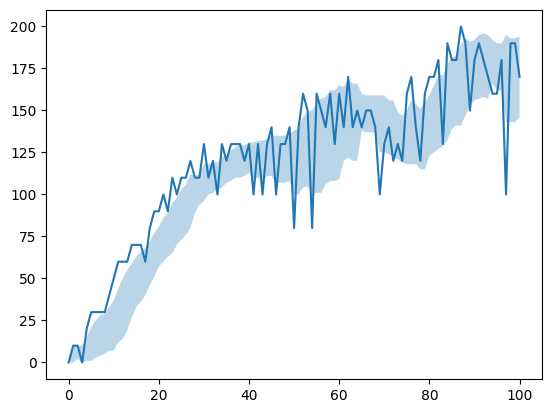

In [75]:
import numpy as np
import matplotlib.pyplot as plt

# Generate example data with noise
data = diff_results['key_power310.0vel250.0']#np.sin(np.linspace(0, 10*np.pi, 500)) + np.random.normal(0, 0.1, 500)

# Define window size for local standard deviation and mean
window_size = 10

# Calculate rolling mean and standard deviation using a window
rolling_mean = np.zeros_like(data)
rolling_std = np.zeros_like(data)
for i in range(len(data)):
    if i < window_size:
        rolling_mean[i] = np.mean(data[:i+1])
        rolling_std[i] = np.std(data[:i+1])
    else:
        rolling_mean[i] = np.mean(data[i-window_size:i+1])
        rolling_std[i] = np.std(data[i-window_size:i+1])

# Plot data with shaded region
plt.plot(data)
plt.fill_between(range(len(data)), rolling_mean-rolling_std, rolling_mean+rolling_std, alpha=0.3)
plt.show()


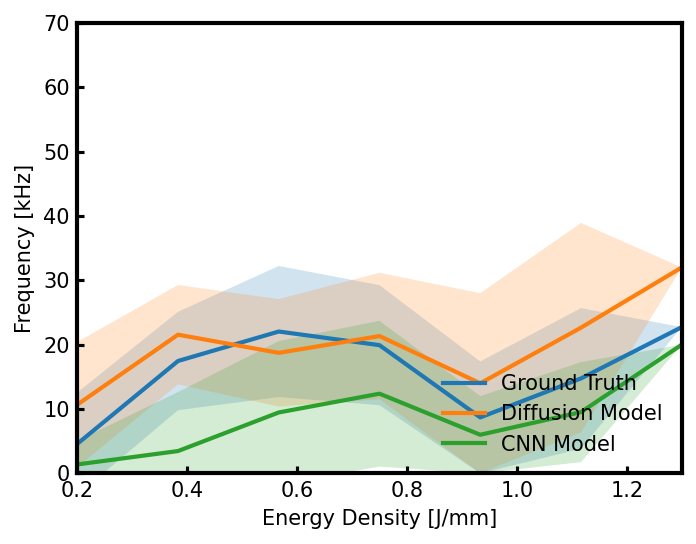

In [65]:
nanreplace_encfreqs = np.copy(encfreqs)
nanreplace_encfreqs[np.isnan(encfreqs)] = 0

nanreplace_diffreqs = np.copy(diffreqs)
nanreplace_diffreqs[np.isnan(diffreqs)] = 0


nanreplace_gtfreqs = np.copy(gtfreqs)
nanreplace_gtfreqs[np.isnan(gtfreqs)] = 0
# bins = np.linspace(0.2,0.8, 15 )
bins = np.linspace(0.2,1.3, 7 )
gtmeans = []
gtstds = []
diffmeans = []
diffstds = []
encmeans = []
encstds = []
digitized_density = np.digitize(np.array(powers)/np.array(vels), bins)
for idx, bin in enumerate(bins):
    gtarray = np.array(nanreplace_gtfreqs)[digitized_density == idx]/1000
    diffarray = np.array(nanreplace_diffreqs)[digitized_density == idx]/1000
    encarray = np.array(nanreplace_encfreqs)[digitized_density == idx]/1000

    gtmean = np.mean(gtarray)
    encmean = np.mean(encarray)
    # diffmean = np.mean(diffarray)

    gtstd = np.std(gtarray)
    encstd = np.std(encarray)
    # diffstd = np.std(diffarray)

    gtstd = np.std(gtarray)
    gtmean = np.mean(gtarray)
    encstd = np.std(encarray)
    encmean = np.mean(encarray)
    diffstd = np.std(diffarray)
    diffmean = np.mean(diffarray)

    gtmeans.append(gtmean)
    gtstds.append(gtstd)


    encmeans.append(encmean)
    encstds.append(encstd)
    diffmeans.append(diffmean)
    diffstds.append(diffstd)
# np.digitize(np.array(powers)/np.array(vels), bins
# )
encmeans = np.array(encmeans)
encstds = np.array(encstds)
diffmeans = np.array(diffmeans)
diffstds = np.array(diffstds)
gtmeans = np.array(gtmeans)
gtstds = np.array(gtstds)
# plt.plot(gtmeans+gtstds)
# plt.plot(gtmeans-gtstds)

# plt.plot(diffmeans)
import scipy
from scipy import interpolate
interpstds = interpolate.interp1d(np.arange(len(bins)), gtstds)
interpmeans = interpolate.interp1d(np.arange(len(bins)), gtmeans)
plt.figure(dpi= 150, figsize = np.array([4,3])*1.3)
# interp_length = 10
# interp_array = np.linspace(0, len(bins) -1 , interp_length)
# plt.fill_between(interp_array, interpmeans(interp_array) - interpstds(interp_array), interpmeans(interp_array) + interpstds(interp_array), alpha = 0.5)
# plt.fill_between(interp_array, interpmeans(interp_array) - interpstds(interp_array), interpmeans(interp_array) + interpstds(interp_array), alpha = 0.5)

plt.plot(bins,gtmeans, label = 'Ground Truth', linewidth = 2.0)
plt.plot(bins,diffmeans, label = 'Diffusion Model', linewidth = 2.0)
plt.plot(bins,encmeans, label = 'CNN Model', linewidth = 2.0)


plt.fill_between(bins,gtmeans- gtstds, gtmeans+gtstds, alpha = 0.2)
plt.fill_between(bins,  diffmeans- diffstds, diffmeans+diffstds, alpha = 0.2)
plt.fill_between(bins, encmeans- encstds, encmeans+encstds, alpha = 0.2)
# plt.xlim()
frame_tick()
plt.legend(frameon = False, loc= 'lower right')
plt.xlim([0.2, 1.3])
plt.ylim([0, 70])
plt.ylabel('Frequency [kHz]')
plt.xlabel('Energy Density [J/mm]')
plt.show()

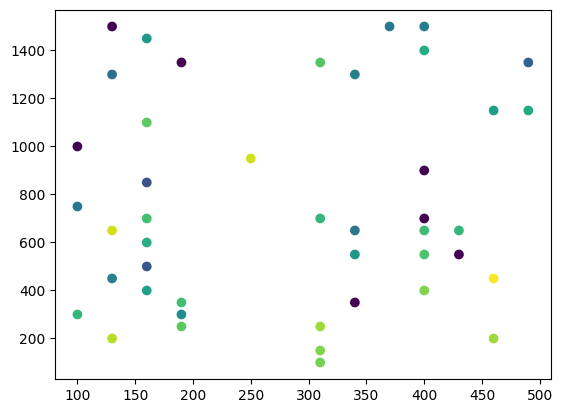

In [36]:
plt.scatter(powers, vels,  c= nanreplace_diffreqs)

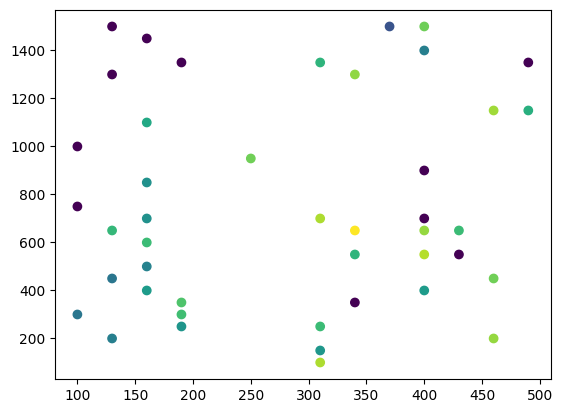

In [38]:
plt.scatter(powers, vels,  c= nanreplace_gtfreqs)


0.3119442033144314
-0.5391092066467431
0.5735119469362726
0.940184713196665


(0.0, 45.0)

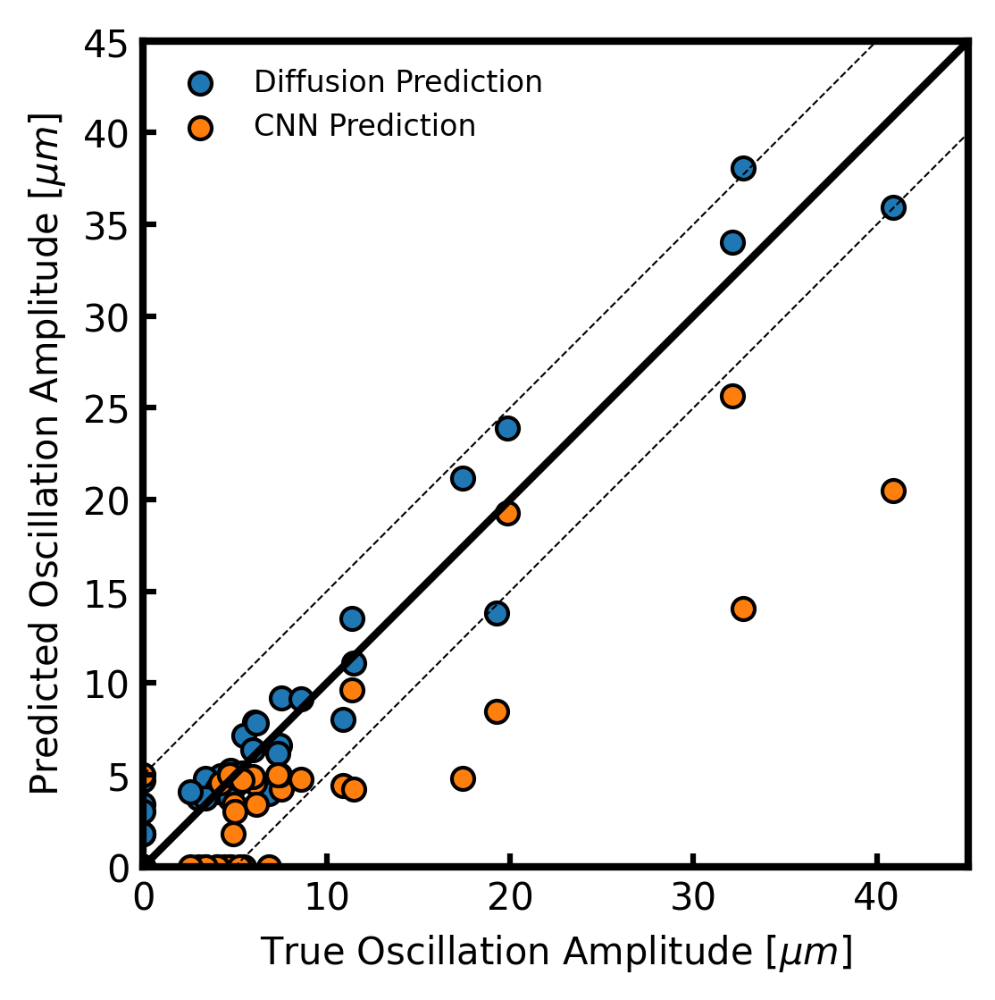

In [122]:

plt.figure(dpi = 300,figsize = [4,4])
plt.scatter(gtamps, diffamps, edgecolors='k', label = 'Diffusion Prediction')
plt.scatter(gtamps, encamps, edgecolors = 'k', label='CNN Prediction')
nanreplace_diffamps = np.copy(diffamps)
nanreplace_encamps = np.copy(encamps)
nanreplace_gtamps = np.copy(gtamps)
nanreplace_encamps[np.isnan(encamps)] = 0

# nanreplace_diffamps = np.copy(diffamps)
nanreplace_diffamps[np.isnan(diffamps)] = 0
nanreplace_gtamps[np.isnan(gtamps)] = 0

from sklearn.metrics import r2_score

print(r2_score(nanreplace_gtfreqs, nanreplace_diffreqs))
print(r2_score(nanreplace_gtfreqs, nanreplace_encfreqs))
print(r2_score(nanreplace_gtamps, nanreplace_encamps))
print(r2_score(nanreplace_gtamps, nanreplace_diffamps))
frame_tick()
plt.gca().set_aspect('equal')
plt.plot([0,60], [0,60], 'k-', linewidth = 2.0)
plt.plot([0,60], [5,60+5], 'k--', linewidth = 0.5)
plt.plot([0,60], [-5,60-5], 'k--', linewidth = 0.5)
plt.xlabel(r'True Oscillation Amplitude $[\mu m$]')
plt.ylabel(r'Predicted Oscillation Amplitude $[\mu m$]')

legend()
plt.xlim([0,45])
plt.ylim([0,45])

In [1]:

plt.figure(dpi = 300,figsize = [4,4])
plt.scatter(nanreplace_gtfreqs/1e3, nanreplace_diffreqs/1e3, edgecolors='k', label = 'Diffusion Prediction')
plt.scatter(nanreplace_gtfreqs/1e3, nanreplace_encfreqs/1e3, edgecolors = 'k', label='CNN Prediction')
nanreplace_diffamps = np.copy(diffamps)
nanreplace_encamps = np.copy(encamps)
nanreplace_gtamps = np.copy(gtamps)
nanreplace_encamps[np.isnan(encamps)] = 0

# nanreplace_diffamps = np.copy(diffamps)
nanreplace_diffamps[np.isnan(diffamps)] = 0
nanreplace_gtamps[np.isnan(gtamps)] = 0

from sklearn.metrics import r2_score

print(r2_score(nanreplace_gtfreqs, nanreplace_diffreqs))
print(r2_score(nanreplace_gtfreqs, nanreplace_encfreqs))
print(r2_score(nanreplace_gtamps, nanreplace_encamps))
print(r2_score(nanreplace_gtamps, nanreplace_diffamps))
frame_tick()
plt.gca().set_aspect('equal')
plt.plot([0,60], [0,60], 'k-', linewidth = 2.0)
plt.plot([0,60], [5,60+5], 'k--', linewidth = 0.5)
plt.plot([0,60], [-5,60-5], 'k--', linewidth = 0.5)
plt.xlabel(r'True Oscillation Frequency $[\mu m$]')
plt.ylabel(r'Predicted Oscillation Frequency $[\mu m$]')

legend()
# plt.xlim([0,45])
# plt.ylim([0,45])

NameError: name 'plt' is not defined

In [2]:
plt.scatter(nanreplace_gtfreqs[nanreplace_gtfreqs> 0], nanreplace_diffreqs[nanreplace_gtfreqs> 0])
plt.scatter(nanreplace_gtfreqs[nanreplace_gtfreqs> 0], nanreplace_encfreqs[nanreplace_gtfreqs> 0])
from sklearn.metrics import r2_score

print(r2_score(nanreplace_gtfreqs[nanreplace_gtfreqs> 0], nanreplace_diffreqs[nanreplace_gtfreqs> 0]))
print(r2_score(nanreplace_gtfreqs[nanreplace_gtfreqs> 0], nanreplace_encfreqs[nanreplace_gtfreqs> 0]))
# plt.xscale('log')
# plt.yscale('log')

NameError: name 'plt' is not defined

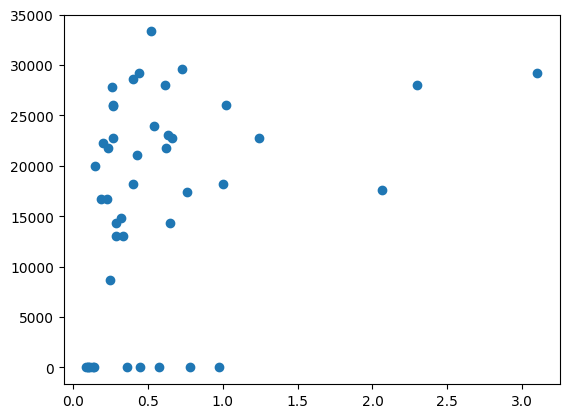

In [46]:
plt.scatter(np.array(powers)/np.array(vels),  nanreplace_gtfreqs)


In [ ]:
diffamps

[2.3848480035423645e-05,
 2.0964402515681343e-05,
 2.2110831935702667e-05,
 2.6010444246043618e-05,
 1.57797338380595e-05,
 2.785677655436824e-05,
 1.3819269959814168e-05,
 1.9587584572574413e-05,
 3.7361990944634357e-05,
 3.498571136907181e-05,
 1.4356965173029845e-05,
 2.415933503612538e-05,
 3.177855476905576e-05,
 2.256102834535696e-05,
 1.118033988749895e-05,
 1.192261549873091e-05,
 8e-06,
 2.004127971368055e-05,
 1.3743685418725536e-05,
 2.0928844424038797e-05,
 1.2639751327042297e-05,
 3.072458299147443e-05,
 7.483314773547884e-06,
 1.0088366960464615e-05,
 1.3234346564680966e-05,
 3.4292856398964496e-05,
 nan,
 9.394961741404221e-06,
 1.5634719199411434e-05,
 2.5e-05,
 5.1536394906900504e-05,
 2.0245407953654e-05,
 1.1234866364235145e-05,
 2.299987136573239e-05,
 2.135415650406262e-05,
 nan,
 nan,
 nan,
 7.71722460186015e-06,
 1.7633419974582358e-05,
 6.614378277661478e-06,
 1.1570838237598051e-05,
 9.069178573608526e-05,
 1.617802197617893e-05]

/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/oogoke/anaconda3/envs/stylegan/lib/python3.8/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


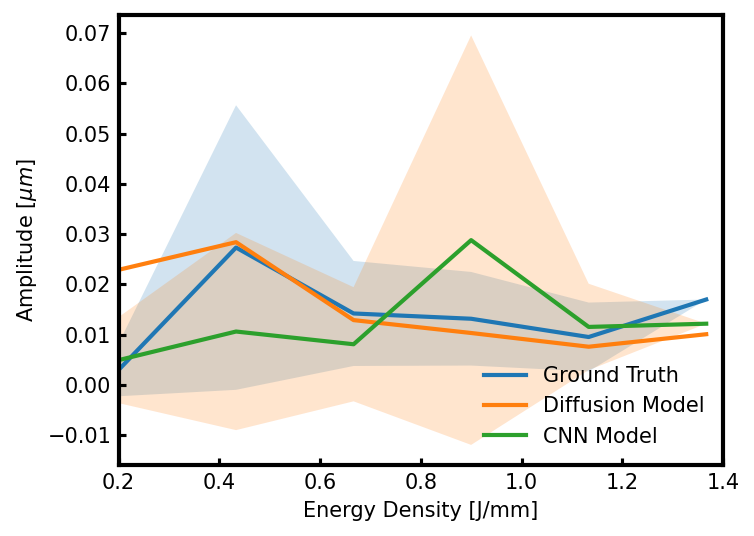

In [ ]:
nanreplace_encfreqs = np.copy(encamps)*1e6
nanreplace_encfreqs[np.isnan(encamps)] = 0

nanreplace_diffreqs = np.copy(diffamps)*1e6
nanreplace_diffreqs[np.isnan(diffamps)] = 0


nanreplace_gtfreqs = np.copy(gtamps)*1e6
nanreplace_gtfreqs[np.isnan(gtamps)] = 0

bins = np.linspace(0.2,1.6, 7 )
gtmeans = []
gtstds = []
diffmeans = []
diffstds = []
encmeans = []
encstds = []
digitized_density = np.digitize(np.array(powers)/np.array(vels), bins)
for idx, bin in enumerate(bins):
    gtarray = np.array(nanreplace_gtfreqs)[digitized_density == idx]/1000
    diffarray = np.array(nanreplace_diffreqs)[digitized_density == idx]/1000
    encarray = np.array(nanreplace_encfreqs)[digitized_density == idx]/1000

    gtmean = np.mean(gtarray)
    encmean = np.mean(encarray)
    diffmean = np.mean(diffarray)

    gtstd = np.std(gtarray)
    encstd = np.std(encarray)
    diffstd = np.std(diffarray)

    gtstd = np.std(gtarray)
    gtmean = np.mean(gtarray)
    encstd = np.std(encarray)
    encmean = np.mean(encarray)
    diffstd = np.std(diffarray)
    diffmean = np.mean(diffarray)

    gtmeans.append(gtmean)
    gtstds.append(gtstd)


    encmeans.append(encmean)
    encstds.append(encstd)
    diffmeans.append(diffmean)
    diffstds.append(diffstd)
# np.digitize(np.array(powers)/np.array(vels), bins
# )
encmeans = np.array(encmeans)
encstds = np.array(encstds)
diffmeans = np.array(diffmeans)
diffstds = np.array(diffstds)
gtmeans = np.array(gtmeans)
gtstds = np.array(gtstds)
# plt.plot(gtmeans+gtstds)
# plt.plot(gtmeans-gtstds)

# plt.plot(diffmeans)
import scipy
from scipy import interpolate
interpstds = interpolate.interp1d(np.arange(len(bins)), gtstds)
interpmeans = interpolate.interp1d(np.arange(len(bins)), gtmeans)
plt.figure(dpi= 150, figsize = np.array([4,3])*1.3)
# interp_length = 10
# interp_array = np.linspace(0, len(bins) -1 , interp_length)
# plt.fill_between(interp_array, interpmeans(interp_array) - interpstds(interp_array), interpmeans(interp_array) + interpstds(interp_array), alpha = 0.5)
# plt.fill_between(interp_array, interpmeans(interp_array) - interpstds(interp_array), interpmeans(interp_array) + interpstds(interp_array), alpha = 0.5)

plt.plot(bins,gtmeans, label = 'Ground Truth', linewidth = 2.0)
plt.plot(bins,diffmeans, label = 'Diffusion Model', linewidth = 2.0)
plt.plot(bins,encmeans, label = 'CNN Model', linewidth = 2.0)


plt.fill_between(bins,gtmeans- gtstds, gtmeans+gtstds, alpha = 0.2)
# plt.fill_between(bins,  diffmeans- diffstds, diffmeans+diffstds, alpha = 0.2)
plt.fill_between(bins, encmeans- encstds, encmeans+encstds, alpha = 0.2)
# plt.xlim()
frame_tick()
plt.legend(frameon = False, loc= 'lower right')
plt.xlim([0.2, 1.4])
# plt.ylim([0, 70])
plt.ylabel(r'Amplitude [$\mu m$]')
plt.xlabel('Energy Density [J/mm]')
plt.show()

In [21]:
for split, dataloader in zip([ 'Test'], [ test_dataloader]):
    for batch_idx, (res, hr, lr, upscaled_lr, info) in enumerate(dataloader):  
        info = info[0]
        # print(info[2])
        
        # input, lr_enc_result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, dataloader.dataset)
        analysis_folder = f'analyzed_figures_paper_3_27_morning/{timesteps}'
        os.makedirs(analysis_folder, exist_ok=True)
        # plt.imshow(input[0,1,:, :].T, origin = 'lower', cmap  = 'jet', vmin = 293, vmax = 5000)
        # plt.show()
        # plt.imshow(lr_enc_result[0,1,:, :].T, origin = 'lower', cmap  = 'jet', vmin = 293, vmax = 5000)
        # plt.show()

        # plt.imshow(target[0,1,:, :].T, origin = 'lower', cmap  = 'jet', vmin = 293, vmax = 5000)
        # plt.show()
        folder = os.path.join(analysis_folder, 'time_stepped_encoder/'  + 'power' + str(info[0].item()) + 'vel' + str(info[1].item()))
        mpfname = os.path.join(folder,'time_stepped_contours/',   'batch_{:06}_'.format(batch_idx)+ 'time' + '{:07}'.format(int(np.round(info[2].item()*1e6))) + f'encoder_contour_line_{split}_plot_mp.png')
        kpfname = os.path.join(folder, 'time_stepped_contours/', 'batch_{:06}_'.format(batch_idx)+ 'time' + '{:07}'.format(int(np.round(info[2].item()*1e6))) + f'encoder_contour_line_{split}_plot_kp.png')
        os.makedirs(os.path.join(folder, 'time_stepped_contours/'), exist_ok=True)

        # kp_fname = os.path.join(analysis_folder, f'encoder_contour_line_{split}_plot_kp.png')
        # mpfname = os.path.join(analysis_folder, f'encoder_contour_line_{split}_plot_mp.png')
        plot_srdiff_contours(input, lr_enc_result, target, split =split,  modeltype = "Diffusion", save = True, kpfname = kpfname, mpfname = mpfname)
        # if batch_idx > 5:
            # break
#, result_diffusion[0], target[0][:, :], field_idx = field_idx, field_key = field_key, timestep = timestep, split = 'Validation', modeltype =modeltype, timesteps = timesteps//skips, title =  title)

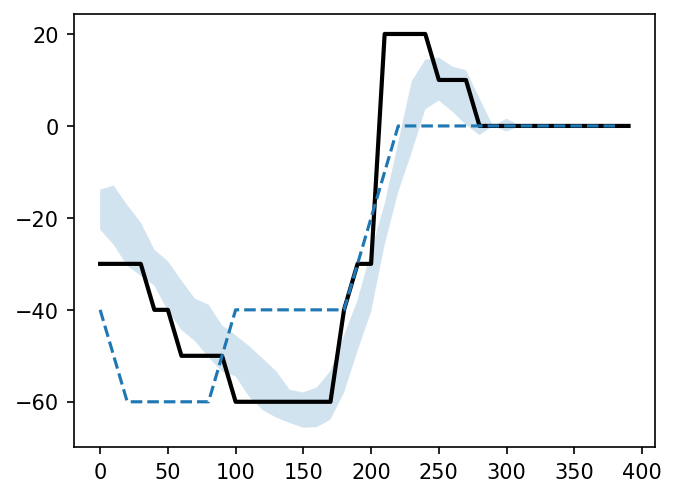

In [62]:
# input, lr_enc_result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, dataloader.dataset)
for batch_idx, (res, hr, lr, upscaled_lr, info) in enumerate(test_dataloader):  
    if batch_idx == 1708:
        contour_results = []
        info = info[0]
        plt.figure(dpi = 150, figsize = np.array([4,3])*1.25)
        folder = os.path.join(analysis_folder, 'time_stepped_encoder/'  + 'power' + str(info[0].item()) + 'vel' + str(info[1].item()))
        mpfname = os.path.join(folder,'time_stepped_contours/',   'batch_{:06}_'.format(batch_idx)+ 'time' + '{:07}'.format(int(np.round(info[2].item()*1e6))) + f'encoder_contour_line_{split}_plot_mp.png')
        kpfname = os.path.join(folder, 'time_stepped_contours/', 'batch_{:06}_'.format(batch_idx)+ 'time' + '{:07}'.format(int(np.round(info[2].item()*1e6))) + f'encoder_contour_line_{split}_plot_kp.png')

        for i in range(50):
            input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,encoding = True,dataset =  train_dataset,seq= None, timesteps = 1000,skip = 50, schedule = 'linear')

            analysis_folder = f'analyzed_figures_paper_3_27_morning/{timesteps}'
            # os.makedirs(analysis_folder, exist_ok=True)
            # plt.imshow(input[0,1,:, :].T, origin = 'lower', cmap  = 'jet', vmin = 293, vmax = 5000)
            # plt.show()
            # plt.imshow(lr_enc_result[0,1,:, :].T, origin = 'lower', cmap  = 'jet', vmin = 293, vmax = 5000)
            # plt.show()

            # plt.imshow(target[0,1,:, :].T, origin = 'lower', cmap  = 'jet', vmin = 293, vmax = 5000)
            # plt.show()
            # os.makedirs(os.path.join(folder, 'time_stepped_contours/'), exist_ok=True)
            
            profile_result, kp_result = get_profile(result_diffusion, mesh = 10, max_idx = 30)

            profile_gt, kp_gt = get_profile(target, mesh = 10, max_idx = 30)
            profile_input, kp_input = get_profile(input, mesh = 10, max_idx = 15)

            
            # plt.plot(10*np.arange(40), 100 + kp_result*10 - 400, label = 'Diffusion Output' )
            # if np.max(100 + kp_result*10 - 400) > 5:
            #     plt.imshow(result_diffusion[0][0].T, origin = 'lower', cmap = 'jet',vmin = 293, vmax = 5000)
            #     plt.show()
            contour_results.append( 100 + kp_result*10 - 400)
        contour_std = np.std(contour_results, axis = 0)
        contour_mean = np.mean(contour_results, axis = 0)
        plt.plot(10*np.arange(40), 100 + kp_gt*10 - 400, 'k', linewidth = 2.0, label = 'High Resolution')
        plt.plot(20*np.arange(20),100 +  kp_input*20 - 400, '--', label = 'Bicubic Interpolation')

        # plt.fill_between(10*np.arange(40),100 + kp_result*10 - 400- contour_std, 100 + kp_result*10 - 400+contour_std, alpha = 0.2)
        plt.fill_between(10*np.arange(40),contour_mean- contour_std, contour_mean+contour_std, alpha = 0.2)
        plt.show()
    # plt.fill_between(bins,  diffmeans- diffstds, diffmeans+diffstds, alpha = 0.2)
    # plt.fill_between(bins, encmeans- encstds, encmeans+encstds, alpha = 0.2)
    # kp_fname = os.path.join(analysis_folder, f'encoder_contour_line_{split}_plot_kp.png')
    # mpfname = os.path.join(analysis_folder, f'encoder_contour_line_{split}_plot_mp.png')
    # plot_srdiff_contours(input, lr_enc_result, target, split =split,  modeltype = "Diffusion", save = True, kpfname = kpfname, mpfname = mpfname)`

In [31]:
np.std(contour_results, axis = 0)

array([ 4.        ,  4.        ,  4.89897949,  0.        ,  4.        ,
       19.39071943,  4.        ,  4.89897949,  4.89897949,  4.        ,
        6.32455532,  4.89897949,  4.89897949,  0.        ,  4.89897949,
        4.89897949,  6.32455532,  7.48331477,  7.48331477,  8.        ,
       27.27636339,  7.48331477, 12.64911064,  7.48331477,  7.48331477,
        7.48331477,  8.        ,  9.79795897,  4.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ])

In [ ]:
os.path.join(encoder_results_dir, 'saved_figures/{}/'.format(field_key)  + 'power' + str(info[0].item()) + 'vel' + str(info[1].item())) 
folder

'RRDNsaved_figures/liqlabel/power100.0vel1000.0'

In [ ]:
int(np.round(info[2].item()*1e6))

5000

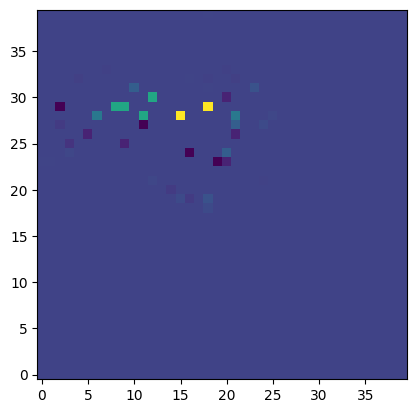

In [ ]:
# .max()
plt.imshow(train_dataset.unscale_data(hr, input_type='hr')[0][0].T, origin = 'lower')

In [ ]:
# hr.shape
# get_profile(result_diffusion[i], mesh = 10)
result_diffusion[0].shape

NameError: name 'result_diffusion' is not defined

In [125]:

def SSIM(op, t, batch_size):
    ssim = 0 
    # print(op.shape, t.shape)
    
    for i in range(op.shape[0]):

        # print(out[0,0].size())
        # print(op.shape, t.shape)
        if isinstance(op, torch.Tensor):
            score = ssim_id(op[i][0].detach().cpu().numpy(), t[i][0].detach().cpu().numpy())#, full=True)
        else:
            score = ssim_id(op[i][0], t[i][0].detach().cpu().numpy())#, full=True)
        ssim+=score/batch_size
    
        #print("SSIM: {}".format(score))
    return ssim
# model = load_diffusion('/home/oogoke/DiffusionSR/runs/direct/diffusionimplicit/2023_01_30_03_21_51/standardize/n_steps_1', dataset = train_dataset)


# max_depth_diff = []
max_depth_gt = []
max_depth_input = []
# kp_depth_enc = []
# kp_depth_diff = []
# kp_depth_mbn = []
kp_depth_gt = []
kp_depth_input = []
kp_depth_diffs = []
max_depth_diffs = []
psnrs_lr = []
psnrs_diff= []

ssims_diff = []
ssims_lr = []
factor = 2
mesh_hr = 10
mesh_lr = 20
l1_lr = []
l1_diff = []

sample_times = []
steps_list= []
psnr_mean_lr = []
ssim_mean_lr = []
l1_mean_lr = []
ssim_mean_diff = []
psnr_mean_diff = []
l1_mean_diff = []
l1loss = nn.L1Loss()
# sample_diff_steps = [50, 100,200, 500, 1000, 1500, 2000]
# sim = simlinear1500
timesteps=1000
# model = load_diffusion(sim.folder)
for skips in [ 50]:
    diff_steps = 1000
# for diff_steps in sample_diff_steps:
    kp_depth_diff = []
    max_depth_diff = []
    max_depth_input= []
    kp_depth_input = []
    max_depth_gt  = []
    kp_depth_gt = []
    psnr_batches_lr = []
    psnr_batches_diff = []
    l1_batches_diff = []
    l1_batches_lr = []
    ssim_batches_lr = []
    ssim_batches_diff = []
    print(skips)
    for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(test_dataloader), total =len(test_dataloader)):  
        oldtime = time.time()
        # print(res.shape, 'res shape')
        input_fields, result_diffusion_fields, target_fields, _, _ = predict_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,train_dataset,seq= None, timesteps = timesteps,skip = skips, schedule = 'linear')
        input = input_fields[:,  1:2]
        result_diffusion = result_diffusion_fields[:,1:2]
        target = target_fields[:, 1:2]
        # print(result_diffusion.shape)
        upscale = dev_dataset.unscale_data(upscaled_lr, input_type = 'upscaled_lr')
        # lrpsnr = PSNR(upscale, target, target.shape[0]).item()

        # diffpsnr = PSNR(result_diffusion, target, target.shape[0]).item()
        # print(lrpsnr, diffpsnr)
        # psnr_batches_diff.append(diffpsnr)
        # psnr_batches_lr.append((lrpsnr))
        # lrssim = SSIM(upscale, target.view(upscale.shape), target.shape[0])
        # diffssim = SSIM(result_diffusion, target.view(upscale.shape), target.shape[0])
        lrl1 =np.mean(np.abs(upscale-target_fields ), axis = (0,2,3))
        # print('shape printing here')
        # print(type(result_diffusion), type(target))
        # print(result_diffusion.shape, target.shape)
        diffl1 = np.mean(np.abs(result_diffusion_fields-target_fields ), axis = (0,2,3))
        # print('LR SSIM: ',  SSIM(upscale, target.view(upscale.shape), target.shape[0]))
        # print(result_diffusion.shape, target.shape, 'shapes result diffusion target')
        # print('Diffusion SSIM: ',  SSIM(result_diffusion, target.view(upscale.shape), target.shape[0]))
        # ssim_batches_lr.append(lrssim)
        # ssim_batches_diff.append(diffssim)
        l1_batches_lr.append(lrl1)
        l1_batches_diff.append(diffl1)
        for i, rd in enumerate(result_diffusion):
            elapsed = time.time() - oldtime
            if batch_idx == 0:
                sample_times.append(elapsed)
                steps_list.append(timesteps//skips)
            profile_diff, kp_diff = get_profile(result_diffusion, mesh = 10, max_idx = 30)
            # print(result_diffusion[i].shape)
            # print(target.shape)
            profile_gt, kp_gt = get_profile(target, mesh = 10, max_idx = 30)
            profile_input, kp_input = get_profile(input, mesh = 20,max_idx = 15)
            # plt.imshow(target[i].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000)
            # plt.show()
            # plt.imshow(result_diffusion[i].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000)
            # plt.show()
            # plt.plot(profile_diff)
            # plt.plot(profile_gt)
            # # plt.plot(profile_input)
            # plt.show()
            # break

            max_depth_gt.append(mesh_hr*(20*factor-5*factor - np.min(profile_gt)))
            max_depth_diff.append(mesh_hr*(20*factor-5*factor  -np.min(profile_diff)))
            max_depth_input.append(mesh_lr*(20-5- np.min(profile_input)))
            kp_depth_gt.append(mesh_hr*(20*factor-5*factor-np.min(kp_gt)))
            kp_depth_input.append(mesh_lr*(20-5-np.min(kp_input)))
            kp_depth_diff.append(mesh_hr*(20*factor-5*factor-np.min(kp_diff)))
            # plt.imshow(result_diffusion[i][0].T, origin = 'lower', vmin  = 293, vmax = 5000, cmap ='jet')
            # plt.plot(np.arange(40),profile_gt, label = 'gt')
            # # plt.plot(np.arange(20)*2, profile_input), label = 'lr')
            # plt.plot(np.arange(40),  profile_diff, label = 'sr')
            # plt.legend()
            # plt.show()
            # plt.imshow(target[i][0].T, origin = 'lower', vmin  = 293, vmax = 5000, cmap ='jet')
            # plt.plot(np.arange(40),kp_gt, label = 'gtkp ')
            # # plt.plot(np.arange(20)*2, profile_input), label = 'lr')
            # plt.plot(np.arange(40),  kp_diff, label = 'kp sr')
            # plt.legend()
            # plt.show()
            # plt.plot(np.arange(40),-mesh_hr*(20*factor - profile_gt), label = 'gt')
            # plt.plot(np.arange(20)*2, -mesh_lr*(20 - profile_input), label = 'lr')
            # plt.plot(np.arange(40), -mesh_hr*(20*factor - profile_diff), label = 'sr')
            # plt.legend()
            # plt.show()
            # plt.imshow(result_diffusion[i, 0].T, vmin = 293, vmax = 5000, origin = 'lower', cmap = 'jet')
            # plt.colorbar()
            # plt.title('diff')
            # plt.show()
            # plt.imshow(target[i, 0].T, vmin = 293, vmax = 5000, origin = 'lower', cmap = 'jet')
            # plt.colorbar()
            # plt.title('targ')
            # plt.show()
            # plt.imshow(input[i, 0].T, vmin = 293, vmax = 5000, origin = 'lower', cmap = 'jet')
            # plt.colorbar()
            # plt.title('inp')
            # plt.show()


        # plt.plot(profile_diff)
        # plt.show()
        # if batch_idx > 9:
        #     break
    kp_depth_diffs.append(kp_depth_diff)
    max_depth_diffs.append(max_depth_diff)
    ssims_diff.append(ssim_batches_diff)
    # ssims_lr.append(ssim_batches_lr)
    l1_diff.append(l1_batches_diff)
    l1_lr.append(l1_batches_lr)
    # psnrs_lr.append(psnr_batches_lr)
    # psnrs_diff.append(psnr_1, 2, 3, 5, 10, 15, 20,an(psnr_batches_lr))
    psnr_mean_diff.append(np.mean(psnr_batches_diff, axis = 0))
    # ssim_mean_diff.append(np.mean(ssim_batches_diff))
    # ssim_mean_lr.append(np.mean(ssim_batches_lr))
    l1_mean_lr.append(np.mean(l1_batches_lr, axis = 0))
    l1_mean_diff.append(np.mean(l1_batches_diff, axis = 0))
    
    print(ssim_mean_lr)


50


  5%|▌         | 215/4094 [00:52<15:41,  4.12it/s]


KeyboardInterrupt: 

In [ ]:
# np.array(l1_batches_diff)
# 1402/4
# np.mean(l1_batches_diff, axis = 0).shape
np.array(l1_lr).shape

(4, 1402, 6)

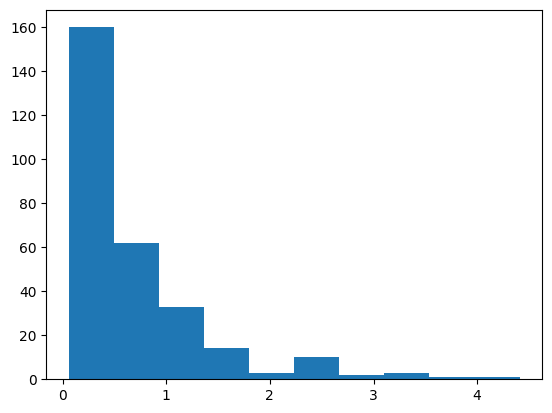

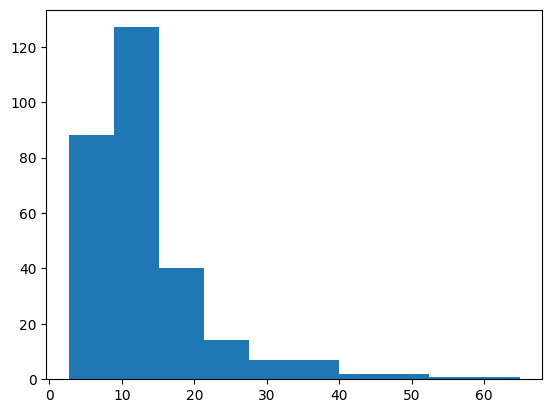

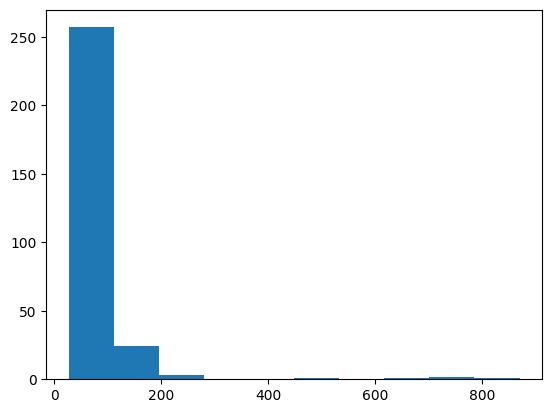

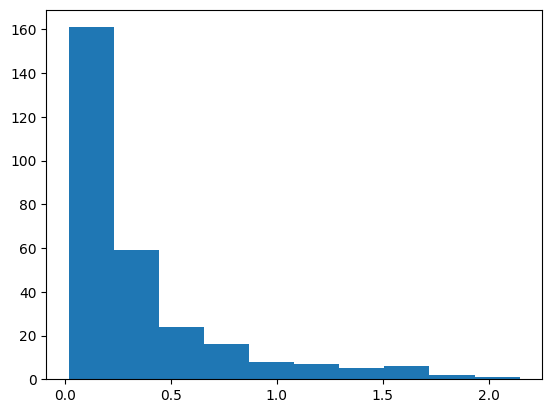

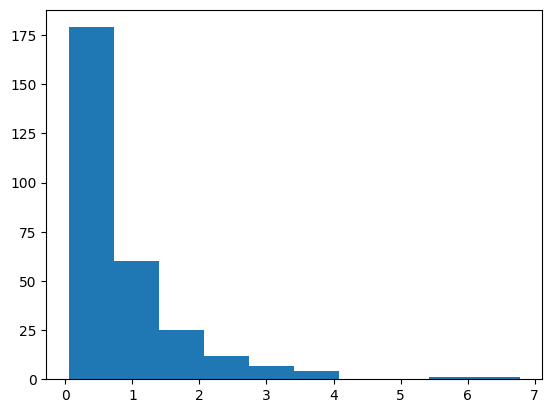

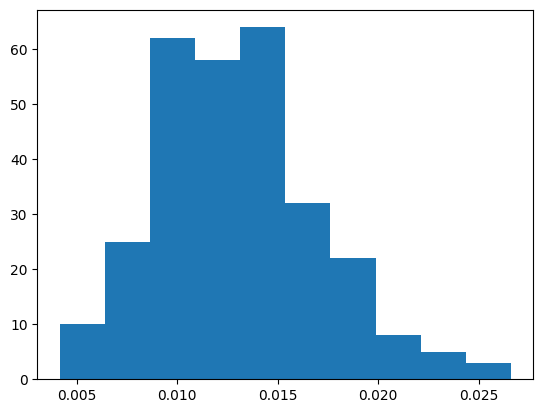

In [ ]:
# np.mean(l1_batches_diff, axis = 0
for i in range(np.array(l1_batches_diff).shape[1]):
    plt.hist(np.array(l1_batches_diff)[:,i])
    plt.show()

In [ ]:
np.mean(np.abs(result_diffusion_fields-target_fields ), axis = (0,2,3))
# target_fields.shape
# torch.nn.L1Loss()(torch.tensor(result_diffusion_fields), torch.tensor(target_fields))

array([1.85842608e-01, 1.18792901e+01, 4.89358881e+01, 9.62968144e-02,
       2.96927928e-01, 1.40944715e-02])

In [ ]:
l1_batches_diff = []
for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(test_dataloader), total =len(test_dataloader)):  
    for plot_field_idx in range(1,5):
        oldtime = time.time()
        
        input_fields, result_diffusion_fields, target_fields, _, _ = predict_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,train_dataset,seq= None, timesteps = timesteps,skip = skips, schedule = 'quadratic')
        input = input_fields[:,  plot_field_idx:plot_field_idx+1]
        result_diffusion = result_diffusion_fields[:,plot_field_idx:plot_field_idx+1]
        target = target_fields[:, plot_field_idx:plot_field_idx+1]

        upscale = dev_dataset.unscale_data(upscaled_lr, input_type = 'upscaled_lr')
        # lrl1 = l1loss(upscale, target)
        diffl1 = l1loss(torch.tensor(result_diffusion), torch.tensor(target)).item()
        print(diffl1)
        l1_batches_diff.append(diffl1)

  0%|          | 0/1402 [00:00<?, ?it/s]

6.026911471132675
57.776011057028796
0.11407231143453472


  0%|          | 1/1402 [00:08<3:12:12,  8.23s/it]

0.5824569116189479
10.129721838588765
39.54430184136923
0.15909988396566246


  0%|          | 2/1402 [00:16<3:13:24,  8.29s/it]

0.37784489903730417
7.973840406476513
59.552782588667476
0.14794602877675017


  0%|          | 3/1402 [00:24<3:10:02,  8.15s/it]

0.21991559076470452
6.192147626728629
53.33546883321244
0.1616462680298515


  0%|          | 4/1402 [00:32<3:08:13,  8.08s/it]

0.42366818275463686
8.600970956573859
56.03789381999224
0.11732065945441057


  0%|          | 5/1402 [00:40<3:07:01,  8.03s/it]

0.3211127584107815
10.045891787483363
54.26454934309611
0.2542191602574887


  0%|          | 6/1402 [00:48<3:06:09,  8.00s/it]

0.26185720988010003
14.132094917643292
48.93588813078508


  0%|          | 6/1402 [00:53<3:27:28,  8.92s/it]


KeyboardInterrupt: 

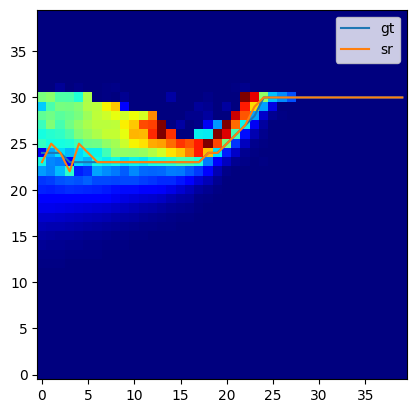

In [ ]:
# plt.plot(kp_gt)
# plt.plot(kp_diff)
plt.imshow(result_diffusion[i][0].T, origin = 'lower', vmin  = 293, vmax = 5000, cmap ='jet')
plt.plot(np.arange(40),profile_gt, label = 'gt')
# plt.plot(np.arange(20)*2, profile_input), label = 'lr')
plt.plot(np.arange(40),  profile_diff, label = 'sr')
plt.legend()
plt.show()

In [ ]:
# timesteps = 1500
for 
for timesteps in [200]:
    for skips in [1]:#, 2, 3, 5, 10, 15, 20, 50]:
        oldtime = time.time()
        input, result_diffusion, target, xs, b = predict_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,train_dataset,seq= None, timesteps = timesteps,skip = skips, schedule = 'linear')
        time_elapsed = time.time()-oldtime
        print(input.shape, result_diffusion.shape, target.shape)
        plot_images(input[0], result_diffusion[0], target[0][0], split = 'Validation', modeltype = "Diffusion", timesteps = timesteps//skips)
        print(time_elapsed, "elapsed time")

In [ ]:
# plt.imshow(xs[-1][0][0].detach().cpu().numpy())
# plt.plot(b)
len(dataloader.dataset.hr_paths)

In [ ]:
plt.imshow(result_diffusion[0].T, cmap ='jet', origin = 'lower', vmin = -100, vmax= 0)
plt.colorbar()
plt.show()
plt.imshow(result_diffusion[0].T, cmap ='jet', origin = 'lower', vmax= 293)
plt.colorbar()
plt.show()
plt.imshow(result_diffusion[0].T, cmap ='jet', origin = 'lower', vmin = 293, vmax= 1900)
plt.colorbar()
plt.show()
plt.imshow(result_diffusion[0].T, cmap ='jet', origin = 'lower', vmin= 293, vmax = 5000)
plt.colorbar()
plt.show()
plt.imshow(dev_dataloader.dataset.unscale_data(res[0,0].T.cpu().numpy(), input_type = 'residual'), cmap = 'jet', origin = 'lower')
plt.colorbar()

### Calculate melt pool and keyhole dimensions

In [105]:
# max_depth_diff = []
mesh_hr = 10
factor = 2
mesh_lr = 20
max_depth_gt = []
max_depth_input = []
lrl1s = []
diffl1s = []
encl1s = []
# kp_depth_enc = []
# kp_depth_diff = []
# kp_depth_mbn = []
kp_depth_gts = []
max_depth_gts = []
kp_depth_input = []
kp_depth_diffs = []
max_depth_diffs = []
max_depth_encs = []
kp_depth_encs = []
sample_times = []
steps_list= []
timesteps = 1000
l1loss = torch.nn.L1Loss()
for skips in [50]*5:
    kp_depth_diff = []
    max_depth_diff = []
    max_depth_input= []
    kp_depth_input = []
    max_depth_gt  = []
    kp_depth_gt = []
    max_depth_enc = []
    kp_depth_enc = []
    for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(test_dataloader), total = len(test_dataloader)):  
        oldtime = time.time()
        input, result_enc, target = predict_lrenc(lr_enc, res = res, hr  = hr, lr = lr, upscaled_lr = upscaled_lr, dataset = test_dataloader.dataset)
        input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,encoding = True,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skips, schedule = 'linear')
        # input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,dev_dataset,seq= None, timesteps = timesteps,skip = skips, schedule = 'linear')
        # print(result_diffusion.shape)
        upscale = dev_dataloader.dataset.unscale_data(upscaled_lr, input_type = 'upscaled_lr')
        for i, rd in enumerate(result_diffusion):
            elapsed = time.time() - oldtime
            if batch_idx == 0:
                sample_times.append(elapsed)
                steps_list.append(timesteps//skips)
            profile_diff, kp_diff = get_profile(result_diffusion[i], mesh = 10,max_idx = 30)
            # print(target.shape)
            profile_gt, kp_gt = get_profile(target[i], mesh = 10,max_idx = 30)
            profile_enc, kp_enc = get_profile(result_enc[i], mesh = 10,max_idx = 30)

            # print(profile_gt)
            profile_input, kp_input = get_profile(input[i], mesh = 20,max_idx = 15)
            # max_depth_gt.append(mesh_hr*(20*factor-5*factor - np.min(profile_gt)))
            # max_depth_diff.append(mesh_hr*(20*factor-5*factor - np.min(profile_diff)))
            # kp_depth_gt.append(mesh_hr*(20*factor-5*factor - np.min(profile_diff)))
            lrl1 = np.mean(np.abs(upscale- target))
            encl1 = np.mean(np.abs(result_enc- target))
            # print('shape printing here')
            # print(type(result_diffusion), type(target))
            # print(result_diffusion.shape, target.shape)
            diffl1 = np.mean(np.abs(result_diffusion- target))
            lrl1s.append(lrl1)
            diffl1s.append(diffl1)
            encl1s.append(encl1)

        
            # max_depth_gt.append(5*(80-np.min(profile_gt)))
            # max_depth_diff.append(5*(80-np.min(profile_diff)))
            # max_depth_input.append(20*(20-np.min(profile_input)))
            # kp_depth_gt.append(5*(80-np.min(kp_gt)))
            # kp_depth_input.append(20*(20-np.min(kp_input)))
            # kp_depth_diff.append(5*(80-np.min(kp_diff)))



            max_depth_gt.append(mesh_hr*(20*factor-5*factor - np.min(profile_gt)))
            max_depth_diff.append(mesh_hr*(20*factor-5*factor  -np.min(profile_diff)))
            max_depth_input.append(mesh_lr*(20-5- np.min(profile_input)))
            kp_depth_gt.append(mesh_hr*(20*factor-5*factor-np.min(kp_gt)))
            kp_depth_input.append(mesh_lr*(20-5-np.min(kp_input)))
            kp_depth_diff.append(mesh_hr*(20*factor-5*factor-np.min(kp_diff)))
            max_depth_enc.append(mesh_hr*(20*factor-5*factor  -np.min(profile_enc)))
            kp_depth_enc.append(mesh_hr*(20*factor-5*factor  -np.min(kp_enc)))

        # plt.plot(profile_diff)
        # plt.show()
        # if batch_idx > 2:
        #     break
    kp_depth_diffs.append(kp_depth_diff)
    max_depth_diffs.append(max_depth_diff)

    max_depth_encs.append(max_depth_enc)
    kp_depth_encs.append(kp_depth_enc)
    kp_depth_gts.append(kp_depth_gt)
    max_depth_gts.append(max_depth_gt)

100%|██████████| 4094/4094 [19:10<00:00,  3.56it/s]


In [108]:
# l1loss(torch.tensor(upscale), torch.tensor(target))
# np.mean(np.abs(upscale- target))
# diffl1
# np.mean(diffl1s)
from sklearn.metrics import mean_absolute_error
kps_depth = []
for max_depth, skips in zip(kp_depth_diffs, [50]*5):
    # plt.scatter(kp_depth_gt, kp_depth_diff, s = 3.0, label = 'Super Resolution, {}'.format(timesteps//skips))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    # kpmae_input = mean_absolute_error(kp_depth_gt, max_depth_input)
    kpmae_depth_diff = mean_absolute_error(kp_depth_gt, max_depth)
    kps_depth.append(kpmae_depth_diff)
    # print(mae_depth_diff, max_depth)
    # mae_depth_enc = mean_absolute_error(kp_depth_gt, max_depth_enc)
# plt.imshow(upscale[0][0].T, origin = 'lower')
# plt.colorbar()
# plt.show()
# plt.imshow(target[0][0].T, origin = 'lower')
# plt.colorbar()
# plt.show()

In [120]:
from sklearn.metrics import mean_absolute_error
maes_depth = []
for max_depth, skips in zip(max_depth_encs, [50]*5):
    # plt.scatter(kp_depth_gt, kp_depth_diff, s = 3.0, label = 'Super Resolution, {}'.format(timesteps//skips))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    # kpmae_input = mean_absolute_error(kp_depth_gt, max_depth_input)
    maxmae_depth_diff = mean_absolute_error(max_depth_gt, max_depth)
    maes_depth.append(maxmae_depth_diff)

In [122]:
# np.mean(encl1s)
# np.mean(maes_depth)
mean_absolute_error(max_depth_gt, max_depth)


2.6257938446507083

In [110]:
# np.mean(lrl1s)
from sklearn.metrics import mean_absolute_error
maes_depth = []
for max_depth, skips in zip(max_depth_diffs, [50]*5):
    # plt.scatter(kp_depth_gt, kp_depth_diff, s = 3.0, label = 'Super Resolution, {}'.format(timesteps//skips))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    # kpmae_input = mean_absolute_error(kp_depth_gt, max_depth_input)
    maxmae_depth_diff = mean_absolute_error(max_depth_gt, max_depth)
    maes_depth.append(maxmae_depth_diff)


In [114]:
np.std(kps_depth)

0.1314690155813012

In [115]:
np.mean(kps_depth)


7.6018563751831945

In [ ]:

def SSIM(op, t, batch_size):
    ssim = 0 
    # print(op.shape, t.shape)
    
    for i in range(op.shape[0]):

        # print(out[0,0].size())
        # print(op.shape, t.shape)
        if isinstance(op, torch.Tensor):
            score = ssim_id(op[i][0].detach().cpu().numpy(), t[i][0].detach().cpu().numpy())#, full=True)
        else:
            score = ssim_id(op[i][0], t[i][0].detach().cpu().numpy())#, full=True)
        ssim+=score/batch_size
    
        #print("SSIM: {}".format(score))
    return ssim



# max_depth_diff = []
max_depth_gt = []
max_depth_input = []
# kp_depth_enc = []
# kp_depth_diff = []
# kp_depth_mbn = []
kp_depth_gt = []
kp_depth_input = []
kp_depth_diffs = []
max_depth_diffs = []
psnrs_lr = []
psnrs_diff= []

ssims_diff = []
ssims_lr = []

l1_lr = []
l1_diff = []

sample_times = []
steps_list= []
psnr_mean_lr = []
ssim_mean_lr = []
l1_mean_lr = []
ssim_mean_diff = []
psnr_mean_diff = []
l1_mean_diff = []
l1loss = nn.L1Loss()
sample_diff_steps = [50]#, 100,200, 500, 1000, 1500, 2000]
# sim = simlinear2000
# for sim in [simlinear500, simlinear1000, simlinear1500, simlinear2000]:
for diff_steps in sample_diff_steps:
    kp_depth_diff = []
    max_depth_diff = []
    max_depth_input= []
    kp_depth_input = []
    max_depth_gt  = []
    kp_depth_gt = []
    psnr_batches_lr = []
    psnr_batches_diff = []
    l1_batches_diff = []
    l1_batches_lr = []
    ssim_batches_lr = []
    ssim_batches_diff = []

    for batch_idx, (res, hr, lr, upscaled_lr) in enumerate(dev_dataloader):  
        oldtime = time.time()
        input, result_diffusion, target = predict_modified_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, dev_dataset, timesteps =diff_steps)
        # print(result_diffusion.shape)
        upscale = dev_dataset.unscale_data(upscaled_lr, input_type = 'upscaled_lr')
        lrpsnr = PSNR(upscale, target, target.shape[0]).item()

        diffpsnr = PSNR(result_diffusion, target, target.shape[0]).item()
        # print(lrpsnr, diffpsnr)
        psnr_batches_diff.append(diffpsnr)
        psnr_batches_lr.append((lrpsnr))
        lrssim = SSIM(upscale, target.view(upscale.shape), target.shape[0])
        diffssim = SSIM(result_diffusion, target.view(upscale.shape), target.shape[0])
        lrl1 = l1loss(upscale, target)
        # print('shape printing here')
        # print(type(result_diffusion), type(target))
        # print(result_diffusion.shape, target.shape)
        diffl1 = l1loss(torch.tensor(result_diffusion), target)
        # print('LR SSIM: ',  SSIM(upscale, target.view(upscale.shape), target.shape[0]))
        # print(result_diffusion.shape, target.shape, 'shapes result diffusion target')
        # print('Diffusion SSIM: ',  SSIM(result_diffusion, target.view(upscale.shape), target.shape[0]))
        ssim_batches_lr.append(lrssim)
        ssim_batches_diff.append(diffssim)
        l1_batches_lr.append(lrl1)
        l1_batches_diff.append(diffl1)
        for i, rd in enumerate(result_diffusion):
            elapsed = time.time() - oldtime
            if batch_idx == 0:
                sample_times.append(elapsed)
                steps_list.append(diff_steps)
            profile_diff, kp_diff = get_profile(result_diffusion[i])
            # print(target.shape)
            profile_gt, kp_gt = get_profile(target[i])
            profile_input, kp_input = get_profile(input[i], mesh = 20)
            # plt.imshow(target[i].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000)
            # plt.show()
            # plt.imshow(result_diffusion[i].T, origin = 'lower', cmap = 'jet', vmin = 293, vmax = 5000)
            # plt.show()
            # plt.plot(profile_diff)
            # plt.plot(profile_gt)
            # # plt.plot(profile_input)
            # plt.show()


            max_depth_gt.append(5*(80-np.min(profile_gt)))
            max_depth_diff.append(5*(80-np.min(profile_diff)))
            max_depth_input.append(20*(20-np.min(profile_input)))
            kp_depth_gt.append(5*(80-np.min(kp_gt)))
            kp_depth_input.append(20*(20-np.min(kp_input)))
            kp_depth_diff.append(5*(80-np.min(kp_diff)))



        # plt.plot(profile_diff)
        # plt.show()
        # if batch_idx > 9:
        #     break
    kp_depth_diffs.append(kp_depth_diff)
    max_depth_diffs.append(max_depth_diff)
    ssims_diff.append(ssim_batches_diff)
    ssims_lr.append(ssim_batches_lr)
    l1_lr.append(l1_batches_lr)
    psnrs_lr.append(psnr_batches_lr)
    psnrs_diff.append(psnr_batches_diff)
    l1_diff.append(l1_batches_diff)
    psnr_mean_lr.append(np.mean(psnr_batches_lr))
    psnr_mean_diff.append(np.mean(psnr_batches_diff))
    ssim_mean_diff.append(np.mean(ssim_batches_diff))
    ssim_mean_lr.append(np.mean(ssim_batches_lr))
    l1_mean_lr.append(np.mean(l1_batches_lr))
    l1_mean_diff.append(np.mean(l1_batches_diff))
    
    print(ssim_mean_lr)



NameError: name 'simlinear2000' is not defined

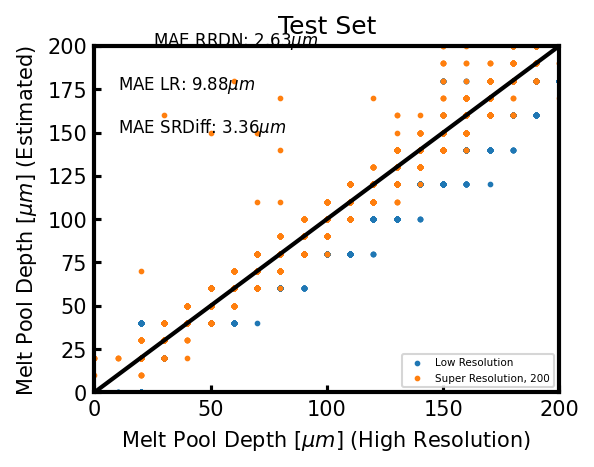

In [66]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(max_depth_gt, max_depth_input, s = 3.0, label = 'Low Resolution')
maes_depth = []
for max_depth, skips in zip(max_depth_diffs, [5,50]):
    plt.scatter(max_depth_gt, max_depth, s = 3.0, label = 'Super Resolution, {}'.format(timesteps//skips))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    mae_input = mean_absolute_error(max_depth_gt, max_depth_input)
    mae_depth_diff = mean_absolute_error(max_depth_gt, max_depth)
    maes_depth.append(mae_depth_diff)
    # print(mae_depth_diff, max_depth)
    mae_depth_enc = mean_absolute_error(max_depth_gt, max_depth_enc)
    # mae_depth_mbn = mean_absolute_error(max_depth_gt, max_depth_mbn)
    plt.xlim(0,200)
    plt.ylim(0,200)
    frame_tick()
plt.xlabel(r'Melt Pool Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Melt Pool Depth [$\mu m]$ (Estimated) ')
plt.title('Test Set')
plt.text(10, 25 + 150,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(10, 25 + 125,r'MAE SRDiff: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
plt.text(25, 200,r'MAE RRDN: {:.03}$\mu m$'.format(mae_depth_enc), fontsize = 8 )
# plt.text(25, 175,r'MAE MobileNet: {:.03}$\mu m$'.format(mae_depth_mbn), fontsize = 8 )
plt.legend(fontsize = 5, loc = 'lower right')
plt.show()

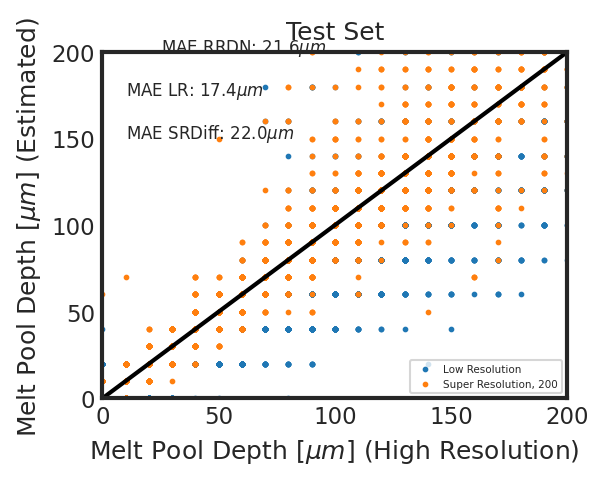

In [69]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(kp_depth_gt, kp_depth_input, s = 3.0, label = 'Low Resolution')
maes_depth = []
for max_depth, skips in zip(max_depth_diffs, [5,50]):
    plt.scatter(kp_depth_gt, kp_depth_diff, s = 3.0, label = 'Super Resolution, {}'.format(timesteps//skips))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    mae_input = mean_absolute_error(kp_depth_gt, max_depth_input)
    mae_depth_diff = mean_absolute_error(kp_depth_gt, max_depth)
    maes_depth.append(mae_depth_diff)
    # print(mae_depth_diff, max_depth)
    mae_depth_enc = mean_absolute_error(kp_depth_gt, max_depth_enc)
    # mae_depth_mbn = mean_absolute_error(max_depth_gt, max_depth_mbn)
    plt.xlim(0,200)
    plt.ylim(0,200)
    frame_tick()
plt.xlabel(r'Melt Pool Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Melt Pool Depth [$\mu m]$ (Estimated) ')
plt.title('Test Set')
plt.text(10, 25 + 150,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(10, 25 + 125,r'MAE SRDiff: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
plt.text(25, 200,r'MAE RRDN: {:.03}$\mu m$'.format(mae_depth_enc), fontsize = 8 )
# plt.text(25, 175,r'MAE MobileNet: {:.03}$\mu m$'.format(mae_depth_mbn), fontsize = 8 )
plt.legend(fontsize = 5, loc = 'lower right')
plt.show()

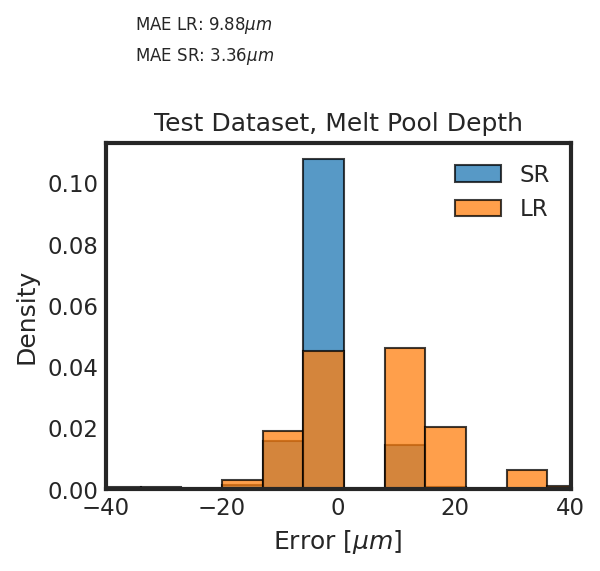

In [67]:
# plt.scatter(max_depth_gt, max_depth_diffs[0])
# plt.plot(max_depth_gt, max_depth_diffs[1], '.')
# !pip install seaborn
import seaborn as sns
plt.figure(dpi = 150, figsize = [4,3])
sns.set_theme(style="white", palette=None)
plt.text(-35, 0.150,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(-35, 0.140,r'MAE SR: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
bins=np.histogram(np.hstack((np.array(max_depth_gt) - np.array(max_depth_diffs[0]),np.array(max_depth_gt) - np.array(max_depth_input))), bins=40)[1] #get the bin edges
plt.hist(np.array(max_depth_gt) - np.array(max_depth_diffs[0]), density = True, bins = bins, alpha = 0.75, edgecolor = 'k', label = 'SR')
# plt.show()
plt.hist(np.array(max_depth_gt) - np.array(max_depth_input), density = True, bins = bins, alpha = 0.75, edgecolor = 'k', label = 'LR')
plt.xlim([-40, 40])
plt.ylabel('Density')
plt.legend(frameon  = False)
plt.xlabel(r'Error [$\mu m$]')
plt.title('Test Dataset, Melt Pool Depth')
frame_tick()
plt.show()


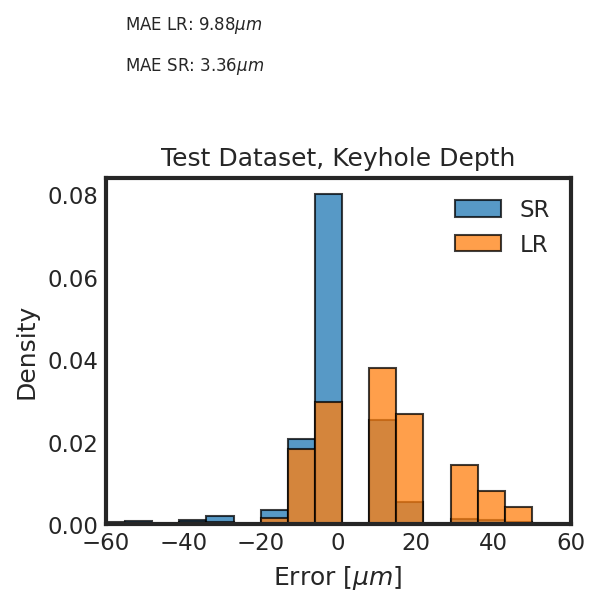

In [68]:
# plt.scatter(max_depth_gt, max_depth_diffs[0])
# plt.plot(max_depth_gt, max_depth_diffs[1], '.')
plt.figure(dpi = 150, figsize = [4,3])
plt.text(-55, 0.120,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(-55, 0.110,r'MAE SR: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
bins=np.histogram(np.hstack((np.array(max_depth_gt) - np.array(max_depth_diffs[0]),np.array(max_depth_gt) - np.array(max_depth_input))), bins=40)[1] #get the bin edges
plt.hist(np.array(kp_depth_gt) - np.array(kp_depth_diffs[0]), density = True, bins = bins, alpha = 0.75, edgecolor = 'k', label = 'SR')
# plt.show()
plt.hist(np.array(kp_depth_gt) - np.array(kp_depth_input), density = True, bins = bins, alpha = 0.75, edgecolor = 'k', label = 'LR')
plt.xlim([-60, 60])
plt.legend(frameon = False)
plt.ylabel('Density')
plt.xlabel(r'Error [$\mu m$]')
plt.title('Test Dataset, Keyhole Depth')
frame_tick()
plt.show()


[3.7854545454545456]


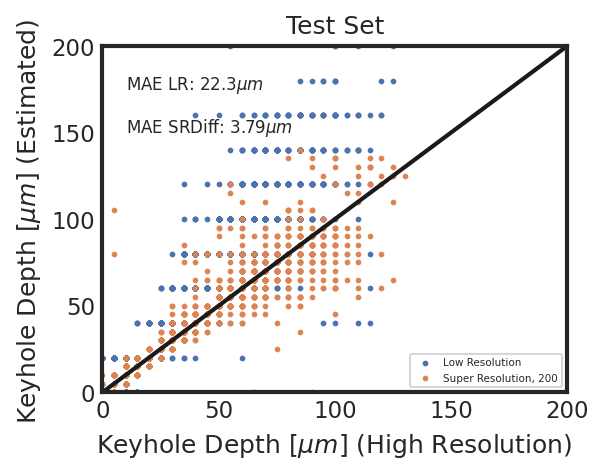

In [66]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(kp_depth_gt, kp_depth_input, s = 3.0, label = 'Low Resolution')
maes_depth = []
for kp_depth, skips in zip(kp_depth_diffs, [5,50]):
    plt.scatter(kp_depth_gt, kp_depth, s = 3.0, label = 'Super Resolution, {}'.format(timesteps//skips))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    mae_input = mean_absolute_error(kp_depth_gt, kp_depth_input)
    mae_depth_diff = mean_absolute_error(kp_depth_gt, kp_depth)
    maes_depth.append(mae_depth_diff)
    # print(mae_depth_diff, max_depth)
    # mae_depth_enc = mean_absolute_error(max_depth_gt, max_depth_enc)
    # mae_depth_mbn = mean_absolute_error(max_depth_gt, max_depth_mbn)
    plt.xlim(0,200)
    plt.ylim(0,200)
    frame_tick()
    print(maes_depth)
plt.xlabel(r'Keyhole Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Keyhole Depth [$\mu m]$ (Estimated) ')
plt.title('Test Set')
plt.text(10, 25+ 150,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(10, 25+ 125,r'MAE SRDiff: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
# plt.text(25, 200,r'MAE RRDN: {:.03}$\mu m$'.format(mae_depth_enc), fontsize = 8 )
# plt.text(25, 175,r'MAE MobileNet: {:.03}$\mu m$'.format(mae_depth_mbn), fontsize = 8 )
plt.legend(fontsize = 5, loc = 'lower right')
plt.show()

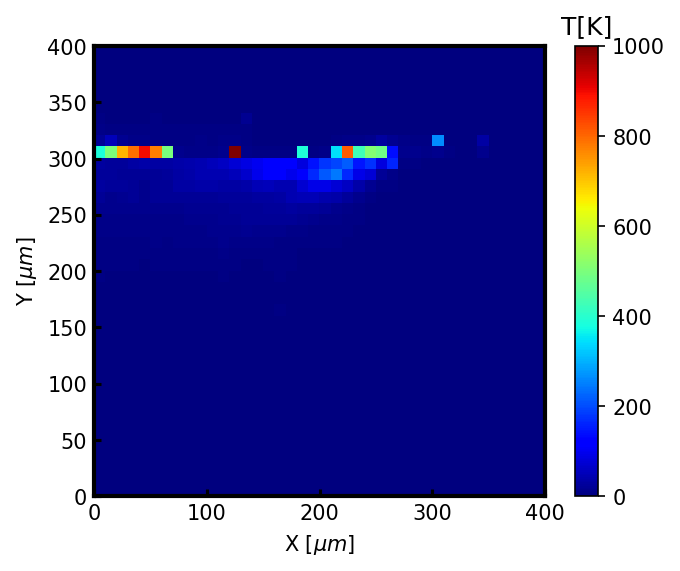

In [ ]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
plt.imshow(np.std(np.array(results), axis = 0).T, origin = 'lower', cmap = 'jet', vmin = 0, vmax = 1000, extent = [0, 400, 0, 400])
clb = plt.colorbar()
clb.ax.set_title('T[K]')
plt.xlabel(r'X [$\mu m$]')
plt.ylabel(r'Y [$\mu m$]')

frame_tick()

In [ ]:
import json
plt.figure(dpi =150)
frame_tick()
ssims_diff_loaded = json.load(open('trained_steps_dev_ssims_diff.json'))
ssims_loaded = [np.mean(load) for load in ssims_diff_loaded]
plt.plot(np.array(1500/np.array([1, 2, 3, 5, 10, 15, 20, 50])), ssim_mean_lr*np.ones_like([1, 2, 3, 5, 10, 15, 20, 50]), label = 'Low Resolution Input')

# plt.plot([1, 2, 3, 5, 10, 15, 20, 50], ssim_mean_lr*np.ones_like([1, 2, 3, 5, 10, 15, 20, 50]), label = 'Low Resolution Input')
plt.plot(np.array([500, 1000, 1500,2000]), ssims_loaded, 'rx--', label = 'DDPM Super Resolution Output')
plt.plot(np.array(1500/np.array([1, 2, 3, 5, 10, 15, 20, 50])), ssim_mean_diff, 'kx--', label = 'DDIM Super Resolution Output')
plt.ylim([0, 1])
plt.legend()
plt.xlabel('Sampling Time Reduction Factor')
# plt.xlim([0,52])
plt.ylabel(r'SSIM')
plt.grid()
plt.title("DDIM Sampling, Validation data")

In [ ]:
import json
plt.figure(dpi =150)
frame_tick()
title = '$L_1$ '
fname = 'l1'
field_diff = l1_mean_diff
field_lr = l1_mean_lr
diff_loaded = json.load(open('trained_steps_dev_{}_diff.json'.format(fname)))
loaded = [np.mean(load) for load in diff_loaded]
plt.plot(np.array(1500/np.array([1, 2, 3, 5, 10, 15, 20, 50])), field_lr*np.ones_like([1, 2, 3, 5, 10, 15, 20, 50]), label = 'Low Resolution Input')

# plt.plot([1, 2, 3, 5, 10, 15, 20, 50], ssim_mean_lr*np.ones_like([1, 2, 3, 5, 10, 15, 20, 50]), label = 'Low Resolution Input')
plt.plot(np.array([500, 1000, 1500,2000]), loaded, 'rx--', label = 'DDPM Super Resolution Output')
plt.plot(np.array(1500/np.array([1, 2, 3, 5, 10, 15, 20, 50])), field_diff, 'kx--', label = 'DDIM Super Resolution Output')
plt.ylim([0, 300])
plt.legend()
plt.xlabel('Diffusion Steps')
# plt.xlim([0,52])
plt.ylabel(r'{}'.format(title))
plt.grid()
plt.title("DDIM vs DDPM Sampling, Validation data")

In [ ]:
# print(psnr_mean_lr)
# print(psnr_mean_diff)
# print(ssim_mean_lr)
# print(ssim_mean_diff)
# print(l1_mean_lr)
plt.plot(np.array(sample_times[::16])/16,l1_mean_diff, 'kx--')
plt.xlabel('Sample Generation Time [s]')
plt.ylabel(r'$L_1$ Error [K]')
plt.ylim([0, 100])
plt.xlim([0, 6])
frame_tick()
# plt.plot(sample_times[::16],timesteps/np.array([1, 2, 3, 5, 10, 15, 20, 50]))

# sample_times[::16]
# 128/8


In [ ]:
# plt.plot(sample_diff_steps,psnr_mean_lr)
# plt.plot(sample_diff_steps, psnr_mean_diff)

# ssims_lr
# ssims_diff
import json

In [ ]:
outpath = "psnrs_diff.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(psnrs_diff))
outpath = "psnrs_lr.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(psnrs_lr))
outpath = "ssims_diff.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(ssims_diff))
outpath = "ssims_lr.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(ssims_lr))
outpath = "l1_lr.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(l1_lr_numpy))
outpath = "l1_diff.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(l1_diff_numpy))

In [ ]:
l1_diff_numpy = [[l.item() for l in l1d] for l1d in l1_diff]
l1_lr_numpy = [[l.item() for l in l1d] for l1d in l1_lr]

In [ ]:
outpath = "psnr_lr.json"
with open(outpath, 'w') as f:
    f.write(json.dumps(psnrs_lr))

In [ ]:
ssims_diff_loaded = json.load(open('l1_lr.json'))
ssims_loaded = [np.mean(load) for load in ssims_diff_loaded]
plt.plot(ssims_loaded)

In [ ]:
plt.plot(ssim_mean_lr)
plt.plot(ssim_mean_diff)

In [ ]:
plt.plot(l1_mean_lr)
plt.plot(l1_mean_diff)

In [ ]:
# kp_depth_diffs# get_inst_profile(result_diffusion)
# batch_idx
sample_times

In [ ]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(max_depth_gt, max_depth_input, s = 3.0, label = 'Low Resolution')
maes_depth = []
for max_depth, sim in zip(max_depth_diffs, [simlinear500, simlinear1000, simlinear1500, simlinear2000]):
    plt.scatter(max_depth_gt, max_depth, s = 3.0, label = 'Super Resolution, {}'.format(sim.diff_steps))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    mae_input = mean_absolute_error(max_depth_gt, max_depth_input)
    mae_depth_diff = mean_absolute_error(max_depth_gt, max_depth)
    maes_depth.append(mae_depth_diff)
    print(mae_depth_diff, max_depth)
    # mae_depth_enc = mean_absolute_error(max_depth_gt, max_depth_enc)
    # mae_depth_mbn = mean_absolute_error(max_depth_gt, max_depth_mbn)
    plt.xlim(0,300)
    plt.ylim(0,300)
    frame_tick()
plt.xlabel(r'Melt Pool Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Melt Pool Depth [$\mu m]$ (Estimated) ')
plt.title('Validation Set')
plt.text(25, 250,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(25, 225,r'MAE SRDiff: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
# plt.text(25, 200,r'MAE RRDN: {:.03}$\mu m$'.format(mae_depth_enc), fontsize = 8 )
# plt.text(25, 175,r'MAE MobileNet: {:.03}$\mu m$'.format(mae_depth_mbn), fontsize = 8 )
plt.legend(fontsize = 5, loc = 'lower right')
plt.show()

In [ ]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(max_depth_gt, max_depth_input, s = 3.0, label = 'Low Resolution')
kps_depth = []
maes_depth = []

for max_depth, sim in zip(max_depth_diffs, [simlinear500, simlinear1000, simlinear1500, simlinear2000]):
    plt.scatter(max_depth_gt, max_depth, s = 3.0, label = 'Super Resolution, {}'.format(sim.diff_steps))
    # plt.scatter(max_depth_gt, max_depth_enc, s = 3.0, label = 'Super Resolution')
    # plt.scatter(max_depth_gt, max_depth_mbn, s = 3.0, label = 'Super Resolution')

    mae_input = mean_absolute_error(max_depth_gt, max_depth_input)
    mae_depth_diff = mean_absolute_error(max_depth_gt, max_depth)
    maes_depth.append(mae_depth_diff)
    print(mae_depth_diff, max_depth)
    kps_depth.append()
    # mae_depth_enc = mean_absolute_error(max_depth_gt, max_depth_enc)
    # mae_depth_mbn = mean_absolute_error(max_depth_gt, max_depth_mbn)
    plt.xlim(0,300)
    plt.ylim(0,300)
    frame_tick()
plt.xlabel(r'Melt Pool Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Melt Pool Depth [$\mu m]$ (Estimated) ')
plt.title('Validation Set')
plt.text(25, 250,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(25, 225,r'MAE SRDiff: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
# plt.text(25, 200,r'MAE RRDN: {:.03}$\mu m$'.format(mae_depth_enc), fontsize = 8 )
# plt.text(25, 175,r'MAE MobileNet: {:.03}$\mu m$'.format(mae_depth_mbn), fontsize = 8 )
plt.legend(fontsize = 5, loc = 'lower right')
plt.show()

In [ ]:
plt.plot(steps_list[::12], maes_depth, '.')
frame_tick()
plt.xlabel('Sampling Timesteps')
plt.ylabel(r'$L_1$ Error: Melt Pool Depth')
plt.show()
frame_tick()

plt.plot(steps_list[::12], sample_times[::12], '.')
plt.xlabel('Sampling Timesteps')
plt.ylabel(r'Elapsed Time (s)')
plt.show()


plt.plot(steps_list[::12], maes_depth, '.')
frame_tick()
plt.xlabel('Sampling Timesteps')
plt.ylabel(r'$L_1$ Error: Melt Pool Depth')
plt.show()
frame_tick()


In [ ]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(kp_depth_gt, kp_depth_input, s = 3.0, label = 'Low Resolution')
plt.scatter(kp_depth_gt, kp_depth_diff, s = 3.0, label = 'Super Resolution')
plt.scatter(kp_depth_gt, kp_depth_enc, s = 3.0, label = 'Super Resolution')
plt.scatter(kp_depth_gt, kp_depth_mbn, s = 3.0, label = 'Super Resolution')


mae_input = mean_absolute_error(kp_depth_gt, kp_depth_input)
mae_depth_diff = mean_absolute_error(kp_depth_gt, kp_depth_diff)
mae_depth_enc = mean_absolute_error(kp_depth_gt, kp_depth_enc)
mae_depth_mbn = mean_absolute_error(kp_depth_gt, kp_depth_mbn)
plt.xlim(0,300)
plt.ylim(0,300)
frame_tick()
plt.xlabel(r'Keyhole Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Keyhole Depth [$\mu m]$ (Estimated) ')
plt.title('Validation Set')
plt.text(25, 250,r'MAE LR: {:.03}$\mu m$'.format(mae_input), fontsize = 8 )
plt.text(25, 225,r'MAE SRDiff: {:.03}$\mu m$'.format(mae_depth_diff), fontsize = 8 )
plt.text(25, 200,r'MAE RRDN: {:.03}$\mu m$'.format(mae_depth_enc), fontsize = 8 )
plt.text(25, 175,r'MAE MobileNet: {:.03}$\mu m$'.format(mae_depth_mbn), fontsize = 8 )   
plt.show()

In [ ]:
import sklearn
from sklearn.metrics import mean_absolute_error
plt.figure(figsize = [4,3], dpi = 150)
plt.plot(np.arange(300),np.arange(300), 'k-', linewidth = 2.0)
plt.scatter(kp_depth_gt, kp_depth_input, s = 3.0, label = 'Low Resolution')
plt.scatter(kp_depth_gt, kp_depth_diff, s = 3.0, label = 'Super Resolution')
plt.scatter(kp_depth_gt, kp_depth_enc, s = 3.0, label = 'Super Resolution')

mae_input = mean_absolute_error(kp_depth_gt, kp_depth_input)
mae_depth = mean_absolute_error(kp_depth_gt, kp_depth_enc)

plt.xlim(0,300)
plt.ylim(0,300)
frame_tick()
plt.xlabel(r'Melt Pool Depth [$\mu m]$ (High Resolution) ')
plt.ylabel(r'Melt Pool Depth [$\mu m]$ (Estimated) ')
plt.title('Test Set')
plt.text(25, 250,r'MAE LR: {:.03}$\mu m$'.format(mae_input) )
plt.text(25, 225,r'MAE SR: {:.03}$\mu m$'.format(mae_depth) )
plt.show()

In [ ]:
def plot_temp_lines(input, result, target, modeltype, split = 'train'):
    scaling_factor = 1.5
    dpi = 90
    min_temp = 293
    max_temp = 8000
    method = 'direct'
    plt.figure(dpi = dpi, figsize = np.array([4,3])*scaling_factor)
    plt.title(r'{} model, Cross section: x = 200 $\mu m$'.format(modeltype))
    plt.plot(80*5*(np.arange(input.shape[-1])/input.shape[-1]),input[0][10,:],label = 'Low-Resolution Input')
    plt.plot(80*5*(np.arange(target.shape[-1])/target.shape[-1]),target[40,:], label = 'High-Resolution Input') 
    plt.plot(80*5*(np.arange(target.shape[-1])/target.shape[-1]),result[40,:], label = 'Output')
    legend()
    plt.ylabel(r'$T [K]$')
    plt.xlabel(r'$z [\mu m$]')
    frame_tick()
    plt.ylim(min_temp, max_temp)
    plt.xlim(0, 400)
    plt.show()
plot_temp_lines(input, result_diffusion[0], target[0][0], split = 'test', modeltype = "Diffusion")
plot_temp_lines(input, lr_enc_result[0][0], target[0][0], split = 'test', modeltype = "Encoder")


In [23]:
def plot_srdiff_contours(input, result, target, modeltype, split = 'train', max_temp = 5000, min_temp = 293, dpi = 90, scaling_factor = 1.5, method = 'Direct'):
    profile_result, kp_result = get_profile(result)

    profile_gt, kp_gt = get_profile(target)
    profile_input, kp_input = get_profile(input, mesh = 20)

    plt.figure(dpi = 150, figsize = np.array([4,3])*1.25)
    plt.plot(20*np.arange(20), kp_input*20 - 400, '--', label = 'Low Resolution (Input)')
    plt.plot(5*np.arange(80), kp_result*5 - 400, label = 'Super Resolution (Output)' )
    plt.plot(5*np.arange(80), kp_gt*5 - 400, 'k', linewidth = 2.0, label = 'High Resolution')
    frame_tick()

    legend()
    plt.title('[{} Data] Keyhole Depth, {}'.format(split, modeltype), fontsize = 10)
    plt.xlabel(r'x [$\mu m$] ')
    plt.ylabel(r'z [$\mu m$] ')
    plt.show()

    plt.figure(dpi = 150, figsize = np.array([4,3])*1.25)
    plt.plot(20*np.arange(20),profile_input*20 - 400, '--', label = 'Low Resolution (Input)')
    plt.plot(5*np.arange(80), profile_result*5 - 400, label = 'Super Resolution (Output)' )
    plt.plot(5*np.arange(80),profile_gt*5 - 400, 'k', linewidth = 2.0, label = 'High Resolution')
    frame_tick()

    legend()
    plt.title('[{} Data] Melt Pool Depth, {}'.format(split, modeltype), fontsize = 10)
    plt.xlabel(r'x [$\mu m$] ')
    plt.ylabel(r'z [$\mu m$] ')
    plt.show()
input, lr_enc_result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
print(input.shape)
input, result_diffusion, target = predict_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, train_dataset)
input, result_mobilenet, target = predict_mobilenet(mobilenet,res, hr, lr, upscaled_lr, train_dataset)
plot_srdiff_contours(input, result_diffusion, target[0], split = 'Train', modeltype = "Diffusion")
plot_srdiff_contours(input, lr_enc_result, target[0], split = 'Train', modeltype = "Encoder")
plot_srdiff_contours(input, result_mobilenet, target[0], split = 'Train', modeltype = "MobileNet")


plot_images(input[0], lr_enc_result[0,0], target[0][0], split = 'Train', modeltype = "Encoder")
plot_images(input[0], result_mobilenet[0,0], target[0][0], split = 'Train', modeltype = "MobileNetSISR")
plot_images(input[0], result_diffusion[0], target[0][0], split = 'Train', modeltype = "Diffusion")


(1, 1, 20, 20)
200 [1] 1
torch.Size([1, 64, 40, 40])
TIMESTEPS == 200, Schedule = linear


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]


RuntimeError: The size of tensor a (40) must match the size of tensor b (80) at non-singleton dimension 3

In [ ]:
profile_result, kp_result = get_profile(result_diffusion)
profile_mbn_result, kp_mbn_result = get_profile(result_mobilenet)
profile_enc_result, kp_enc_result = get_profile(lr_enc_result)
plt.step(5*np.arange(80), profile_result - 400, label = 'Super Resolution (Output)' )
plt.step(5*np.arange(80), profile_enc_result - 400, label = 'Super Resolution (Output)' )
plt.step(5*np.arange(80), profile_mbn_result - 400, label = 'Super Resolution (Output)' )


In [ ]:
lrpsnrs = []

lrencpsnrs = []
diffpsnrs = []
mobilenetpsnrs = []
lrl1loss = []
lrencl1loss = []
diffl1loss = []
mobilenetl1loss= []
mobilenetssims = []
lrssims = []
diffssims = []
lrencssims = []


def SSIM(op, t, batch_size):
    ssim = 0 
    print(op.shape, t.shape)
    for i in range(op.shape[0]):

        # print(out[0,0].size())
        # print(op.shape, t.shape)
        if isinstance(op, torch.Tensor):
            score = ssim_id(op[0][0].detach().cpu().numpy(), t[0][0].detach().cpu().numpy())#, full=True)
        else:
            print(op[0].shape,t[0][0].detach().cpu().numpy().shape)
            score = ssim_id(op[0], t[0][0].detach().cpu().numpy())#, full=True)
        ssim+=score/batch_size
    
        #print("SSIM: {}".format(score))
    return ssim
l1loss = nn.L1Loss()
for batch_idx, (res, hr, lr, upscaled_lr) in enumerate(dev_dataloader):  
    upscale = dev_dataset.unscale_data(upscaled_lr, input_type = 'upscaled_lr')
    input, lr_enc_result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, dev_dataset)
    print(input.shape)
    input, result_diffusion, target = predict_diffusion(model, lr_enc, res, hr, lr, upscaled_lr,dev_dataset)
    input, result_mobilenet, target = predict_mobilenet(mobilenet,res, hr, lr, upscaled_lr, dev_dataset)
    
    lrpsnr = PSNR(upscale, target, target.shape[0]).item()
    lrencpsnr = PSNR(lr_enc_result, target, target.shape[0]).item()

    diffpsnr = PSNR(result_diffusion, target, target.shape[0]).item()

    mobilenetpsnr = PSNR(result_mobilenet, target, target.shape[0]).item()

    print('LR PSNR: ', lrpsnr)
    print('LR enc PSNR: ',PSNR(lr_enc_result, target, target.shape[0])) 
    print('Diffusion PSNR: ',PSNR(result_diffusion, target, target.shape[0])) 
    print('MobileNet PSNR: ',PSNR(result_mobilenet, target, target.shape[0])) 
    print('LR SSIM: ',  SSIM(upscale.view(upscale.shape[0],1 , upscale.shape[1], upscale.shape[2]), target, target.shape[0]))
    print('LR enc SSIM: ',  SSIM(lr_enc_result, target, target.shape[0]))
    print('Diffusion SSIM: ',  SSIM(result_diffusion, target, target.shape[0]))
    print('MobileNet SSIM: ',  SSIM(result_mobilenet, target, target.shape[0]))
    lrssim = SSIM(upscale.view(upscale.shape[0],1 , upscale.shape[1], upscale.shape[2]), target, target.shape[0])
    lrencssim = SSIM(lr_enc_result, target, target.shape[0])
    diffssim = SSIM(result_diffusion, target, target.shape[0])
    mobilenetssim = SSIM(result_mobilenet, target, target.shape[0])

    (lr_enc_result, target)
    lrpsnrs.append(lrpsnr)
    lrencpsnrs.append(lrencpsnr)
    diffpsnrs.append(diffpsnr)
    lrssims.append(lrssim)#SSIM(lr_enc_result.view(lr_enc_result.shape[0],1 , lr_enc_result.shape[1], lr_enc_result.shape[2]), target, target.shape[0]))
    lrencssims.append(lrencssim)

    diffssims.append(diffssim)
    mobilenetssims.append(mobilenetssim)


    mobilenetpsnrs.append(mobilenetpsnr)
    lrl1loss.append(l1loss(upscale, target[:,0]).item())
    lrencl1loss.append(l1loss(lr_enc_result[:,0], target[:,0]).item())
    diffl1loss.append(l1loss(torch.tensor(result_diffusion), target[:,0]).item())
    mobilenetl1loss.append(l1loss(torch.tensor(result_mobilenet[:,0]), target[:,0]).item())





In [ ]:
isinstance(lr_enc_result, torch.Tensor)

In [ ]:
print(np.mean(lrl1loss))

In [ ]:
print(np.mean(lrencl1loss))

In [ ]:
print(np.mean(diffl1loss))

In [ ]:
print(np.mean(diffssims))
print(np.mean(mobilenetssims))
print(np.mean(lrencssims))
print(np.mean(lrssims))


In [ ]:
print(np.mean(mobilenetl1loss))


In [ ]:
np.mean(lrpsnrs)


In [ ]:
np.mean(lrencpsnrs)


In [ ]:
np.mean(mobilenetpsnr)


In [ ]:
np.mean(diffpsnrs)


In [ ]:
from skimage.metrics import structural_similarity as ssim_id
def SSIM(op, t, batch_size):
    ssim = 0 
    for i in range(op.shape[0]):

        score = ssim_id(op[0], t[0])#, full=True)
        ssim+=score/batch_size
    
        #print("SSIM: {}".format(score))
    return ssim
print('LR SSIM: ',  SSIM(lr_data, hr, hr.shape[0]))
print('SR SSIM: ',  SSIM(generated_hr, hr, hr.shape[0]))